# Simplified Workflow Ver2

In [71]:
import mne
import numpy as np 
import matplotlib.pyplot as plt
import torch
import os
import sklearn
from sklearn.pipeline import Pipeline
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import ShuffleSplit, cross_val_score, train_test_split
from torch.utils.data import DataLoader, Dataset
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms

from Data import download_EEGBCI


In [ ]:
if input("Are you sure you want to download the entire dataset? (Y/N)") in "Yy":
    total_subjects = list(range(1, 110))
    runs = list(range(1, 15))
    download_EEGBCI(total_subjects, runs, './EEGData', False)
    print("Downloaded everything!")

else:
    print("Download cancelled.")

In [17]:
main_folder = './EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0'
subdirectories = [f.path for f in os.scandir(main_folder) if f.is_dir()]

opened_files = []
closed_files = []

i = 0
for subdirectory in subdirectories:
    files = os.listdir(subdirectory)
    
    if len(files) > 0 and i not in [13, 50, 68, 96, 108]: # 13, 50, 68, 96, 108 idx does not have 9760 seq len
        for file in files:
            
            if file[-6:] == '01.edf':
                # This is data for eyes opened
                eyes_opened = os.path.join(subdirectory, file)
                print(eyes_opened)
                opened_files.append(eyes_opened)

            if file[-6:] == '02.edf':
                # This is data for eyes closed
                eyes_closed = os.path.join(subdirectory, file)
                print(eyes_closed)
                closed_files.append(eyes_closed)
    else:
        print(f"No files found in {subdirectory}")
    
    i += 1

./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S001\S001R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S001\S001R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S002\S002R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S002\S002R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S003\S003R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S003\S003R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S004\S004R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S004\S004R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S005\S005R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S005\S005R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S006\S006R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S006\S006R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S007\S007R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S007\S007R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S008\S008R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb

In [151]:
large_open_data = []    # This is a list of all the data for eyes opened
large_closed_data = []  # This is a list of all the data for eyes closed

for data in opened_files:
    value_open = mne.io.read_raw_edf(data, preload=True, verbose=False).get_data(verbose=False)
    if(len(value_open) == 64):
        large_open_data.append(value_open)

for data in closed_files:
    value_closed = mne.io.read_raw_edf(data, preload=True, verbose=False).get_data(verbose=False)
    if(len(value_closed) == 64):
        large_closed_data.append(value_closed)

print(large_open_data.__len__())   # This is the number of files for eyes opened
print(large_closed_data.__len__()) # This is the number of files for eyes closed



open_data = []
closed_data = []

for i in range(len(large_open_data)):
    if i not in [1,4,6,13,22,29,31,33,36,43,50,53,60,63,86,87,88,94,95,100,102]: # data that looks sussy
        open_data.append(large_open_data[i])

for i in range(len(large_closed_data)):
    if i not in [1,4,5,6,12,13,15,17,19,22,29,31,33,34.47,50,51,58,60,71,76,77,79,81,86,87,88,90,95,100]: # data that looks sussy
        closed_data.append(large_closed_data[i])   
        
training_data_open = np.array(open_data)
training_data_closed = np.array(closed_data)
print(np.shape(training_data_open))
print(np.shape(training_data_closed))

104
104
(83, 64, 9760)
(76, 64, 9760)


In [148]:
# Load the raw EEG data
edf_file = './EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R01.edf'
raw = mne.io.read_raw_edf(edf_file, preload=True, verbose=False)


def compute_psd(data, fs, nperseg=256, noverlap=None):
    """
    Compute Power Spectral Density (PSD) using the Welch method.

    Parameters:
        data (array): EEG data array with shape (n_channels, n_samples).
        fs (float): Sampling frequency.
        nperseg (int): Length of each segment for PSD estimation.
        noverlap (int): Number of overlapping samples between segments.
    
    Returns:
        freqs (array): Frequency values.
        psd (array): Power Spectral Density values.
    """
    n_channels, n_samples = data.shape
    psd = np.zeros((n_channels, nperseg // 2 + 1))

    for ch_idx in range(n_channels):
        f, Pxx = plt.psd(data[ch_idx], Fs=fs, NFFT=nperseg, noverlap=noverlap)
        # Add a small epsilon to avoid zero values
        psd[ch_idx] = Pxx + 1e-10

    return f, psd


# Get the EEG data using .get_data()
eeg_data = raw.get_data()
#eeg_data = large_closed_data[0]

# Set the sampling frequency
fs = raw.info['sfreq']

def average_across_arrays(generated_data):
    return generated_data.mean(dim=0)


eyes open


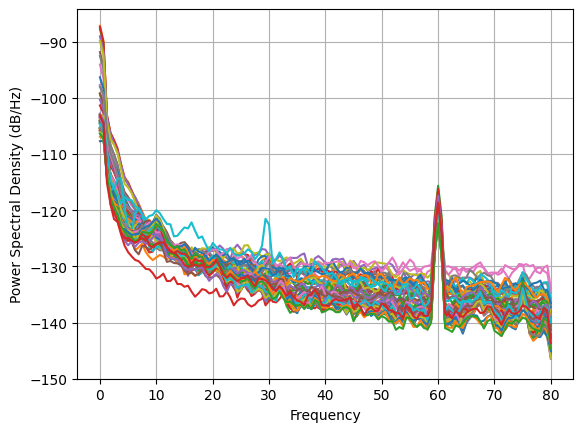

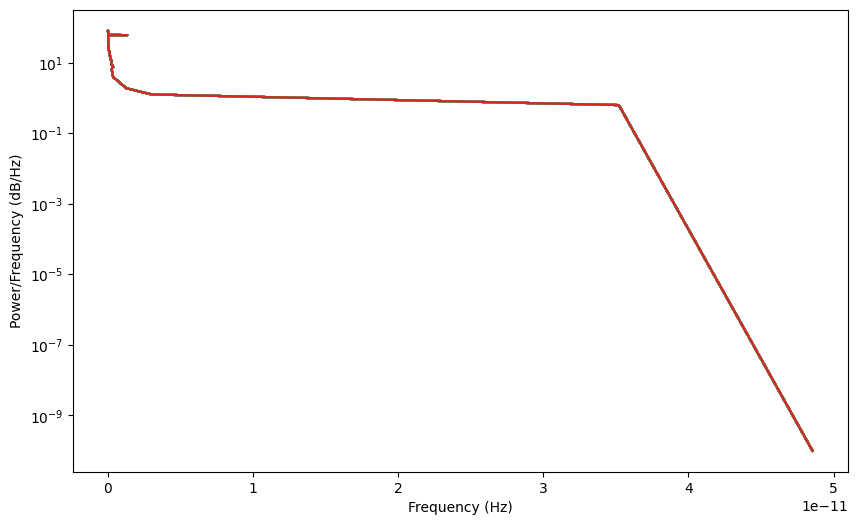

In [152]:
## open data
averaged_data = average_across_arrays(torch.tensor(training_data_open).detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')

print("eyes open")
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()


eyes closed


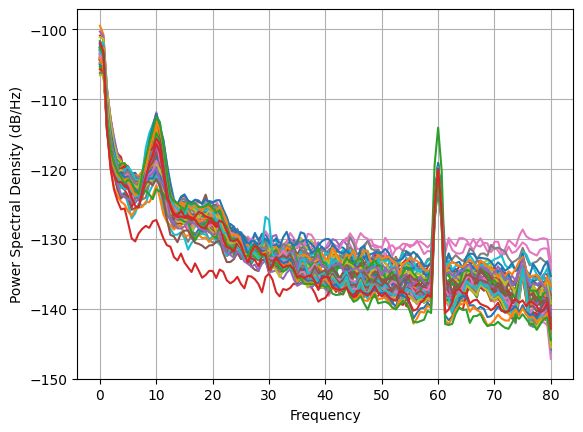

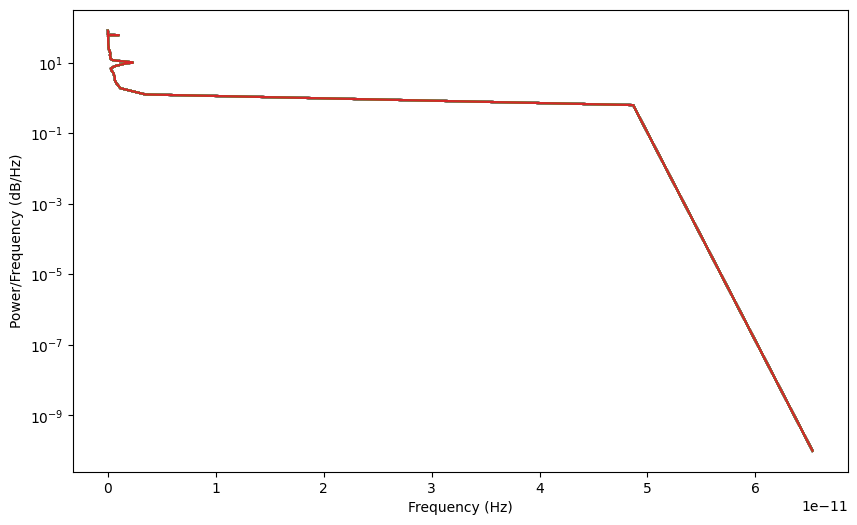

In [153]:

## closed data
averaged_data = average_across_arrays(torch.tensor(training_data_closed).detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')

print("eyes closed")
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()

# BASELINE

Epoch 0: Critic error ([1.6483993427979802]) Generator err ([-0.025171389803290367])


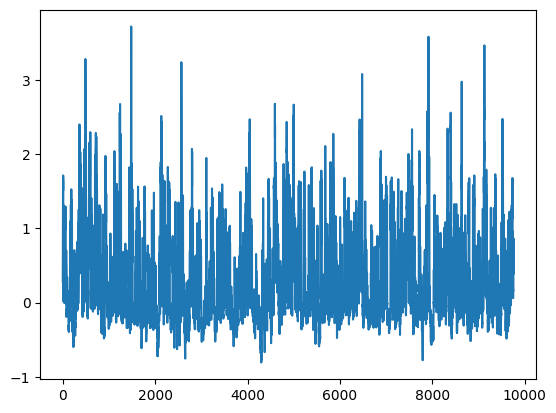

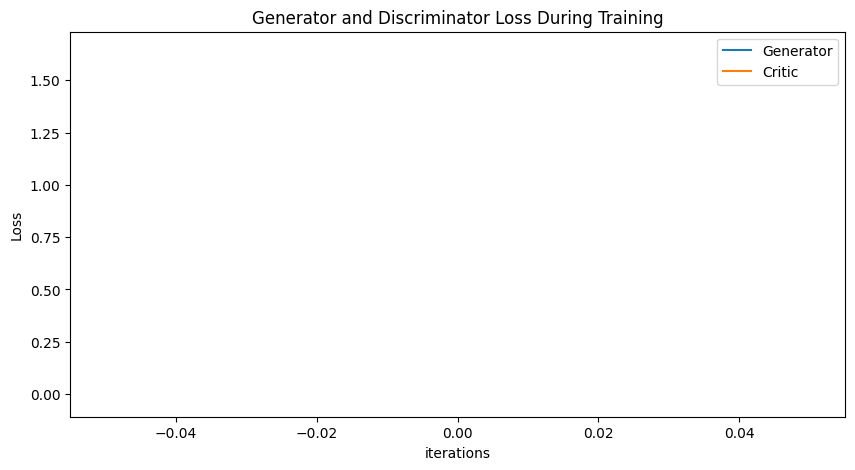

Epoch 10: Critic error ([1.6483993427979802, -0.0211659813846152, -0.007684373338464744, -0.06283266695740447, -0.0275683858723364, -0.049407171506422196, -0.05081119399011039, -0.1672020222632899, -0.46503071597606194, -1.0595361902071456, -1.36704197418471]) Generator err ([-0.025171389803290367, 0.0227452851831913, 0.013295899145305157, 0.12416356801986694, 0.09216929972171783, 0.10776695609092712, 0.14920355379581451, 0.2847522795200348, 0.6439281702041626, 1.1178398132324219, 2.6771364212036133])


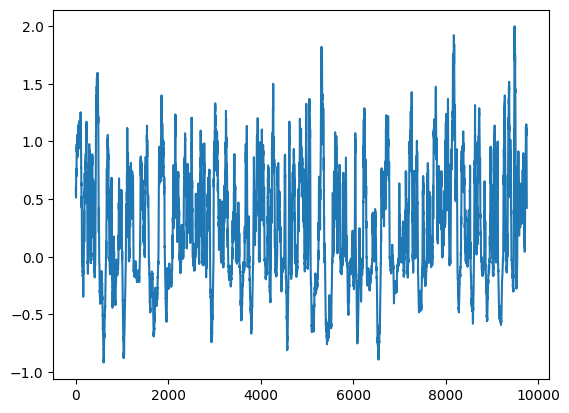

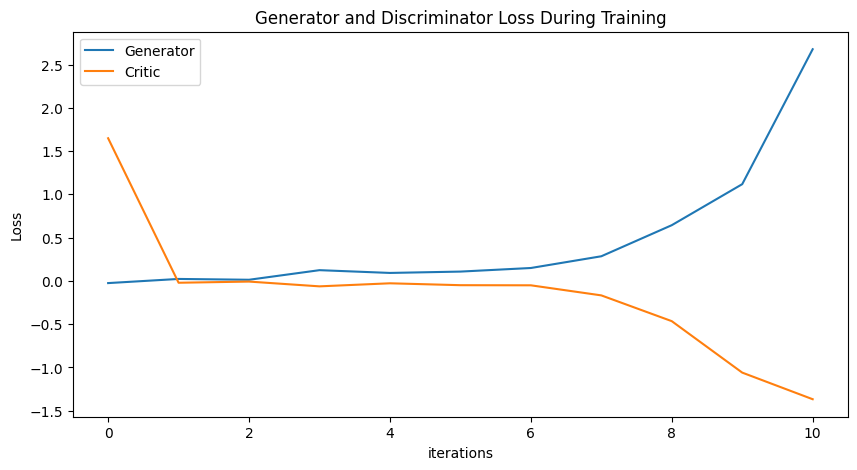

Epoch 20: Critic error ([1.6483993427979802, -0.0211659813846152, -0.007684373338464744, -0.06283266695740447, -0.0275683858723364, -0.049407171506422196, -0.05081119399011039, -0.1672020222632899, -0.46503071597606194, -1.0595361902071456, -1.36704197418471, -2.061983173271658, -1.7778154537271849, -3.022665920738235, -2.9897637836091913, -3.4340226573007717, -3.4161370854120356, -4.34170249797341, -3.4567567263688264, -4.46524877658536, -4.431641501403679]) Generator err ([-0.025171389803290367, 0.0227452851831913, 0.013295899145305157, 0.12416356801986694, 0.09216929972171783, 0.10776695609092712, 0.14920355379581451, 0.2847522795200348, 0.6439281702041626, 1.1178398132324219, 2.6771364212036133, 1.7489482164382935, 3.6692864894866943, 2.8888585567474365, 4.976682662963867, 3.4631152153015137, 6.232663154602051, 4.443178176879883, 6.325448989868164, 4.910367488861084, 7.129329204559326])


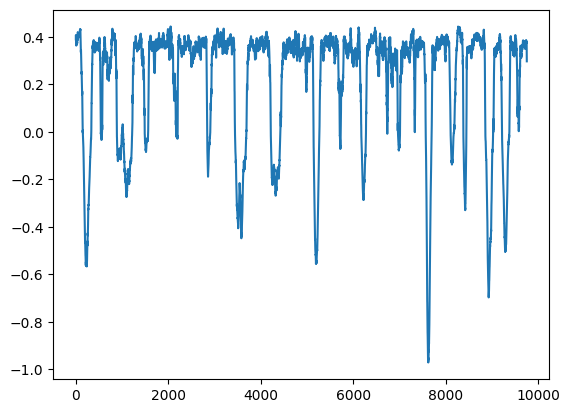

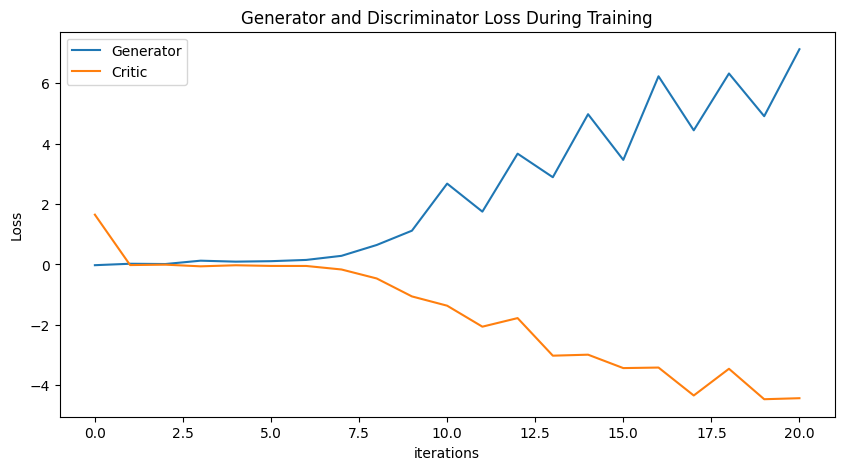

Epoch 30: Critic error ([1.6483993427979802, -0.0211659813846152, -0.007684373338464744, -0.06283266695740447, -0.0275683858723364, -0.049407171506422196, -0.05081119399011039, -0.1672020222632899, -0.46503071597606194, -1.0595361902071456, -1.36704197418471, -2.061983173271658, -1.7778154537271849, -3.022665920738235, -2.9897637836091913, -3.4340226573007717, -3.4161370854120356, -4.34170249797341, -3.4567567263688264, -4.46524877658536, -4.431641501403679, -4.825522507090477, -4.869148055297812, -4.5924666487169565, -4.582445784194956, -4.1506774460285705, -4.287724436640249, -4.158759540986461, -4.7992270416994245, -4.23000929462909, -4.212616786720761]) Generator err ([-0.025171389803290367, 0.0227452851831913, 0.013295899145305157, 0.12416356801986694, 0.09216929972171783, 0.10776695609092712, 0.14920355379581451, 0.2847522795200348, 0.6439281702041626, 1.1178398132324219, 2.6771364212036133, 1.7489482164382935, 3.6692864894866943, 2.8888585567474365, 4.976682662963867, 3.46311521

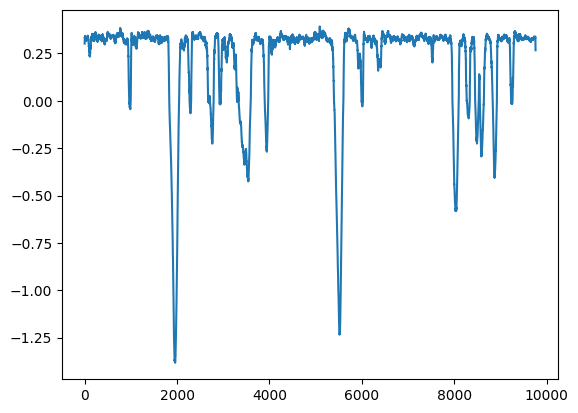

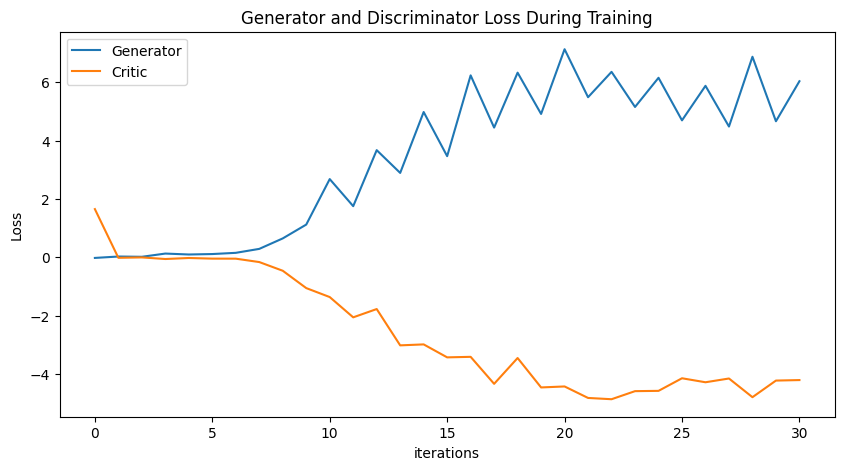

Epoch 40: Critic error ([1.6483993427979802, -0.0211659813846152, -0.007684373338464744, -0.06283266695740447, -0.0275683858723364, -0.049407171506422196, -0.05081119399011039, -0.1672020222632899, -0.46503071597606194, -1.0595361902071456, -1.36704197418471, -2.061983173271658, -1.7778154537271849, -3.022665920738235, -2.9897637836091913, -3.4340226573007717, -3.4161370854120356, -4.34170249797341, -3.4567567263688264, -4.46524877658536, -4.431641501403679, -4.825522507090477, -4.869148055297812, -4.5924666487169565, -4.582445784194956, -4.1506774460285705, -4.287724436640249, -4.158759540986461, -4.7992270416994245, -4.23000929462909, -4.212616786720761, -4.228330131232561, -4.083227889388162, -4.044838573098276, -3.9336299658732634, -3.922832049616106, -3.769105267858005, -3.7208277933597937, -3.6275902440105745, -3.7746124636012244, -3.607252607343807]) Generator err ([-0.025171389803290367, 0.0227452851831913, 0.013295899145305157, 0.12416356801986694, 0.09216929972171783, 0.10776

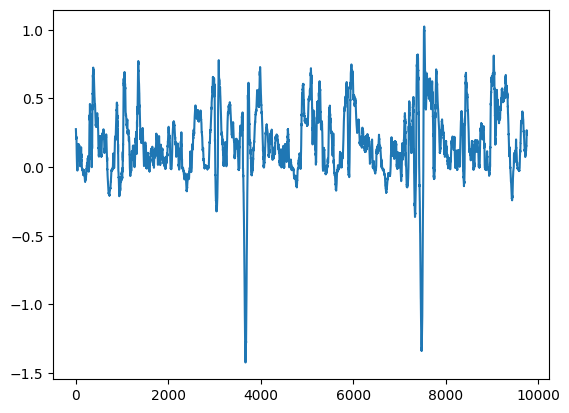

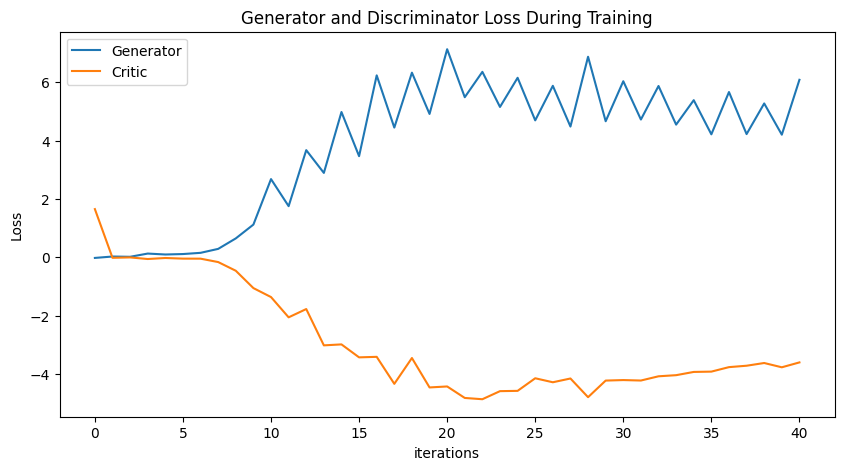

Epoch 50: Critic error ([1.6483993427979802, -0.0211659813846152, -0.007684373338464744, -0.06283266695740447, -0.0275683858723364, -0.049407171506422196, -0.05081119399011039, -0.1672020222632899, -0.46503071597606194, -1.0595361902071456, -1.36704197418471, -2.061983173271658, -1.7778154537271849, -3.022665920738235, -2.9897637836091913, -3.4340226573007717, -3.4161370854120356, -4.34170249797341, -3.4567567263688264, -4.46524877658536, -4.431641501403679, -4.825522507090477, -4.869148055297812, -4.5924666487169565, -4.582445784194956, -4.1506774460285705, -4.287724436640249, -4.158759540986461, -4.7992270416994245, -4.23000929462909, -4.212616786720761, -4.228330131232561, -4.083227889388162, -4.044838573098276, -3.9336299658732634, -3.922832049616106, -3.769105267858005, -3.7208277933597937, -3.6275902440105745, -3.7746124636012244, -3.607252607343807, -4.449992503997077, -4.009339222395995, -3.7748880533111855, -3.4381118333541534, -3.392143161054493, -3.181288070105647, -3.441064

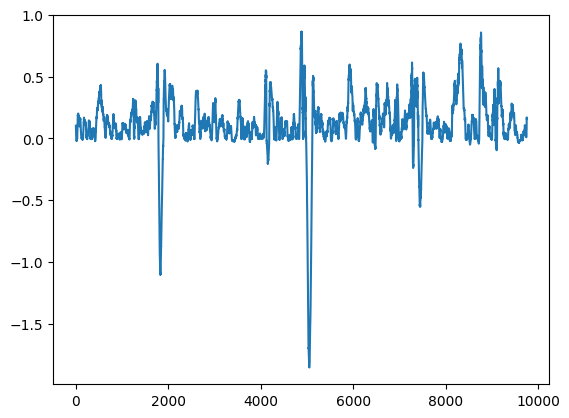

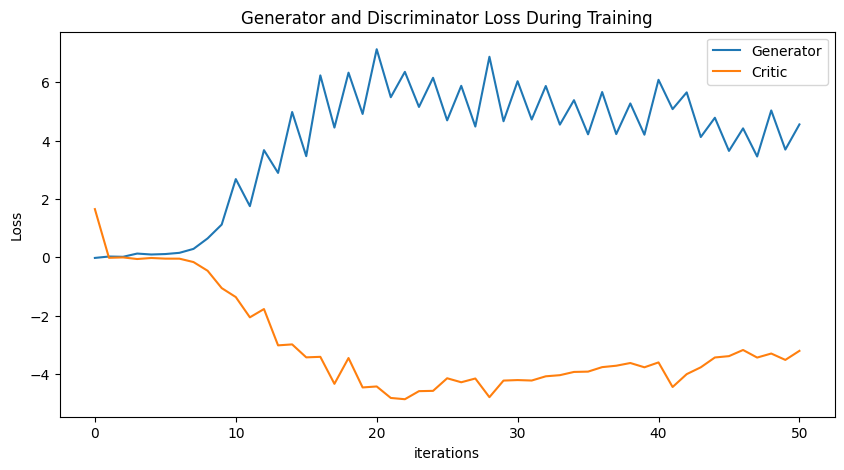

Epoch 60: Critic error ([1.6483993427979802, -0.0211659813846152, -0.007684373338464744, -0.06283266695740447, -0.0275683858723364, -0.049407171506422196, -0.05081119399011039, -0.1672020222632899, -0.46503071597606194, -1.0595361902071456, -1.36704197418471, -2.061983173271658, -1.7778154537271849, -3.022665920738235, -2.9897637836091913, -3.4340226573007717, -3.4161370854120356, -4.34170249797341, -3.4567567263688264, -4.46524877658536, -4.431641501403679, -4.825522507090477, -4.869148055297812, -4.5924666487169565, -4.582445784194956, -4.1506774460285705, -4.287724436640249, -4.158759540986461, -4.7992270416994245, -4.23000929462909, -4.212616786720761, -4.228330131232561, -4.083227889388162, -4.044838573098276, -3.9336299658732634, -3.922832049616106, -3.769105267858005, -3.7208277933597937, -3.6275902440105745, -3.7746124636012244, -3.607252607343807, -4.449992503997077, -4.009339222395995, -3.7748880533111855, -3.4381118333541534, -3.392143161054493, -3.181288070105647, -3.441064

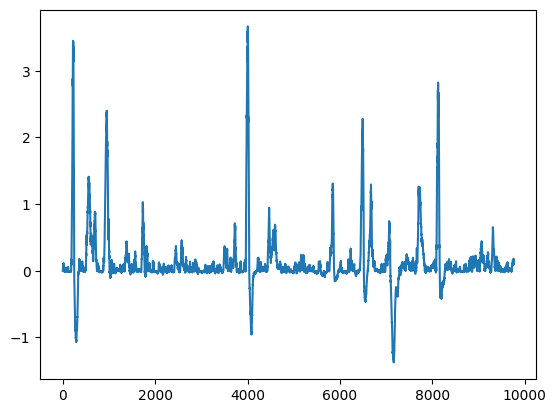

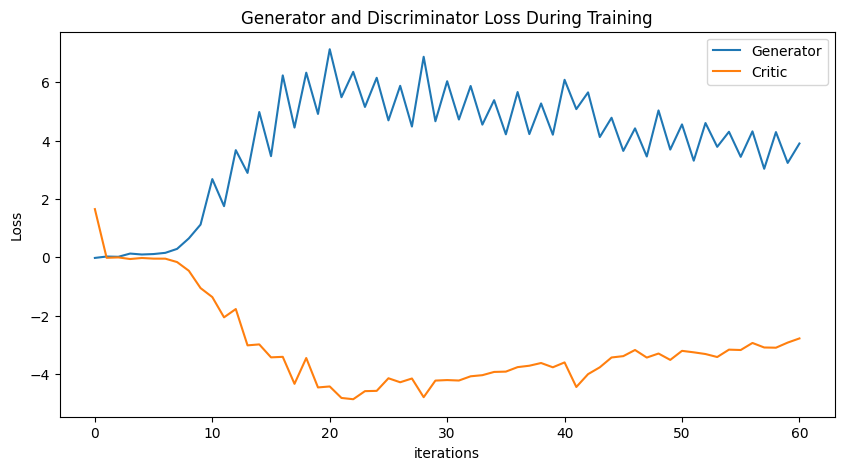

Epoch 70: Critic error ([1.6483993427979802, -0.0211659813846152, -0.007684373338464744, -0.06283266695740447, -0.0275683858723364, -0.049407171506422196, -0.05081119399011039, -0.1672020222632899, -0.46503071597606194, -1.0595361902071456, -1.36704197418471, -2.061983173271658, -1.7778154537271849, -3.022665920738235, -2.9897637836091913, -3.4340226573007717, -3.4161370854120356, -4.34170249797341, -3.4567567263688264, -4.46524877658536, -4.431641501403679, -4.825522507090477, -4.869148055297812, -4.5924666487169565, -4.582445784194956, -4.1506774460285705, -4.287724436640249, -4.158759540986461, -4.7992270416994245, -4.23000929462909, -4.212616786720761, -4.228330131232561, -4.083227889388162, -4.044838573098276, -3.9336299658732634, -3.922832049616106, -3.769105267858005, -3.7208277933597937, -3.6275902440105745, -3.7746124636012244, -3.607252607343807, -4.449992503997077, -4.009339222395995, -3.7748880533111855, -3.4381118333541534, -3.392143161054493, -3.181288070105647, -3.441064

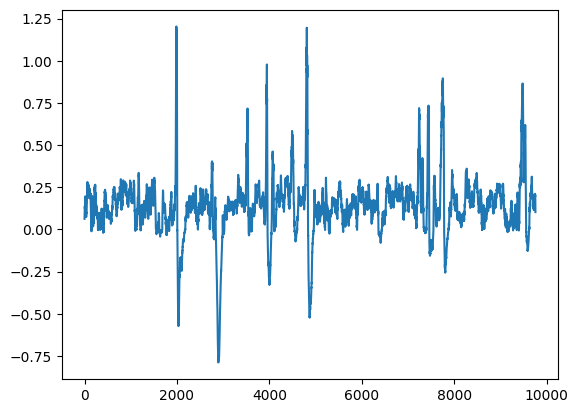

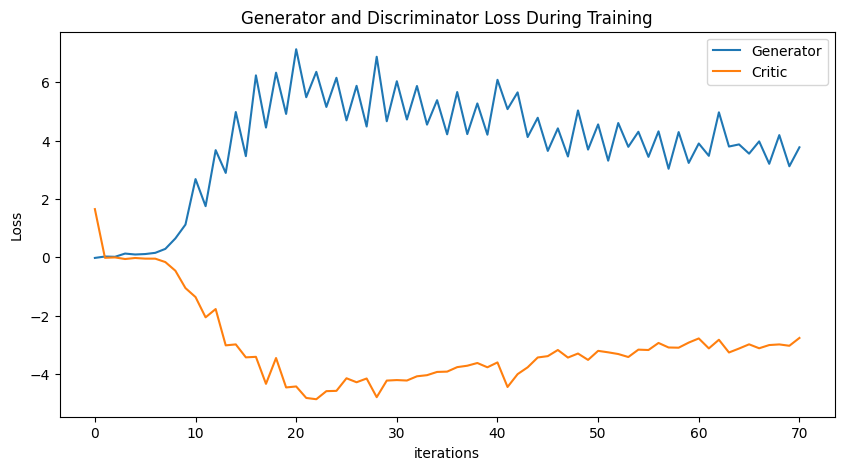

Epoch 80: Critic error ([1.6483993427979802, -0.0211659813846152, -0.007684373338464744, -0.06283266695740447, -0.0275683858723364, -0.049407171506422196, -0.05081119399011039, -0.1672020222632899, -0.46503071597606194, -1.0595361902071456, -1.36704197418471, -2.061983173271658, -1.7778154537271849, -3.022665920738235, -2.9897637836091913, -3.4340226573007717, -3.4161370854120356, -4.34170249797341, -3.4567567263688264, -4.46524877658536, -4.431641501403679, -4.825522507090477, -4.869148055297812, -4.5924666487169565, -4.582445784194956, -4.1506774460285705, -4.287724436640249, -4.158759540986461, -4.7992270416994245, -4.23000929462909, -4.212616786720761, -4.228330131232561, -4.083227889388162, -4.044838573098276, -3.9336299658732634, -3.922832049616106, -3.769105267858005, -3.7208277933597937, -3.6275902440105745, -3.7746124636012244, -3.607252607343807, -4.449992503997077, -4.009339222395995, -3.7748880533111855, -3.4381118333541534, -3.392143161054493, -3.181288070105647, -3.441064

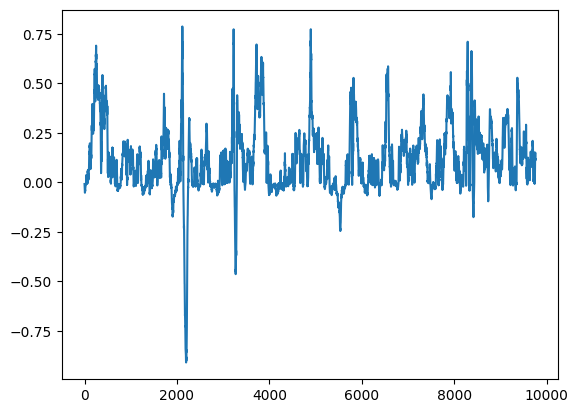

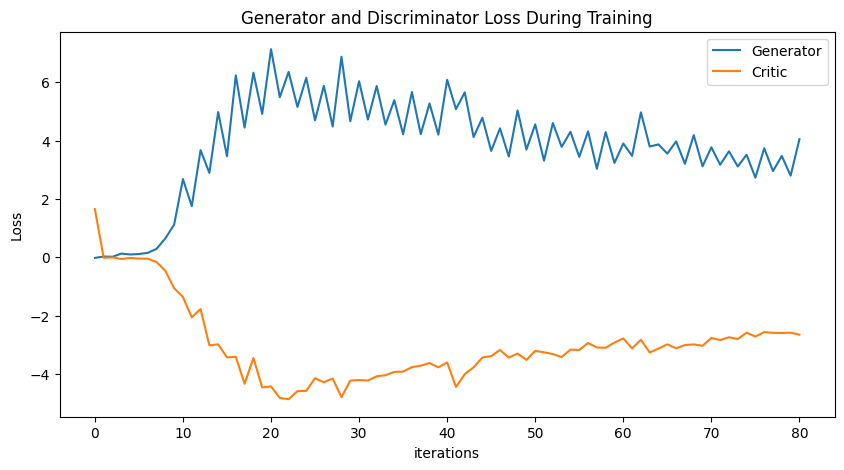

Epoch 90: Critic error ([1.6483993427979802, -0.0211659813846152, -0.007684373338464744, -0.06283266695740447, -0.0275683858723364, -0.049407171506422196, -0.05081119399011039, -0.1672020222632899, -0.46503071597606194, -1.0595361902071456, -1.36704197418471, -2.061983173271658, -1.7778154537271849, -3.022665920738235, -2.9897637836091913, -3.4340226573007717, -3.4161370854120356, -4.34170249797341, -3.4567567263688264, -4.46524877658536, -4.431641501403679, -4.825522507090477, -4.869148055297812, -4.5924666487169565, -4.582445784194956, -4.1506774460285705, -4.287724436640249, -4.158759540986461, -4.7992270416994245, -4.23000929462909, -4.212616786720761, -4.228330131232561, -4.083227889388162, -4.044838573098276, -3.9336299658732634, -3.922832049616106, -3.769105267858005, -3.7208277933597937, -3.6275902440105745, -3.7746124636012244, -3.607252607343807, -4.449992503997077, -4.009339222395995, -3.7748880533111855, -3.4381118333541534, -3.392143161054493, -3.181288070105647, -3.441064

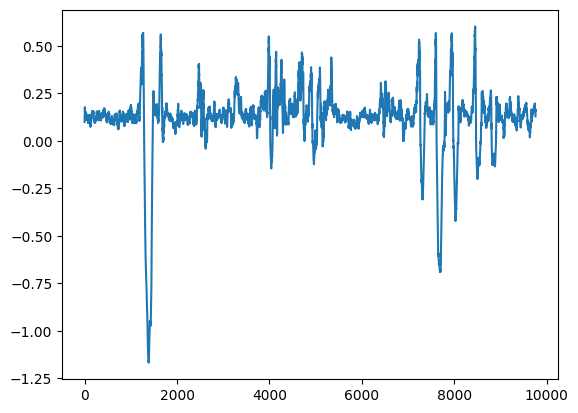

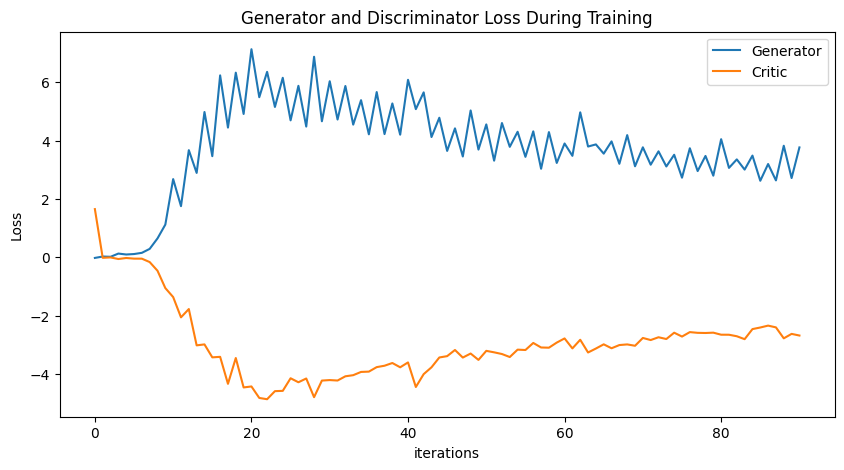

In [41]:
# baseline 

NUM_EPOCHS = 100
PRINT_INTERVAL = 10 # every 10 epoch, print status
BATCH_SIZE = np.shape(training_data_open)[0]
NUM_CHANNELS = 64
SEQUENCE_LENGTH = 9760
LAMBDA_GP = 5

training_data = torch.tensor(training_data_open)

def weights_init(model):
    for m in model.modules():
      if isinstance(m, (nn.Conv1d, nn.ConvTranspose1d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)

# Gaussian normal distribution
def sample_normal_distribution(i, j, k):
    mu = 0
    sigma = 0.02
    return torch.Tensor(np.random.normal(mu, sigma, (i, j, k)))

def gradient_penalty(D, real, fake):
    alpha = torch.rand((BATCH_SIZE, 1, 1)).repeat(1, NUM_CHANNELS, SEQUENCE_LENGTH)
    interpolated_seq = real * alpha + fake * (1 - alpha)

    # Calculate discriminator scores
    mixed_scores = D(interpolated_seq)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_seq,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            real = training_data.clone().detach()
            real.requires_grad=True
            noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
            fake = G(noise)
            critic_real = D(real).reshape(-1) # flatten
            critic_fake = D(fake).reshape(-1) # flatten
            gp = gradient_penalty(D, real, fake)
            critic_loss = -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
            D.zero_grad()
            critic_loss.backward(retain_graph=True)
            critic_optimizer.step()

        generated_data = fake
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()

        critic_err.append(critic_loss.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            values = generated_data[0, 0, :]
            plt.plot(values.tolist())
            plt.show()
            
            # plotting G vs D losses
            plt.figure(figsize=(10,5))
            plt.title("Generator and Discriminator Loss During Training")
            plt.plot(gen_err,label="Generator")
            plt.plot(critic_err,label="Critic")
            plt.xlabel("iterations")
            plt.ylabel("Loss")
            plt.legend()
            plt.show()

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_data, disc, gen = train()

torch.save(gen, 'gen.pt')
torch.save(disc, 'disc.pt')

torch.Size([64, 9760])


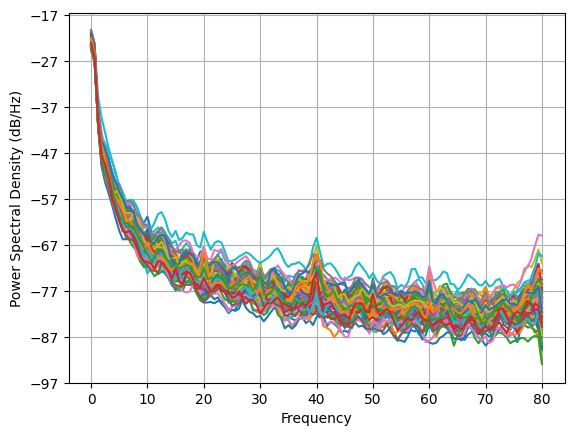

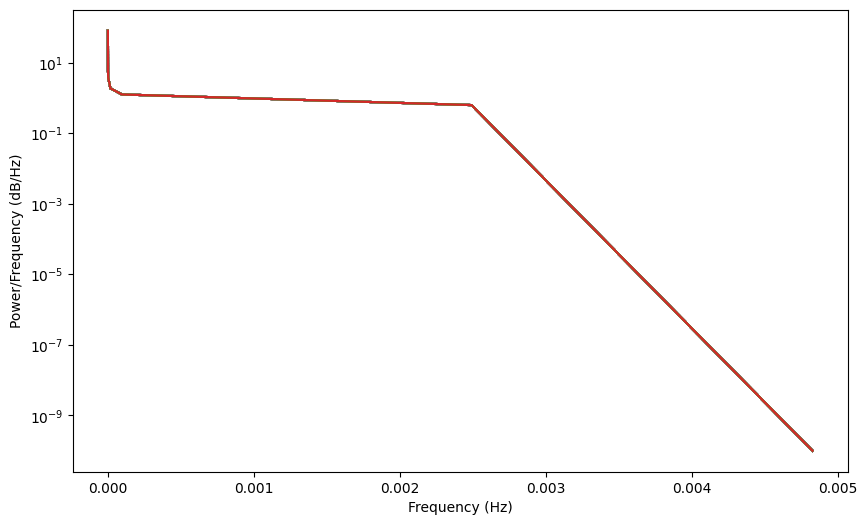

In [49]:
averaged_data = average_across_arrays(generated_data.detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()

Epoch 0: Critic error ([2.1781899440031416]) Generator err ([-0.007688348647207022])


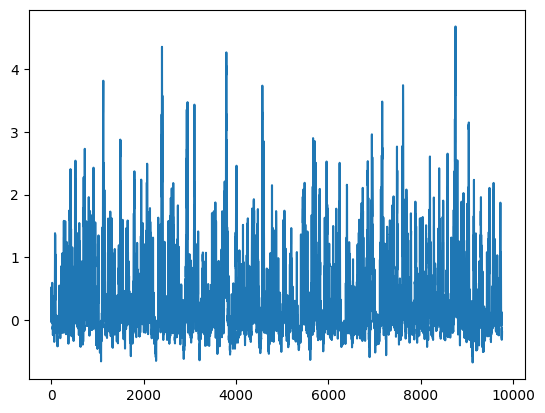

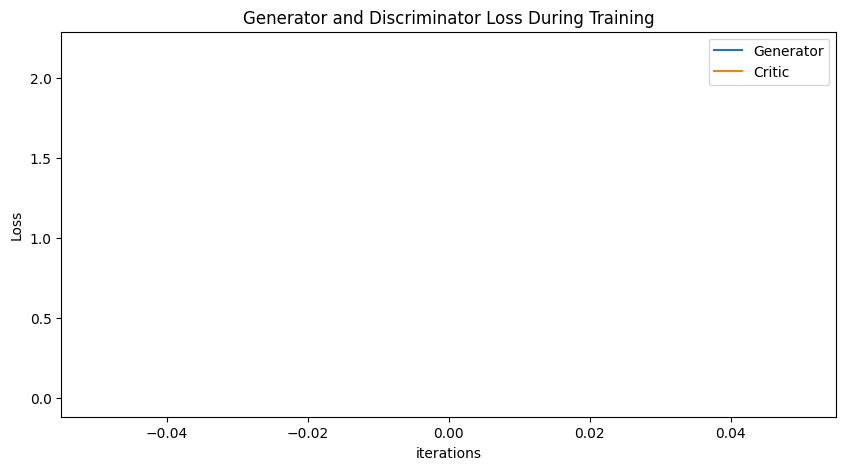

Epoch 10: Critic error ([2.1781899440031416, 2.8702126903724654, 3.029336559331063, 3.037734250337281, 2.9855460488594234, 2.6706290291041452, 2.649515558308307, 2.4960310373559316, 2.4896093521267817, 2.330651387032636, 1.7548553893317007]) Generator err ([-0.007688348647207022, -0.006836001295596361, -0.012427272275090218, -0.009264183230698109, -0.018836734816432, 0.0006272210157476366, -0.013293019495904446, -0.023697156459093094, -0.03173225000500679, -0.08403949439525604, -0.03717484697699547])


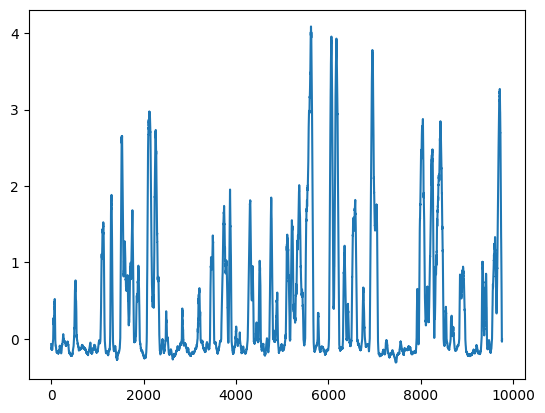

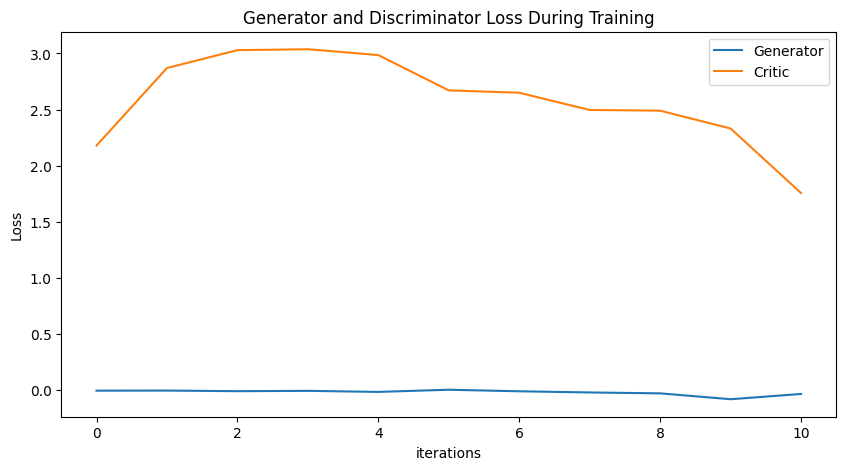

Epoch 20: Critic error ([2.1781899440031416, 2.8702126903724654, 3.029336559331063, 3.037734250337281, 2.9855460488594234, 2.6706290291041452, 2.649515558308307, 2.4960310373559316, 2.4896093521267817, 2.330651387032636, 1.7548553893317007, 0.7783494021105136, 1.045240621487112, 0.8007589537861755, 0.7191727406361347, 0.7347502413637428, 0.7785876449817642, 0.9051817485166829, 0.8209296062064011, 0.8585747950126366, 0.7233014498693399]) Generator err ([-0.007688348647207022, -0.006836001295596361, -0.012427272275090218, -0.009264183230698109, -0.018836734816432, 0.0006272210157476366, -0.013293019495904446, -0.023697156459093094, -0.03173225000500679, -0.08403949439525604, -0.03717484697699547, -0.005768224596977234, -0.17220863699913025, -0.2756817042827606, -0.352756142616272, -0.48218610882759094, -0.5721683502197266, -0.5950623750686646, -0.582577109336853, -0.5955819487571716, -0.5631510615348816])


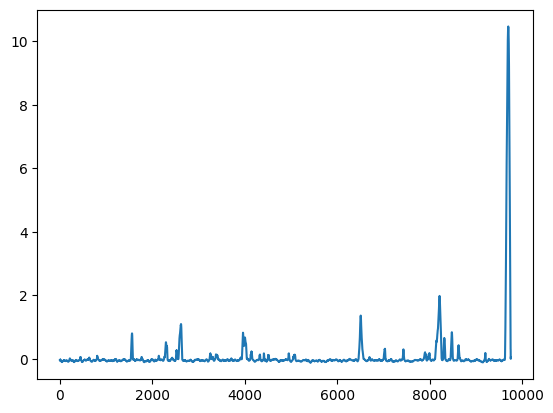

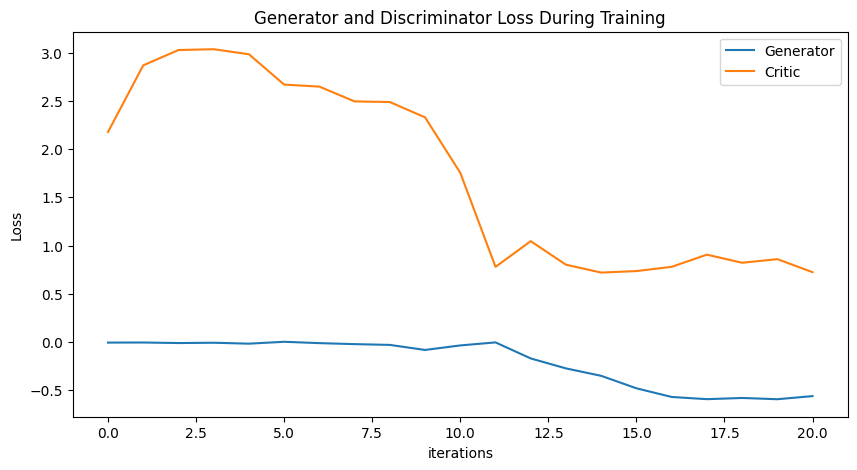

Epoch 30: Critic error ([2.1781899440031416, 2.8702126903724654, 3.029336559331063, 3.037734250337281, 2.9855460488594234, 2.6706290291041452, 2.649515558308307, 2.4960310373559316, 2.4896093521267817, 2.330651387032636, 1.7548553893317007, 0.7783494021105136, 1.045240621487112, 0.8007589537861755, 0.7191727406361347, 0.7347502413637428, 0.7785876449817642, 0.9051817485166829, 0.8209296062064011, 0.8585747950126366, 0.7233014498693399, 0.8846704496455231, 0.8162205645231069, 0.7851405634609931, 0.6464517484753131, 0.6325847593234178, 0.6235693180579893, 0.5293963201030838, 0.5300456627187692, 0.4717757133926175, 0.5034479512269259]) Generator err ([-0.007688348647207022, -0.006836001295596361, -0.012427272275090218, -0.009264183230698109, -0.018836734816432, 0.0006272210157476366, -0.013293019495904446, -0.023697156459093094, -0.03173225000500679, -0.08403949439525604, -0.03717484697699547, -0.005768224596977234, -0.17220863699913025, -0.2756817042827606, -0.352756142616272, -0.4821861

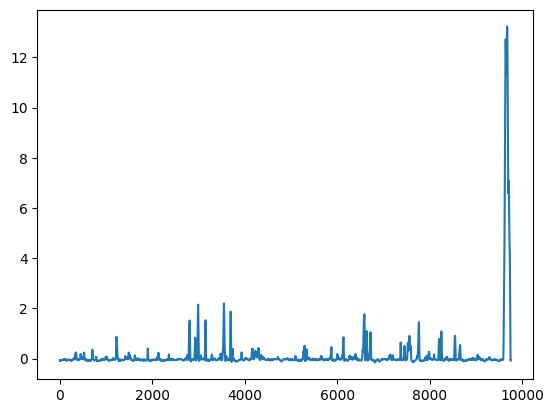

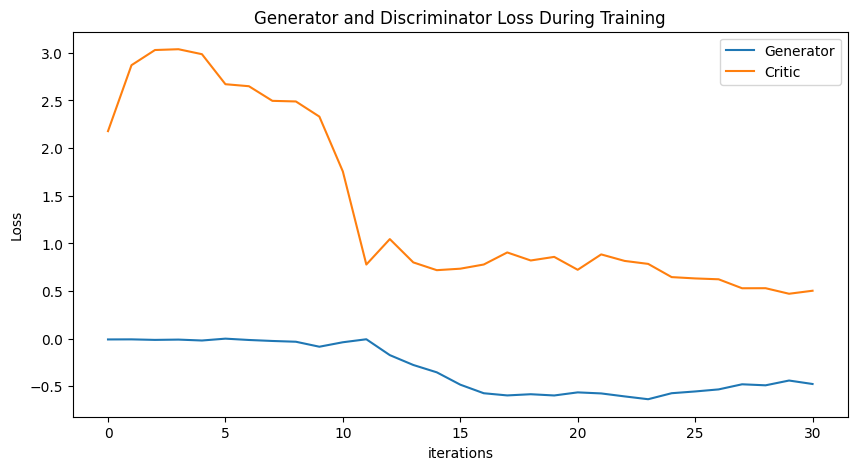

Epoch 40: Critic error ([2.1781899440031416, 2.8702126903724654, 3.029336559331063, 3.037734250337281, 2.9855460488594234, 2.6706290291041452, 2.649515558308307, 2.4960310373559316, 2.4896093521267817, 2.330651387032636, 1.7548553893317007, 0.7783494021105136, 1.045240621487112, 0.8007589537861755, 0.7191727406361347, 0.7347502413637428, 0.7785876449817642, 0.9051817485166829, 0.8209296062064011, 0.8585747950126366, 0.7233014498693399, 0.8846704496455231, 0.8162205645231069, 0.7851405634609931, 0.6464517484753131, 0.6325847593234178, 0.6235693180579893, 0.5293963201030838, 0.5300456627187692, 0.4717757133926175, 0.5034479512269259, 0.42963585039284913, 0.4896515225140632, 0.47617748946384203, 0.4812336437495708, 0.5537548880011989, 0.43084032486371326, 0.41024185383008976, 0.4283973908021298, 0.43022006094281484, 0.45339511750685213]) Generator err ([-0.007688348647207022, -0.006836001295596361, -0.012427272275090218, -0.009264183230698109, -0.018836734816432, 0.0006272210157476366, -0

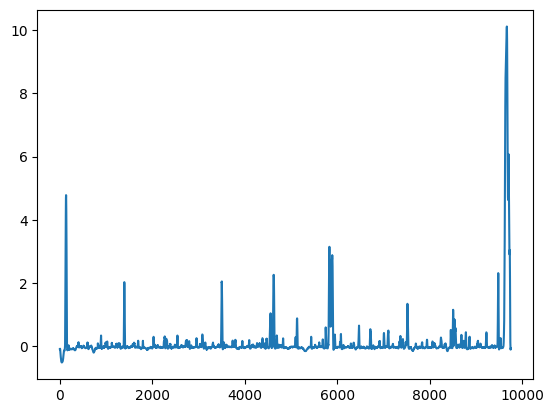

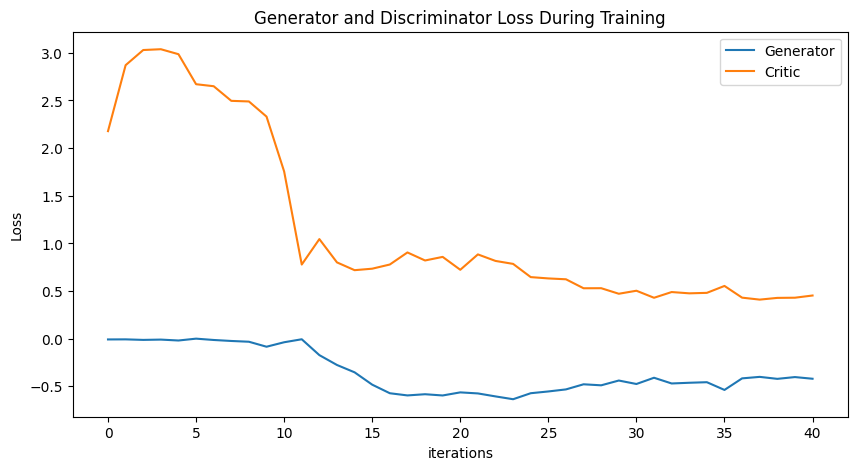

Epoch 50: Critic error ([2.1781899440031416, 2.8702126903724654, 3.029336559331063, 3.037734250337281, 2.9855460488594234, 2.6706290291041452, 2.649515558308307, 2.4960310373559316, 2.4896093521267817, 2.330651387032636, 1.7548553893317007, 0.7783494021105136, 1.045240621487112, 0.8007589537861755, 0.7191727406361347, 0.7347502413637428, 0.7785876449817642, 0.9051817485166829, 0.8209296062064011, 0.8585747950126366, 0.7233014498693399, 0.8846704496455231, 0.8162205645231069, 0.7851405634609931, 0.6464517484753131, 0.6325847593234178, 0.6235693180579893, 0.5293963201030838, 0.5300456627187692, 0.4717757133926175, 0.5034479512269259, 0.42963585039284913, 0.4896515225140632, 0.47617748946384203, 0.4812336437495708, 0.5537548880011989, 0.43084032486371326, 0.41024185383008976, 0.4283973908021298, 0.43022006094281484, 0.45339511750685213, 0.4320865110362557, 0.3950228651424648, 0.47059456583460435, 0.43945919614925316, 0.49072050881488494, 0.4065622285184438, 0.367807896598461, 0.3363149060

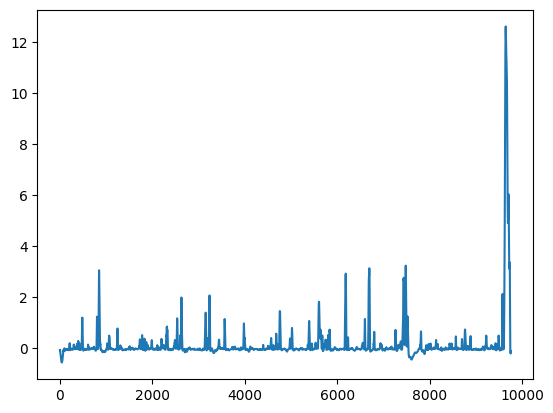

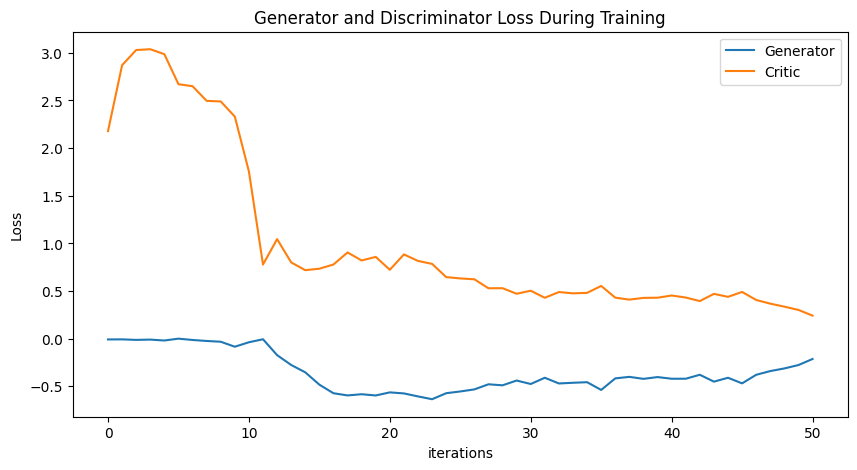

Epoch 60: Critic error ([2.1781899440031416, 2.8702126903724654, 3.029336559331063, 3.037734250337281, 2.9855460488594234, 2.6706290291041452, 2.649515558308307, 2.4960310373559316, 2.4896093521267817, 2.330651387032636, 1.7548553893317007, 0.7783494021105136, 1.045240621487112, 0.8007589537861755, 0.7191727406361347, 0.7347502413637428, 0.7785876449817642, 0.9051817485166829, 0.8209296062064011, 0.8585747950126366, 0.7233014498693399, 0.8846704496455231, 0.8162205645231069, 0.7851405634609931, 0.6464517484753131, 0.6325847593234178, 0.6235693180579893, 0.5293963201030838, 0.5300456627187692, 0.4717757133926175, 0.5034479512269259, 0.42963585039284913, 0.4896515225140632, 0.47617748946384203, 0.4812336437495708, 0.5537548880011989, 0.43084032486371326, 0.41024185383008976, 0.4283973908021298, 0.43022006094281484, 0.45339511750685213, 0.4320865110362557, 0.3950228651424648, 0.47059456583460435, 0.43945919614925316, 0.49072050881488494, 0.4065622285184438, 0.367807896598461, 0.3363149060

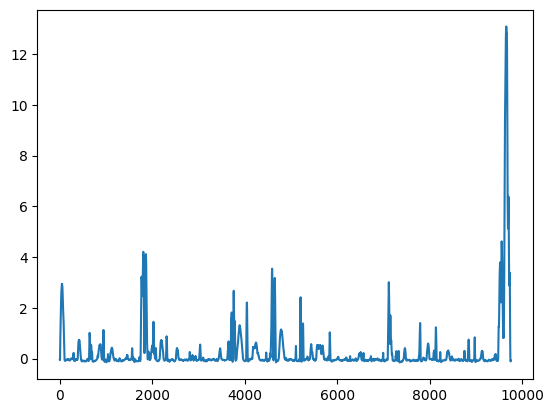

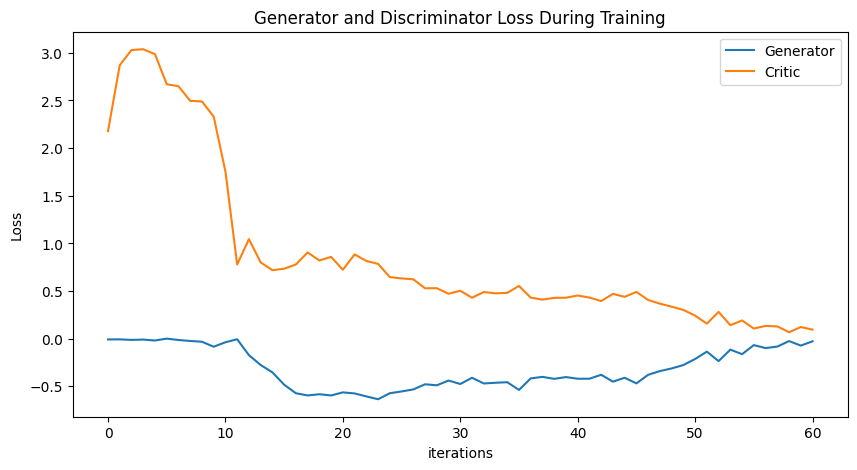

Epoch 70: Critic error ([2.1781899440031416, 2.8702126903724654, 3.029336559331063, 3.037734250337281, 2.9855460488594234, 2.6706290291041452, 2.649515558308307, 2.4960310373559316, 2.4896093521267817, 2.330651387032636, 1.7548553893317007, 0.7783494021105136, 1.045240621487112, 0.8007589537861755, 0.7191727406361347, 0.7347502413637428, 0.7785876449817642, 0.9051817485166829, 0.8209296062064011, 0.8585747950126366, 0.7233014498693399, 0.8846704496455231, 0.8162205645231069, 0.7851405634609931, 0.6464517484753131, 0.6325847593234178, 0.6235693180579893, 0.5293963201030838, 0.5300456627187692, 0.4717757133926175, 0.5034479512269259, 0.42963585039284913, 0.4896515225140632, 0.47617748946384203, 0.4812336437495708, 0.5537548880011989, 0.43084032486371326, 0.41024185383008976, 0.4283973908021298, 0.43022006094281484, 0.45339511750685213, 0.4320865110362557, 0.3950228651424648, 0.47059456583460435, 0.43945919614925316, 0.49072050881488494, 0.4065622285184438, 0.367807896598461, 0.3363149060

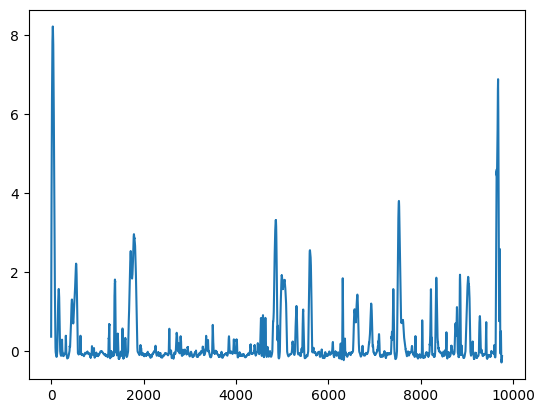

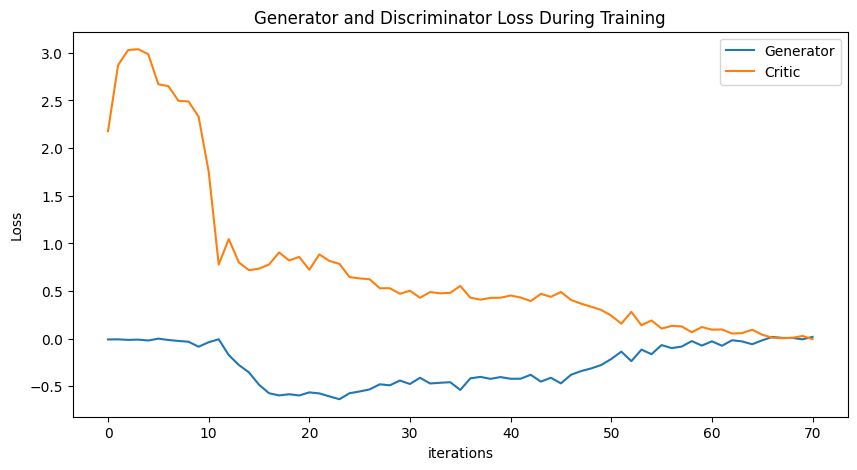

Epoch 80: Critic error ([2.1781899440031416, 2.8702126903724654, 3.029336559331063, 3.037734250337281, 2.9855460488594234, 2.6706290291041452, 2.649515558308307, 2.4960310373559316, 2.4896093521267817, 2.330651387032636, 1.7548553893317007, 0.7783494021105136, 1.045240621487112, 0.8007589537861755, 0.7191727406361347, 0.7347502413637428, 0.7785876449817642, 0.9051817485166829, 0.8209296062064011, 0.8585747950126366, 0.7233014498693399, 0.8846704496455231, 0.8162205645231069, 0.7851405634609931, 0.6464517484753131, 0.6325847593234178, 0.6235693180579893, 0.5293963201030838, 0.5300456627187692, 0.4717757133926175, 0.5034479512269259, 0.42963585039284913, 0.4896515225140632, 0.47617748946384203, 0.4812336437495708, 0.5537548880011989, 0.43084032486371326, 0.41024185383008976, 0.4283973908021298, 0.43022006094281484, 0.45339511750685213, 0.4320865110362557, 0.3950228651424648, 0.47059456583460435, 0.43945919614925316, 0.49072050881488494, 0.4065622285184438, 0.367807896598461, 0.3363149060

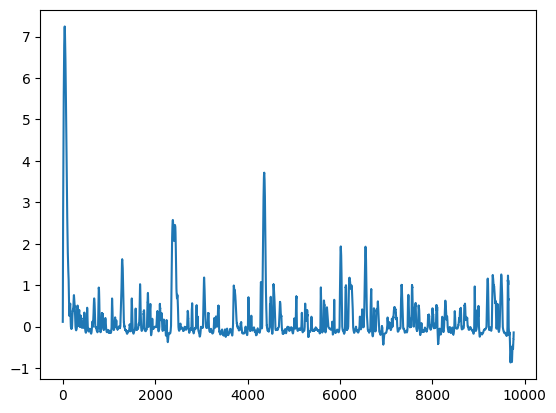

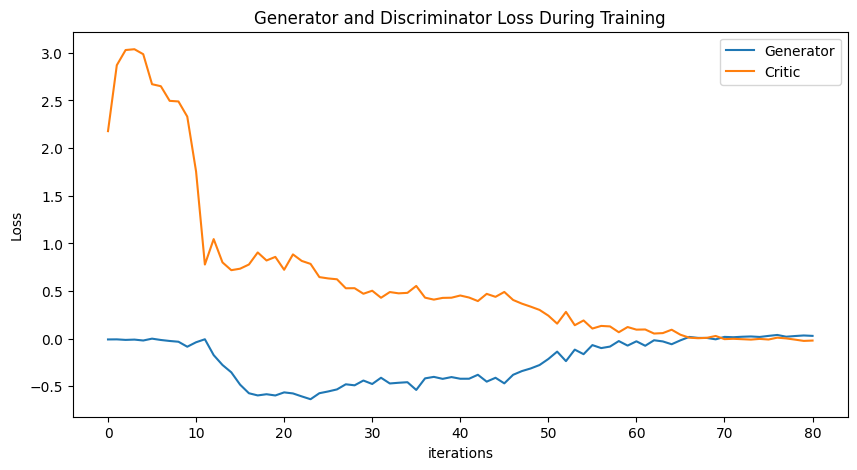

Epoch 90: Critic error ([2.1781899440031416, 2.8702126903724654, 3.029336559331063, 3.037734250337281, 2.9855460488594234, 2.6706290291041452, 2.649515558308307, 2.4960310373559316, 2.4896093521267817, 2.330651387032636, 1.7548553893317007, 0.7783494021105136, 1.045240621487112, 0.8007589537861755, 0.7191727406361347, 0.7347502413637428, 0.7785876449817642, 0.9051817485166829, 0.8209296062064011, 0.8585747950126366, 0.7233014498693399, 0.8846704496455231, 0.8162205645231069, 0.7851405634609931, 0.6464517484753131, 0.6325847593234178, 0.6235693180579893, 0.5293963201030838, 0.5300456627187692, 0.4717757133926175, 0.5034479512269259, 0.42963585039284913, 0.4896515225140632, 0.47617748946384203, 0.4812336437495708, 0.5537548880011989, 0.43084032486371326, 0.41024185383008976, 0.4283973908021298, 0.43022006094281484, 0.45339511750685213, 0.4320865110362557, 0.3950228651424648, 0.47059456583460435, 0.43945919614925316, 0.49072050881488494, 0.4065622285184438, 0.367807896598461, 0.3363149060

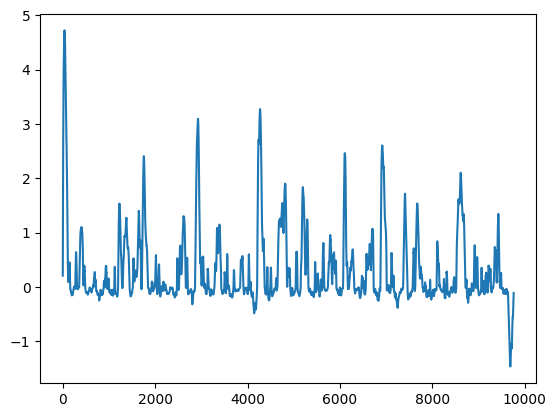

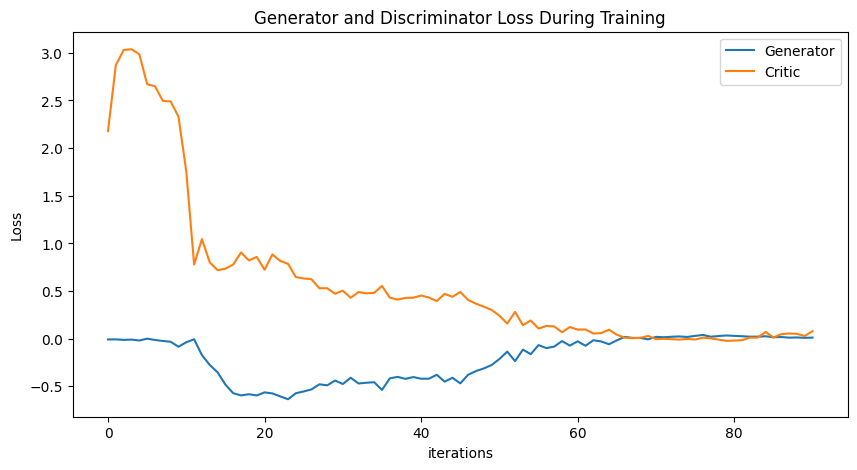

Epoch 100: Critic error ([2.1781899440031416, 2.8702126903724654, 3.029336559331063, 3.037734250337281, 2.9855460488594234, 2.6706290291041452, 2.649515558308307, 2.4960310373559316, 2.4896093521267817, 2.330651387032636, 1.7548553893317007, 0.7783494021105136, 1.045240621487112, 0.8007589537861755, 0.7191727406361347, 0.7347502413637428, 0.7785876449817642, 0.9051817485166829, 0.8209296062064011, 0.8585747950126366, 0.7233014498693399, 0.8846704496455231, 0.8162205645231069, 0.7851405634609931, 0.6464517484753131, 0.6325847593234178, 0.6235693180579893, 0.5293963201030838, 0.5300456627187692, 0.4717757133926175, 0.5034479512269259, 0.42963585039284913, 0.4896515225140632, 0.47617748946384203, 0.4812336437495708, 0.5537548880011989, 0.43084032486371326, 0.41024185383008976, 0.4283973908021298, 0.43022006094281484, 0.45339511750685213, 0.4320865110362557, 0.3950228651424648, 0.47059456583460435, 0.43945919614925316, 0.49072050881488494, 0.4065622285184438, 0.367807896598461, 0.336314906

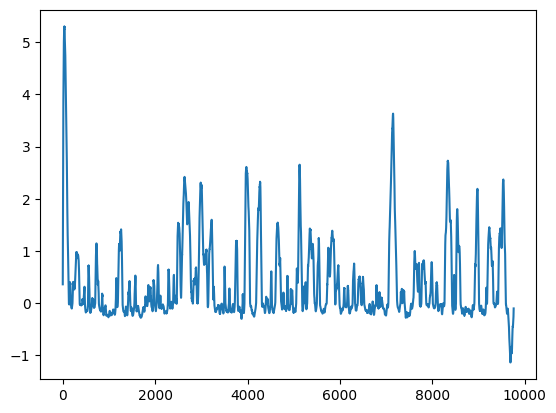

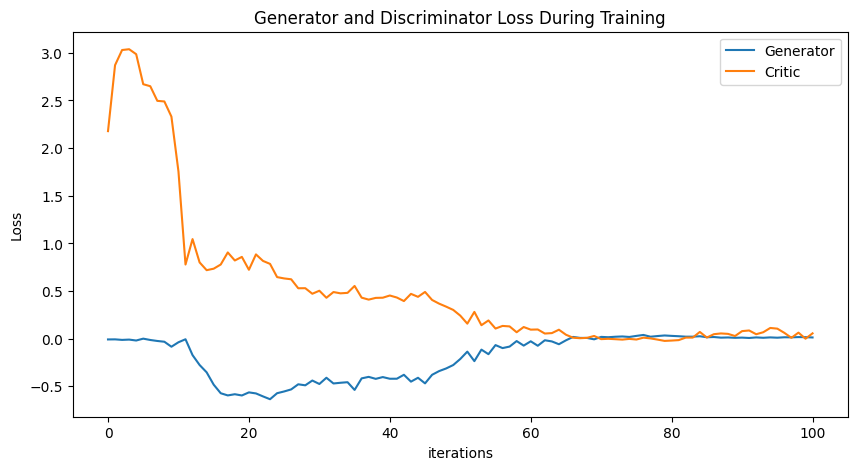

Epoch 110: Critic error ([2.1781899440031416, 2.8702126903724654, 3.029336559331063, 3.037734250337281, 2.9855460488594234, 2.6706290291041452, 2.649515558308307, 2.4960310373559316, 2.4896093521267817, 2.330651387032636, 1.7548553893317007, 0.7783494021105136, 1.045240621487112, 0.8007589537861755, 0.7191727406361347, 0.7347502413637428, 0.7785876449817642, 0.9051817485166829, 0.8209296062064011, 0.8585747950126366, 0.7233014498693399, 0.8846704496455231, 0.8162205645231069, 0.7851405634609931, 0.6464517484753131, 0.6325847593234178, 0.6235693180579893, 0.5293963201030838, 0.5300456627187692, 0.4717757133926175, 0.5034479512269259, 0.42963585039284913, 0.4896515225140632, 0.47617748946384203, 0.4812336437495708, 0.5537548880011989, 0.43084032486371326, 0.41024185383008976, 0.4283973908021298, 0.43022006094281484, 0.45339511750685213, 0.4320865110362557, 0.3950228651424648, 0.47059456583460435, 0.43945919614925316, 0.49072050881488494, 0.4065622285184438, 0.367807896598461, 0.336314906

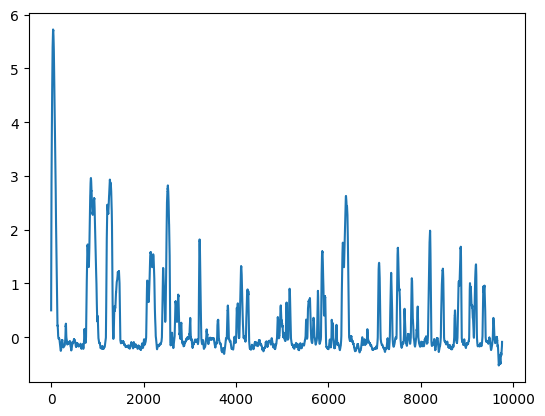

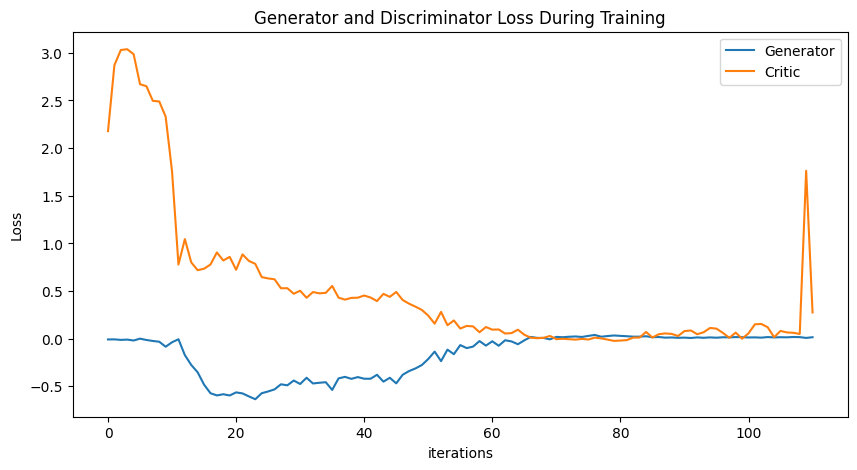

Epoch 120: Critic error ([2.1781899440031416, 2.8702126903724654, 3.029336559331063, 3.037734250337281, 2.9855460488594234, 2.6706290291041452, 2.649515558308307, 2.4960310373559316, 2.4896093521267817, 2.330651387032636, 1.7548553893317007, 0.7783494021105136, 1.045240621487112, 0.8007589537861755, 0.7191727406361347, 0.7347502413637428, 0.7785876449817642, 0.9051817485166829, 0.8209296062064011, 0.8585747950126366, 0.7233014498693399, 0.8846704496455231, 0.8162205645231069, 0.7851405634609931, 0.6464517484753131, 0.6325847593234178, 0.6235693180579893, 0.5293963201030838, 0.5300456627187692, 0.4717757133926175, 0.5034479512269259, 0.42963585039284913, 0.4896515225140632, 0.47617748946384203, 0.4812336437495708, 0.5537548880011989, 0.43084032486371326, 0.41024185383008976, 0.4283973908021298, 0.43022006094281484, 0.45339511750685213, 0.4320865110362557, 0.3950228651424648, 0.47059456583460435, 0.43945919614925316, 0.49072050881488494, 0.4065622285184438, 0.367807896598461, 0.336314906

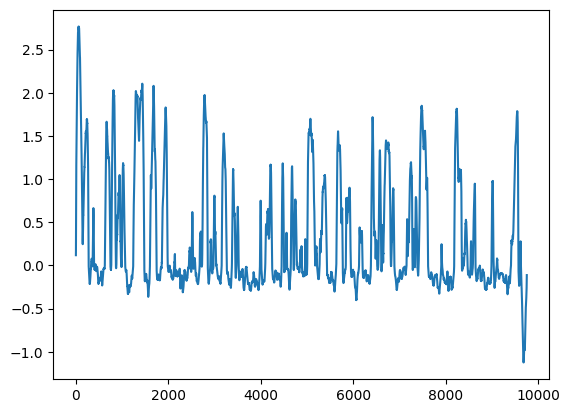

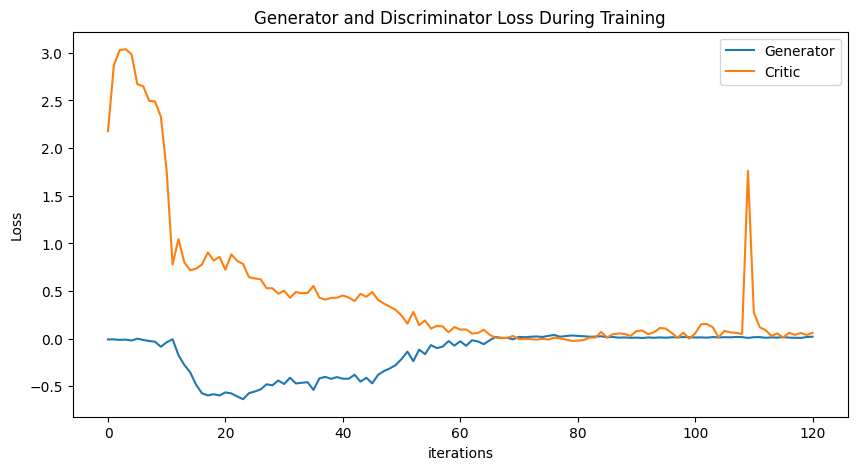

KeyboardInterrupt: 

In [54]:
# baseline with deeper gen (+3) and disc (+3)

NUM_EPOCHS = 200
PRINT_INTERVAL = 10 # every 10 epoch, print status
BATCH_SIZE = np.shape(training_data_open)[0]
NUM_CHANNELS = 64
SEQUENCE_LENGTH = 9760
LAMBDA_GP = 5

training_data = torch.tensor(training_data_open)



def weights_init(model):
    for m in model.modules():
      if isinstance(m, (nn.Conv1d, nn.ConvTranspose1d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)

# Gaussian normal distribution
def sample_normal_distribution(i, j, k):
    mu = 0
    sigma = 0.02
    return torch.Tensor(np.random.normal(mu, sigma, (i, j, k)))

def gradient_penalty(D, real, fake):
    alpha = torch.rand((BATCH_SIZE, 1, 1)).repeat(1, NUM_CHANNELS, SEQUENCE_LENGTH)
    interpolated_seq = real * alpha + fake * (1 - alpha)

    # Calculate discriminator scores
    mixed_scores = D(interpolated_seq)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_seq,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            real = training_data.clone().detach()
            real.requires_grad=True
            noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
            fake = G(noise)
            critic_real = D(real).reshape(-1) # flatten
            critic_fake = D(fake).reshape(-1) # flatten
            gp = gradient_penalty(D, real, fake)
            critic_loss = -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
            D.zero_grad()
            critic_loss.backward(retain_graph=True)
            critic_optimizer.step()

        generated_data = fake
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()

        critic_err.append(critic_loss.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            values = generated_data[0, 0, :]
            plt.plot(values.tolist())
            plt.show()
            
            # plotting G vs D losses
            plt.figure(figsize=(10,5))
            plt.title("Generator and Discriminator Loss During Training")
            plt.plot(gen_err,label="Generator")
            plt.plot(critic_err,label="Critic")
            plt.xlabel("iterations")
            plt.ylabel("Loss")
            plt.legend()
            plt.show()

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_data2, disc, gen = train()


Epoch 0: Critic error ([2.308835972213222]) Generator err ([0.04362669214606285])


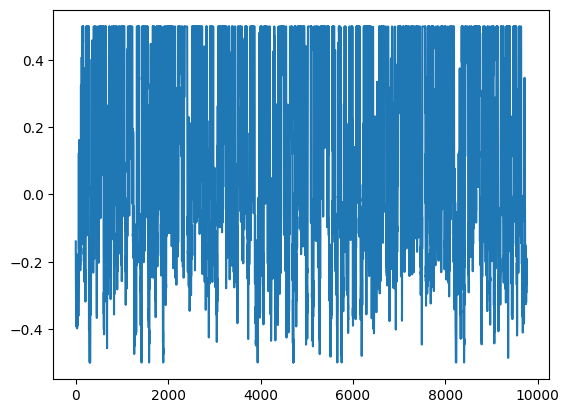

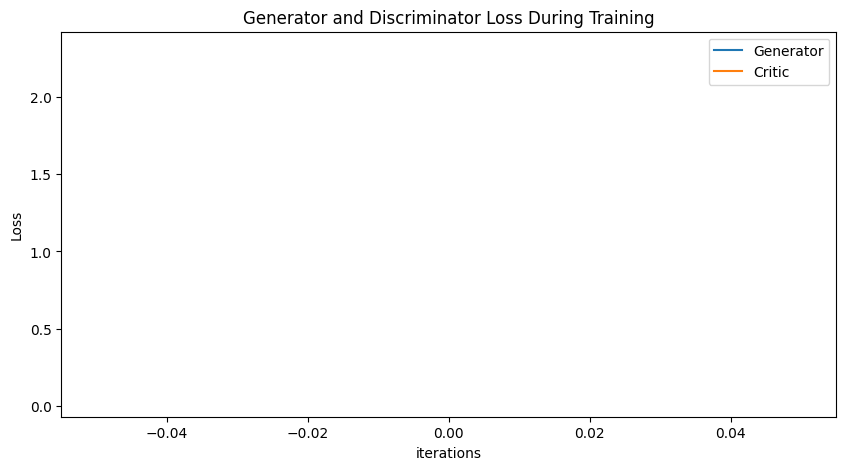

Epoch 10: Critic error ([2.308835972213222, 0.382954242208275, 0.11765883023502915, 0.07058072642698479, 0.1384427963936353, 0.10071251686737134, 0.1284643518641838, 0.046072060197560855, 0.046242605678011965, 0.09406381980784914, 0.03184716864585728]) Generator err ([0.04362669214606285, 0.0477697029709816, 0.07185224443674088, 0.05004206672310829, 0.047969698905944824, 0.05551457777619362, 0.040940552949905396, 0.043547384440898895, 0.042161960154771805, 0.043828900903463364, 0.039849597960710526])


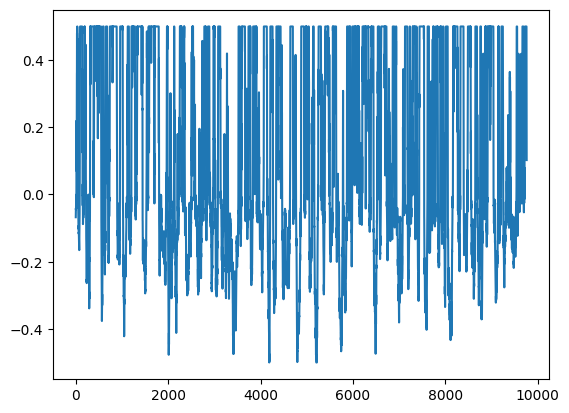

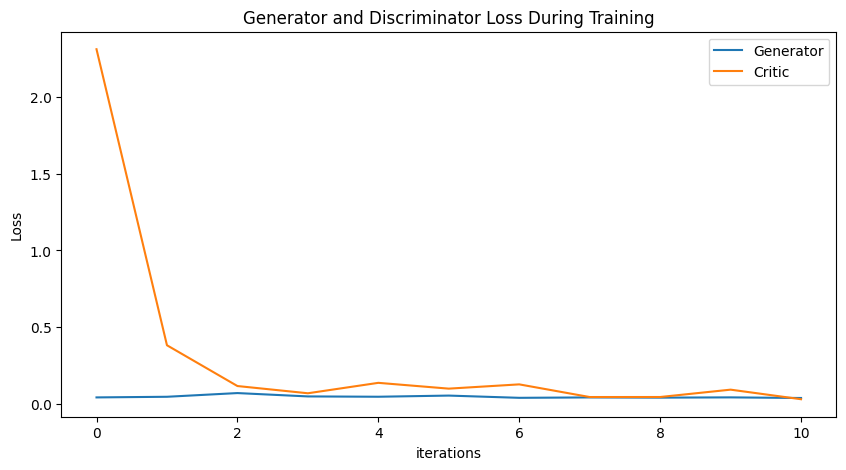

Epoch 20: Critic error ([2.308835972213222, 0.382954242208275, 0.11765883023502915, 0.07058072642698479, 0.1384427963936353, 0.10071251686737134, 0.1284643518641838, 0.046072060197560855, 0.046242605678011965, 0.09406381980784914, 0.03184716864585728, 0.0328735537897305, 0.027570630995796992, 0.01848910849644239, 0.012066716677538624, 0.006124429115486685, 0.006515405076246927, 0.012066093145736822, 0.01359781013641852, 0.007583883925886258, 0.008062501830665756]) Generator err ([0.04362669214606285, 0.0477697029709816, 0.07185224443674088, 0.05004206672310829, 0.047969698905944824, 0.05551457777619362, 0.040940552949905396, 0.043547384440898895, 0.042161960154771805, 0.043828900903463364, 0.039849597960710526, 0.04492655768990517, 0.04959552362561226, 0.04525010660290718, 0.045194901525974274, 0.04216363653540611, 0.04816218838095665, 0.04280847683548927, 0.04380428418517113, 0.04441279545426369, 0.045381877571344376])


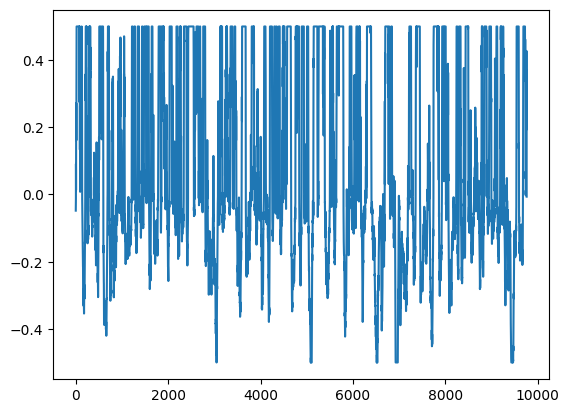

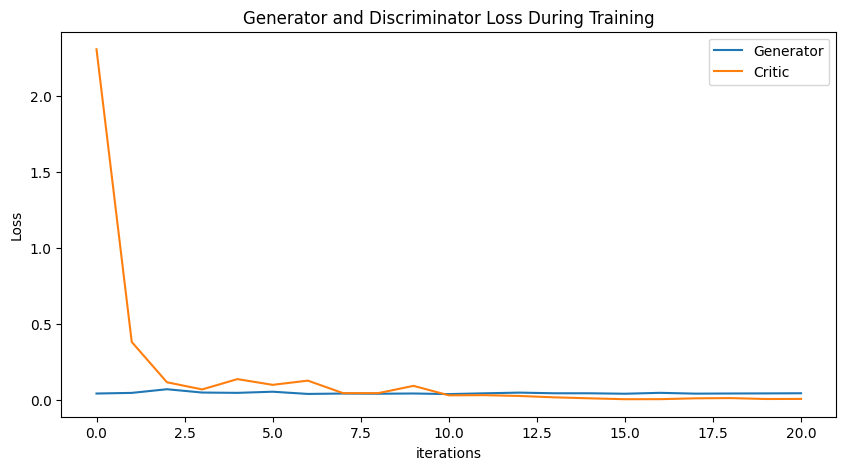

Epoch 30: Critic error ([2.308835972213222, 0.382954242208275, 0.11765883023502915, 0.07058072642698479, 0.1384427963936353, 0.10071251686737134, 0.1284643518641838, 0.046072060197560855, 0.046242605678011965, 0.09406381980784914, 0.03184716864585728, 0.0328735537897305, 0.027570630995796992, 0.01848910849644239, 0.012066716677538624, 0.006124429115486685, 0.006515405076246927, 0.012066093145736822, 0.01359781013641852, 0.007583883925886258, 0.008062501830665756, 0.0058897122062932135, 0.002977142976491905, 0.01194153052434756, 0.004143312352256859, 0.02441629866696171, -0.012016054335902158, 0.007030626689223999, -0.0028435393031204965, -0.017118415426781972, -0.015989675028395427]) Generator err ([0.04362669214606285, 0.0477697029709816, 0.07185224443674088, 0.05004206672310829, 0.047969698905944824, 0.05551457777619362, 0.040940552949905396, 0.043547384440898895, 0.042161960154771805, 0.043828900903463364, 0.039849597960710526, 0.04492655768990517, 0.04959552362561226, 0.04525010660

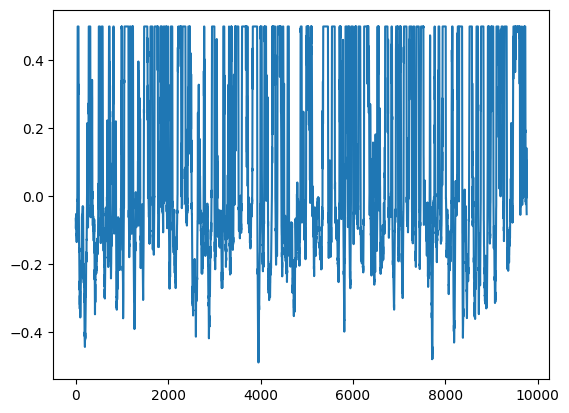

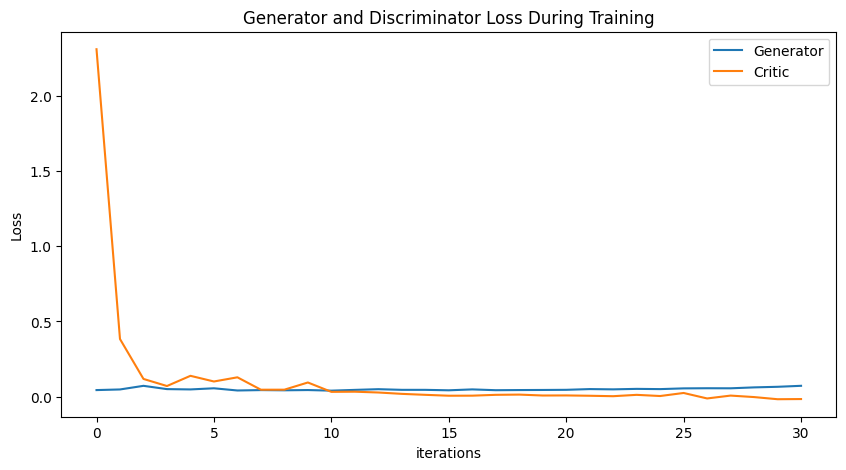

Epoch 40: Critic error ([2.308835972213222, 0.382954242208275, 0.11765883023502915, 0.07058072642698479, 0.1384427963936353, 0.10071251686737134, 0.1284643518641838, 0.046072060197560855, 0.046242605678011965, 0.09406381980784914, 0.03184716864585728, 0.0328735537897305, 0.027570630995796992, 0.01848910849644239, 0.012066716677538624, 0.006124429115486685, 0.006515405076246927, 0.012066093145736822, 0.01359781013641852, 0.007583883925886258, 0.008062501830665756, 0.0058897122062932135, 0.002977142976491905, 0.01194153052434756, 0.004143312352256859, 0.02441629866696171, -0.012016054335902158, 0.007030626689223999, -0.0028435393031204965, -0.017118415426781972, -0.015989675028395427, -0.024394034208667613, 0.020205319245705428, -0.031025185965389602, -0.041999315309517074, -0.04779210695391412, -0.09270085634823023, -0.14339863652147444, -0.18914598773605742, -0.40259201547212103, -0.5154141455094912]) Generator err ([0.04362669214606285, 0.0477697029709816, 0.07185224443674088, 0.05004

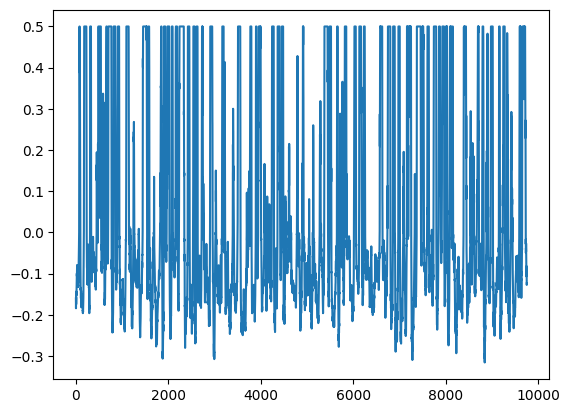

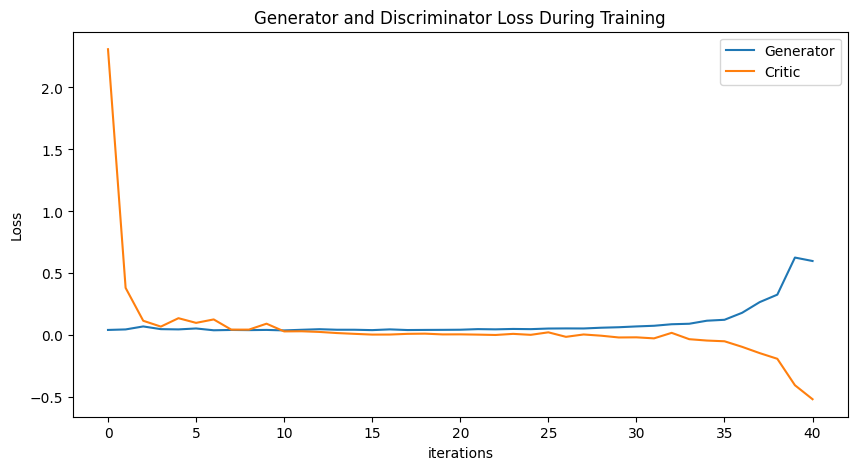

Epoch 50: Critic error ([2.308835972213222, 0.382954242208275, 0.11765883023502915, 0.07058072642698479, 0.1384427963936353, 0.10071251686737134, 0.1284643518641838, 0.046072060197560855, 0.046242605678011965, 0.09406381980784914, 0.03184716864585728, 0.0328735537897305, 0.027570630995796992, 0.01848910849644239, 0.012066716677538624, 0.006124429115486685, 0.006515405076246927, 0.012066093145736822, 0.01359781013641852, 0.007583883925886258, 0.008062501830665756, 0.0058897122062932135, 0.002977142976491905, 0.01194153052434756, 0.004143312352256859, 0.02441629866696171, -0.012016054335902158, 0.007030626689223999, -0.0028435393031204965, -0.017118415426781972, -0.015989675028395427, -0.024394034208667613, 0.020205319245705428, -0.031025185965389602, -0.041999315309517074, -0.04779210695391412, -0.09270085634823023, -0.14339863652147444, -0.18914598773605742, -0.40259201547212103, -0.5154141455094912, -0.07028654846056781, -0.3542071202927243, -0.7084644587048143, -0.6739888497620251, -

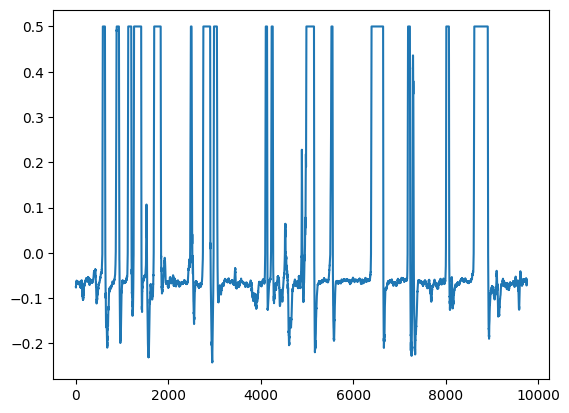

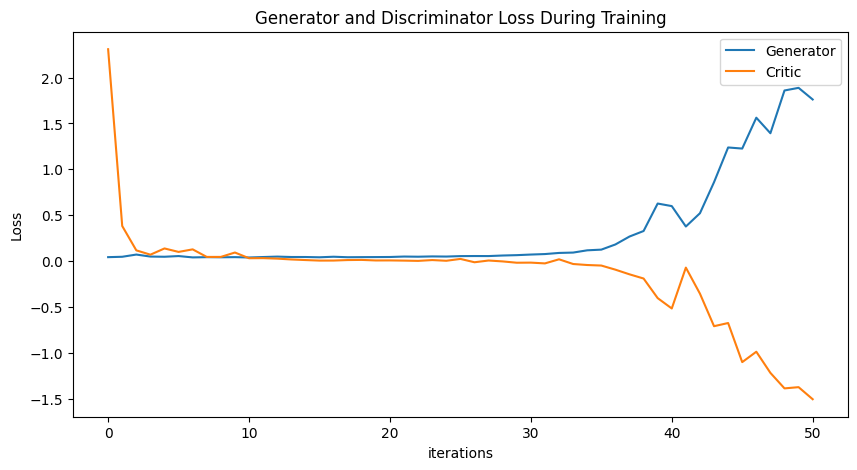

Epoch 60: Critic error ([2.308835972213222, 0.382954242208275, 0.11765883023502915, 0.07058072642698479, 0.1384427963936353, 0.10071251686737134, 0.1284643518641838, 0.046072060197560855, 0.046242605678011965, 0.09406381980784914, 0.03184716864585728, 0.0328735537897305, 0.027570630995796992, 0.01848910849644239, 0.012066716677538624, 0.006124429115486685, 0.006515405076246927, 0.012066093145736822, 0.01359781013641852, 0.007583883925886258, 0.008062501830665756, 0.0058897122062932135, 0.002977142976491905, 0.01194153052434756, 0.004143312352256859, 0.02441629866696171, -0.012016054335902158, 0.007030626689223999, -0.0028435393031204965, -0.017118415426781972, -0.015989675028395427, -0.024394034208667613, 0.020205319245705428, -0.031025185965389602, -0.041999315309517074, -0.04779210695391412, -0.09270085634823023, -0.14339863652147444, -0.18914598773605742, -0.40259201547212103, -0.5154141455094912, -0.07028654846056781, -0.3542071202927243, -0.7084644587048143, -0.6739888497620251, -

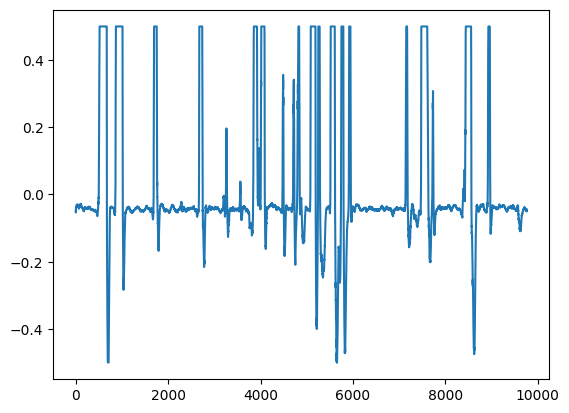

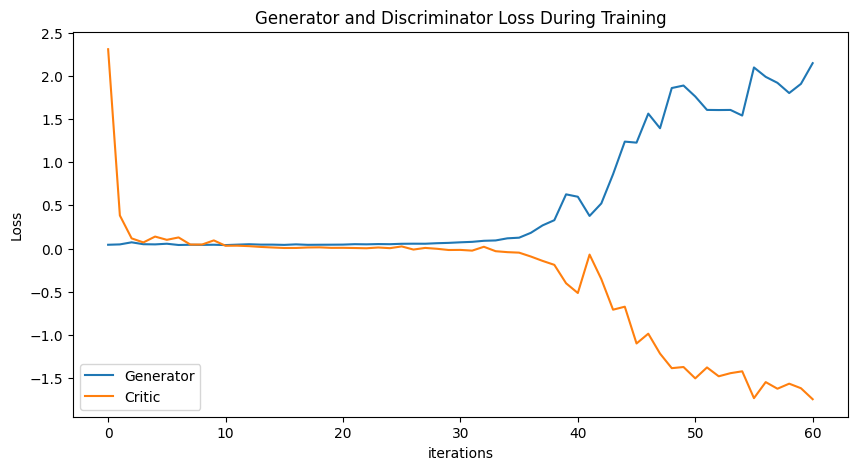

Epoch 70: Critic error ([2.308835972213222, 0.382954242208275, 0.11765883023502915, 0.07058072642698479, 0.1384427963936353, 0.10071251686737134, 0.1284643518641838, 0.046072060197560855, 0.046242605678011965, 0.09406381980784914, 0.03184716864585728, 0.0328735537897305, 0.027570630995796992, 0.01848910849644239, 0.012066716677538624, 0.006124429115486685, 0.006515405076246927, 0.012066093145736822, 0.01359781013641852, 0.007583883925886258, 0.008062501830665756, 0.0058897122062932135, 0.002977142976491905, 0.01194153052434756, 0.004143312352256859, 0.02441629866696171, -0.012016054335902158, 0.007030626689223999, -0.0028435393031204965, -0.017118415426781972, -0.015989675028395427, -0.024394034208667613, 0.020205319245705428, -0.031025185965389602, -0.041999315309517074, -0.04779210695391412, -0.09270085634823023, -0.14339863652147444, -0.18914598773605742, -0.40259201547212103, -0.5154141455094912, -0.07028654846056781, -0.3542071202927243, -0.7084644587048143, -0.6739888497620251, -

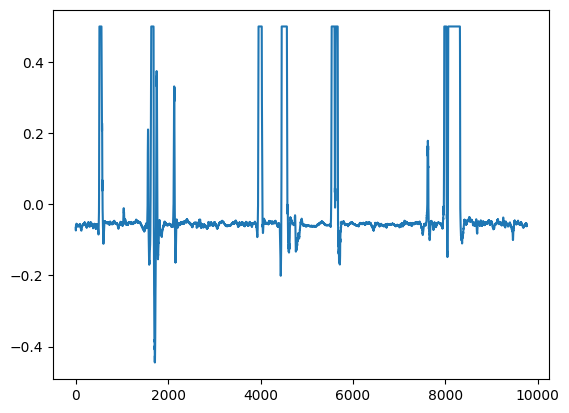

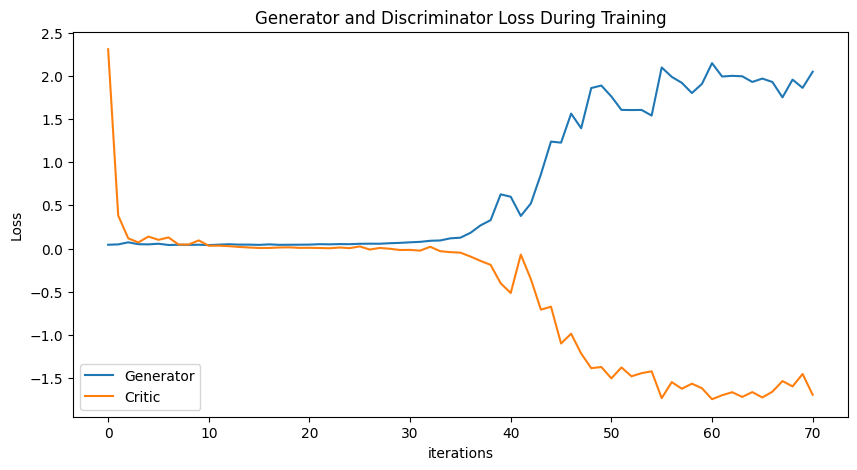

Epoch 80: Critic error ([2.308835972213222, 0.382954242208275, 0.11765883023502915, 0.07058072642698479, 0.1384427963936353, 0.10071251686737134, 0.1284643518641838, 0.046072060197560855, 0.046242605678011965, 0.09406381980784914, 0.03184716864585728, 0.0328735537897305, 0.027570630995796992, 0.01848910849644239, 0.012066716677538624, 0.006124429115486685, 0.006515405076246927, 0.012066093145736822, 0.01359781013641852, 0.007583883925886258, 0.008062501830665756, 0.0058897122062932135, 0.002977142976491905, 0.01194153052434756, 0.004143312352256859, 0.02441629866696171, -0.012016054335902158, 0.007030626689223999, -0.0028435393031204965, -0.017118415426781972, -0.015989675028395427, -0.024394034208667613, 0.020205319245705428, -0.031025185965389602, -0.041999315309517074, -0.04779210695391412, -0.09270085634823023, -0.14339863652147444, -0.18914598773605742, -0.40259201547212103, -0.5154141455094912, -0.07028654846056781, -0.3542071202927243, -0.7084644587048143, -0.6739888497620251, -

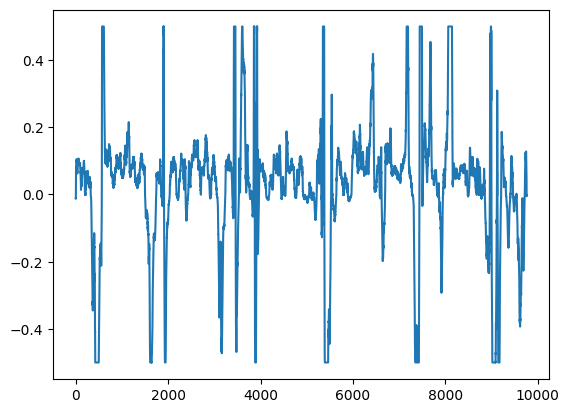

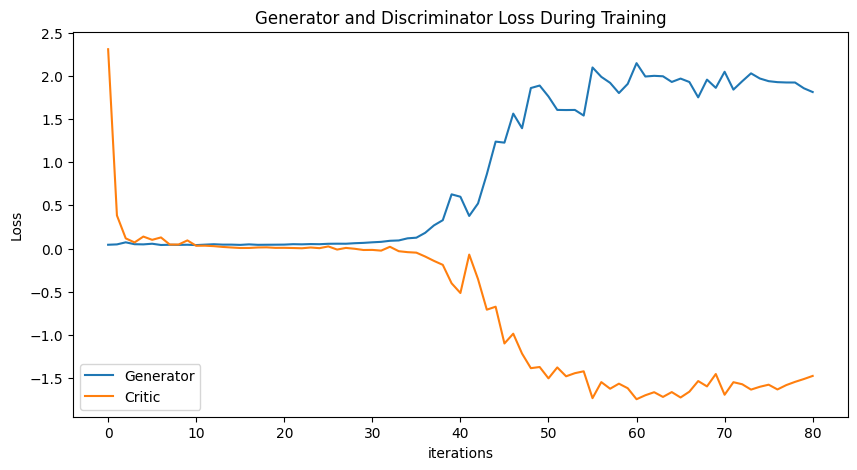

Epoch 90: Critic error ([2.308835972213222, 0.382954242208275, 0.11765883023502915, 0.07058072642698479, 0.1384427963936353, 0.10071251686737134, 0.1284643518641838, 0.046072060197560855, 0.046242605678011965, 0.09406381980784914, 0.03184716864585728, 0.0328735537897305, 0.027570630995796992, 0.01848910849644239, 0.012066716677538624, 0.006124429115486685, 0.006515405076246927, 0.012066093145736822, 0.01359781013641852, 0.007583883925886258, 0.008062501830665756, 0.0058897122062932135, 0.002977142976491905, 0.01194153052434756, 0.004143312352256859, 0.02441629866696171, -0.012016054335902158, 0.007030626689223999, -0.0028435393031204965, -0.017118415426781972, -0.015989675028395427, -0.024394034208667613, 0.020205319245705428, -0.031025185965389602, -0.041999315309517074, -0.04779210695391412, -0.09270085634823023, -0.14339863652147444, -0.18914598773605742, -0.40259201547212103, -0.5154141455094912, -0.07028654846056781, -0.3542071202927243, -0.7084644587048143, -0.6739888497620251, -

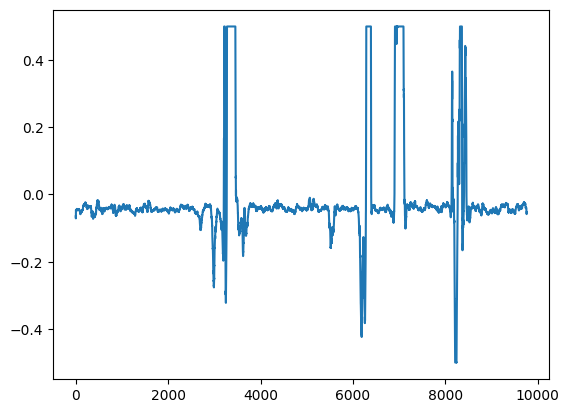

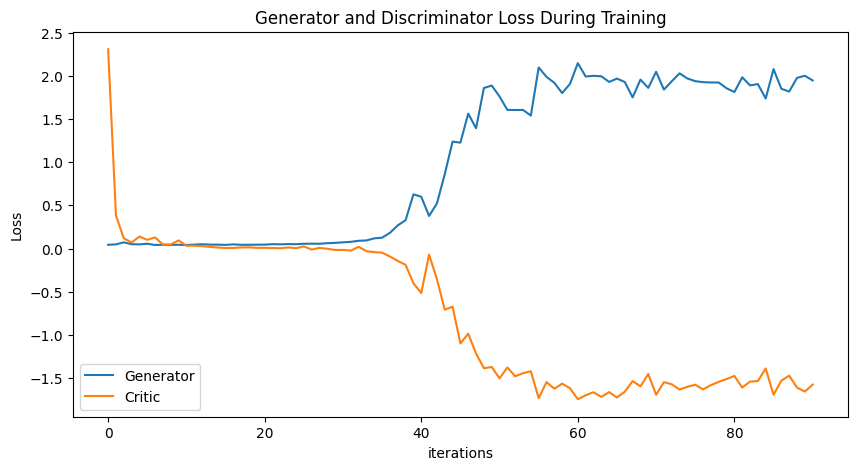

In [52]:
# baseline with clipping values

NUM_EPOCHS = 100
PRINT_INTERVAL = 10 # every 10 epoch, print status
BATCH_SIZE = np.shape(training_data_open)[0]
NUM_CHANNELS = 64
SEQUENCE_LENGTH = 9760
LAMBDA_GP = 5

training_data = torch.tensor(training_data_open)


def weights_init(model):
    for m in model.modules():
      if isinstance(m, (nn.Conv1d, nn.ConvTranspose1d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)

# Gaussian normal distribution
def sample_normal_distribution(i, j, k):
    mu = 0
    sigma = 0.02
    return torch.Tensor(np.random.normal(mu, sigma, (i, j, k)))

def gradient_penalty(D, real, fake):
    alpha = torch.rand((BATCH_SIZE, 1, 1)).repeat(1, NUM_CHANNELS, SEQUENCE_LENGTH)
    interpolated_seq = real * alpha + fake * (1 - alpha)

    # Calculate discriminator scores
    mixed_scores = D(interpolated_seq)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_seq,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        x = torch.clamp(x, min=-0.5, max=0.5)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            real = training_data.clone().detach()
            real.requires_grad=True
            noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
            fake = G(noise)
            critic_real = D(real).reshape(-1) # flatten
            critic_fake = D(fake).reshape(-1) # flatten
            gp = gradient_penalty(D, real, fake)
            critic_loss = -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
            D.zero_grad()
            critic_loss.backward(retain_graph=True)
            critic_optimizer.step()

        generated_data = fake
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()

        critic_err.append(critic_loss.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            values = generated_data[0, 0, :]
            plt.plot(values.tolist())
            plt.show()
            
            # plotting G vs D losses
            plt.figure(figsize=(10,5))
            plt.title("Generator and Discriminator Loss During Training")
            plt.plot(gen_err,label="Generator")
            plt.plot(critic_err,label="Critic")
            plt.xlabel("iterations")
            plt.ylabel("Loss")
            plt.legend()
            plt.show()

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_data3, disc, gen = train()

eyes open


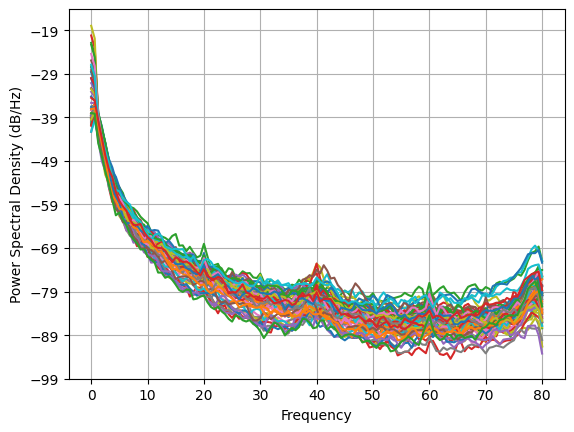

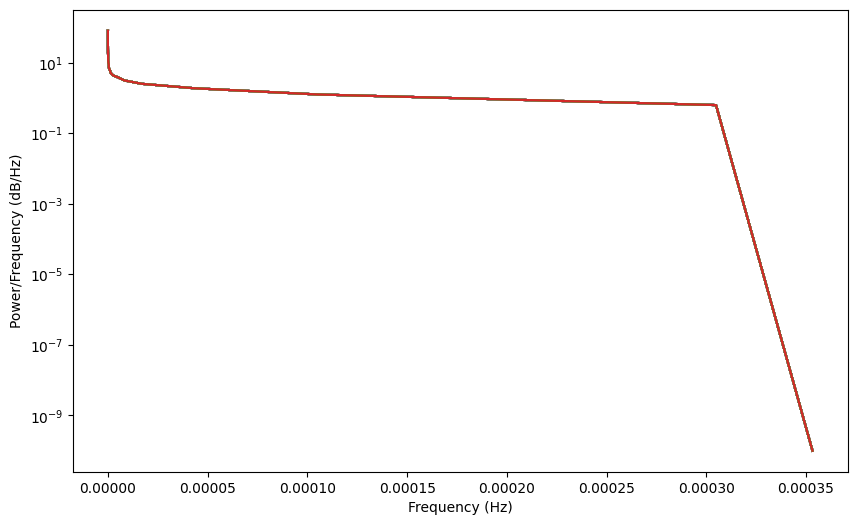

In [157]:
averaged_data = generated_data3.detach().mean(dim=0)
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')

print("eyes open")
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()

Epoch 0: Critic error ([0.6796743901305209]) Generator err ([0.026409855112433434])


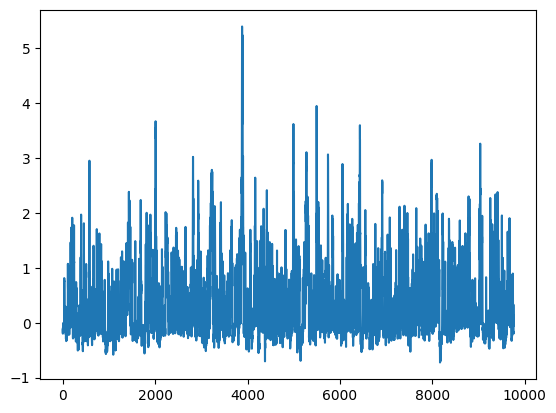

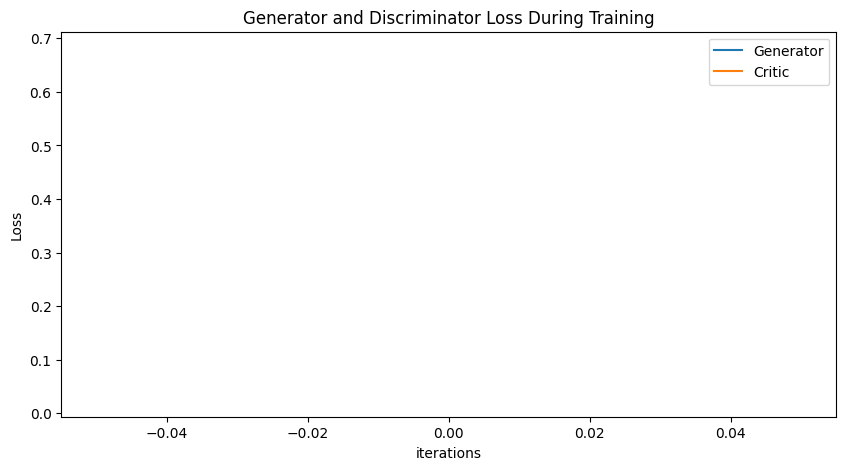

Epoch 100: Critic error ([0.6796743901305209, 0.5931211052901098, 0.4233444522487951, 0.16708213671568437, -0.021245429976552252, 0.024162102111725522, 0.018782472691533825, 0.09468052315498433, 0.1564733964286815, 0.10596456230138396, 0.22223356878841827, 0.20268339338445335, 0.22498107743878465, 0.275459746926559, 0.22905750023615096, 0.2714947332518366, 0.1879991734557801, 0.23129546970455206, 0.24685847845083303, 0.16023854324078862, 0.2319964619339409, 0.24861768995322692, 0.12282689790386284, 0.24185326463580037, 0.2259486769527325, 0.23623523106324806, 0.16526752805182315, 0.16152180363275748, 0.1860567844358338, 0.12152701786021425, 0.09845377384821402, 0.18081626875210927, 0.16214098392089293, 0.07087035520491743, 0.1393416711275761, 0.09320830335335949, 0.04542016466482757, 0.07176237236236727, 0.03800269756439627, 0.02427817926055087, 0.028638713772316443, 0.0112020467242336, 0.006847391964063913, 0.013553892123010641, 0.0002906613508530005, 0.0010659718332784278, 0.00603326

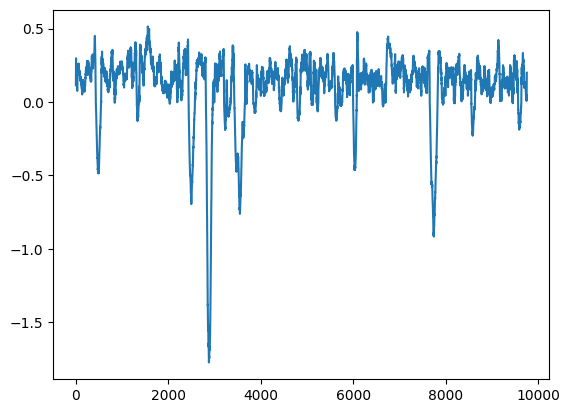

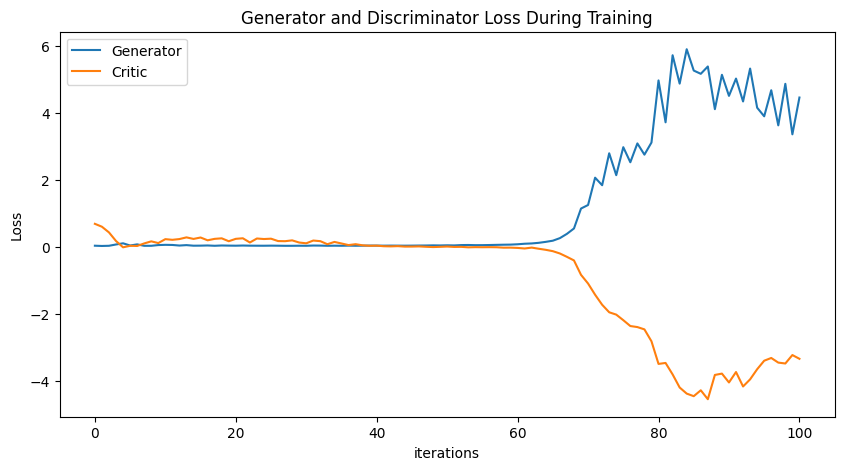

Epoch 200: Critic error ([0.6796743901305209, 0.5931211052901098, 0.4233444522487951, 0.16708213671568437, -0.021245429976552252, 0.024162102111725522, 0.018782472691533825, 0.09468052315498433, 0.1564733964286815, 0.10596456230138396, 0.22223356878841827, 0.20268339338445335, 0.22498107743878465, 0.275459746926559, 0.22905750023615096, 0.2714947332518366, 0.1879991734557801, 0.23129546970455206, 0.24685847845083303, 0.16023854324078862, 0.2319964619339409, 0.24861768995322692, 0.12282689790386284, 0.24185326463580037, 0.2259486769527325, 0.23623523106324806, 0.16526752805182315, 0.16152180363275748, 0.1860567844358338, 0.12152701786021425, 0.09845377384821402, 0.18081626875210927, 0.16214098392089293, 0.07087035520491743, 0.1393416711275761, 0.09320830335335949, 0.04542016466482757, 0.07176237236236727, 0.03800269756439627, 0.02427817926055087, 0.028638713772316443, 0.0112020467242336, 0.006847391964063913, 0.013553892123010641, 0.0002906613508530005, 0.0010659718332784278, 0.00603326

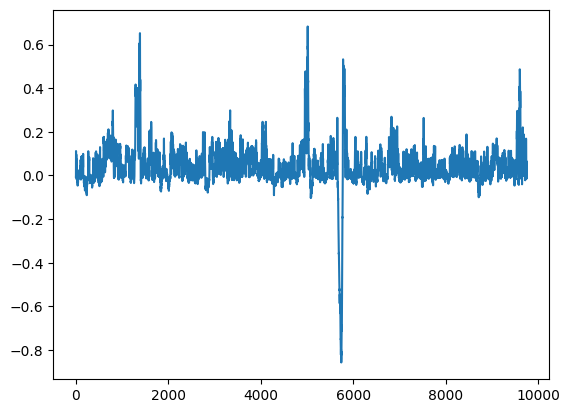

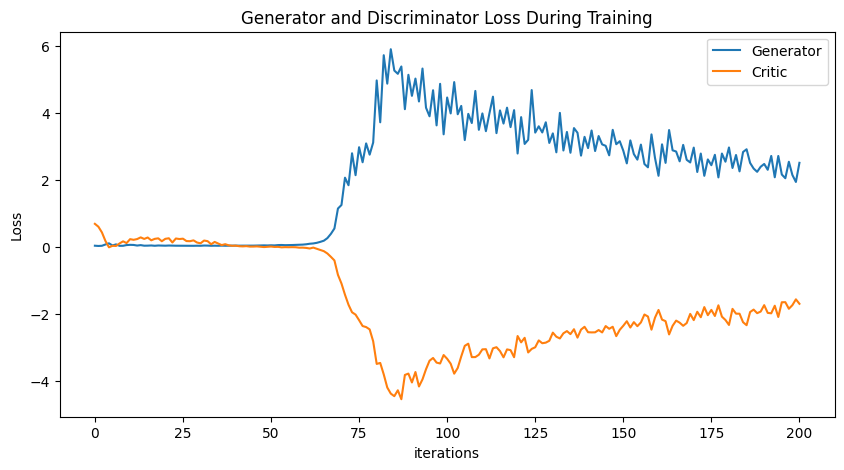

Epoch 300: Critic error ([0.6796743901305209, 0.5931211052901098, 0.4233444522487951, 0.16708213671568437, -0.021245429976552252, 0.024162102111725522, 0.018782472691533825, 0.09468052315498433, 0.1564733964286815, 0.10596456230138396, 0.22223356878841827, 0.20268339338445335, 0.22498107743878465, 0.275459746926559, 0.22905750023615096, 0.2714947332518366, 0.1879991734557801, 0.23129546970455206, 0.24685847845083303, 0.16023854324078862, 0.2319964619339409, 0.24861768995322692, 0.12282689790386284, 0.24185326463580037, 0.2259486769527325, 0.23623523106324806, 0.16526752805182315, 0.16152180363275748, 0.1860567844358338, 0.12152701786021425, 0.09845377384821402, 0.18081626875210927, 0.16214098392089293, 0.07087035520491743, 0.1393416711275761, 0.09320830335335949, 0.04542016466482757, 0.07176237236236727, 0.03800269756439627, 0.02427817926055087, 0.028638713772316443, 0.0112020467242336, 0.006847391964063913, 0.013553892123010641, 0.0002906613508530005, 0.0010659718332784278, 0.00603326

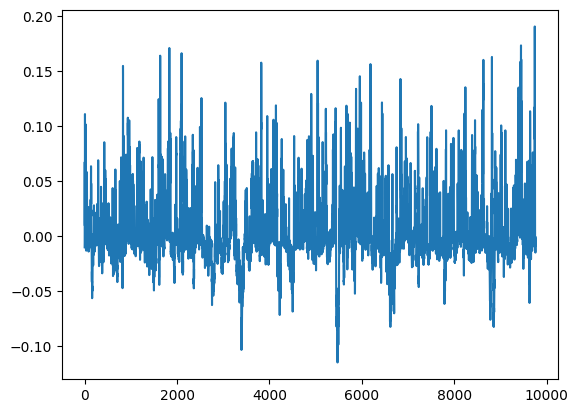

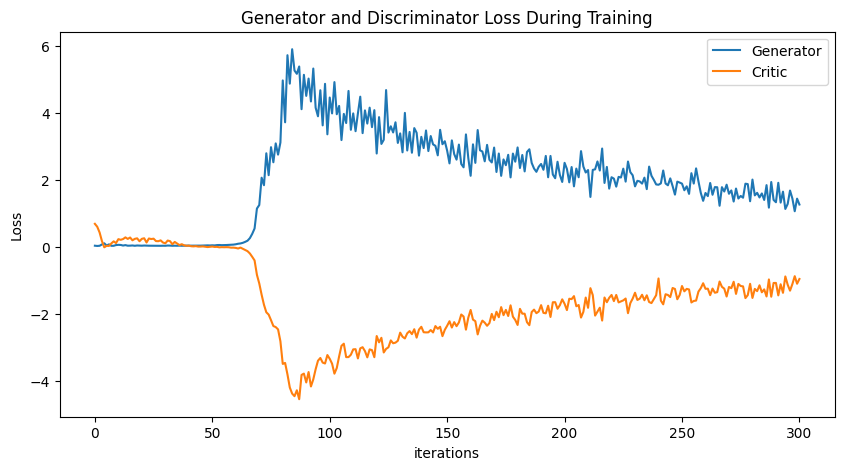

Epoch 400: Critic error ([0.6796743901305209, 0.5931211052901098, 0.4233444522487951, 0.16708213671568437, -0.021245429976552252, 0.024162102111725522, 0.018782472691533825, 0.09468052315498433, 0.1564733964286815, 0.10596456230138396, 0.22223356878841827, 0.20268339338445335, 0.22498107743878465, 0.275459746926559, 0.22905750023615096, 0.2714947332518366, 0.1879991734557801, 0.23129546970455206, 0.24685847845083303, 0.16023854324078862, 0.2319964619339409, 0.24861768995322692, 0.12282689790386284, 0.24185326463580037, 0.2259486769527325, 0.23623523106324806, 0.16526752805182315, 0.16152180363275748, 0.1860567844358338, 0.12152701786021425, 0.09845377384821402, 0.18081626875210927, 0.16214098392089293, 0.07087035520491743, 0.1393416711275761, 0.09320830335335949, 0.04542016466482757, 0.07176237236236727, 0.03800269756439627, 0.02427817926055087, 0.028638713772316443, 0.0112020467242336, 0.006847391964063913, 0.013553892123010641, 0.0002906613508530005, 0.0010659718332784278, 0.00603326

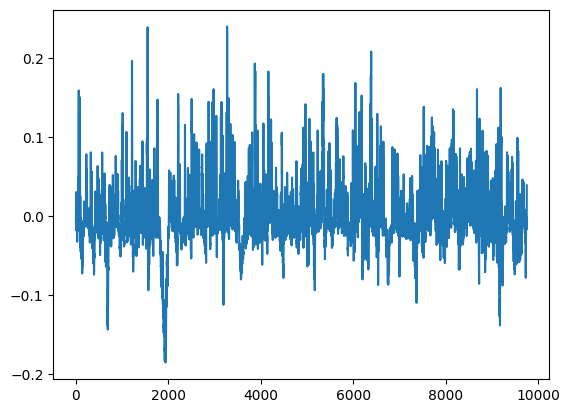

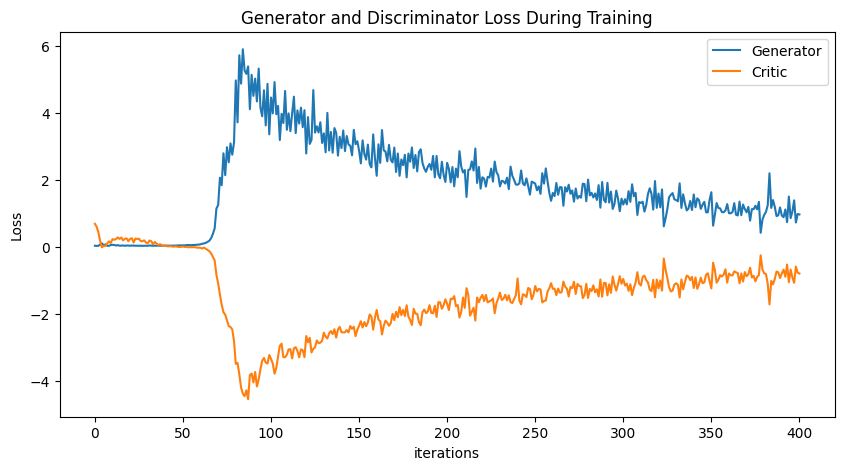

In [53]:
# baseline with 500 epoch

NUM_EPOCHS = 500
PRINT_INTERVAL = 100 # every 10 epoch, print status
BATCH_SIZE = np.shape(training_data_open)[0]
NUM_CHANNELS = 64
SEQUENCE_LENGTH = 9760
LAMBDA_GP = 5

training_data = torch.tensor(training_data_open)


def weights_init(model):
    for m in model.modules():
      if isinstance(m, (nn.Conv1d, nn.ConvTranspose1d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)

# Gaussian normal distribution
def sample_normal_distribution(i, j, k):
    mu = 0
    sigma = 0.02
    return torch.Tensor(np.random.normal(mu, sigma, (i, j, k)))

def gradient_penalty(D, real, fake):
    alpha = torch.rand((BATCH_SIZE, 1, 1)).repeat(1, NUM_CHANNELS, SEQUENCE_LENGTH)
    interpolated_seq = real * alpha + fake * (1 - alpha)

    # Calculate discriminator scores
    mixed_scores = D(interpolated_seq)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_seq,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            real = training_data.clone().detach()
            real.requires_grad=True
            noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
            fake = G(noise)
            critic_real = D(real).reshape(-1) # flatten
            critic_fake = D(fake).reshape(-1) # flatten
            gp = gradient_penalty(D, real, fake)
            critic_loss = -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
            D.zero_grad()
            critic_loss.backward(retain_graph=True)
            critic_optimizer.step()

        generated_data = fake
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()

        critic_err.append(critic_loss.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            values = generated_data[0, 0, :]
            plt.plot(values.tolist())
            plt.show()
            
            # plotting G vs D losses
            plt.figure(figsize=(10,5))
            plt.title("Generator and Discriminator Loss During Training")
            plt.plot(gen_err,label="Generator")
            plt.plot(critic_err,label="Critic")
            plt.xlabel("iterations")
            plt.ylabel("Loss")
            plt.legend()
            plt.show()

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_data1, disc, gen = train()


eyes open


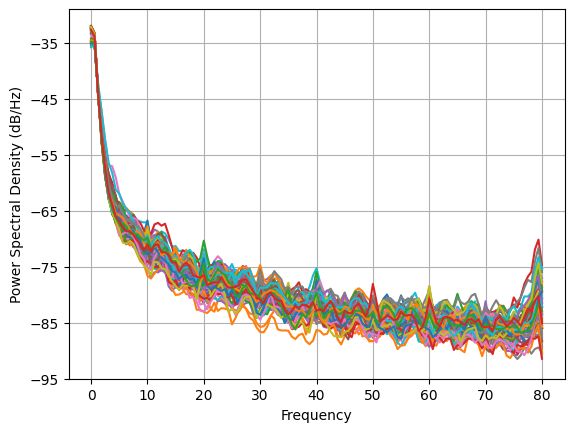

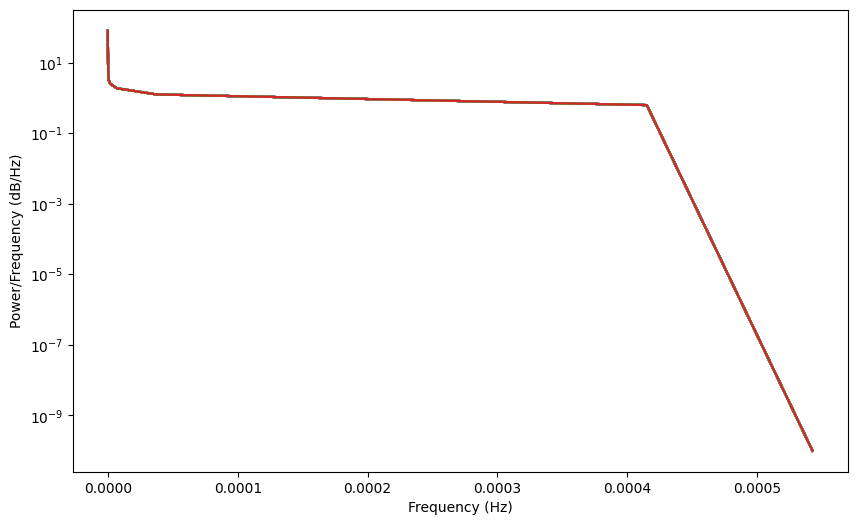

In [156]:
averaged_data = generated_data1.detach().mean(dim=0)
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')

print("eyes open")
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()

# BASELINE + 70 EPOCH

Epoch 0: Critic error ([2.0423351870433435]) Generator err ([-0.01871659979224205])


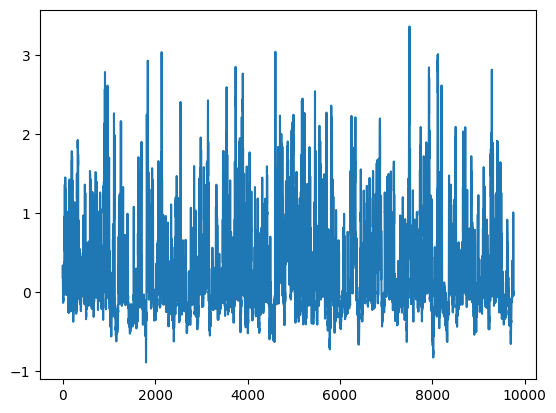

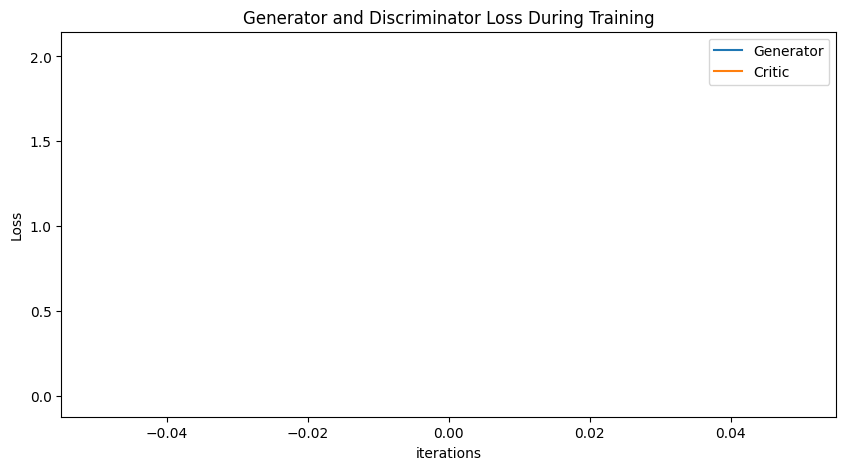

Epoch 10: Critic error ([2.0423351870433435, -0.012860582451595992, -0.03655930382112352, 0.02547116818854203, -0.07155952422086534, -0.3707955602434334, -0.6805564777586038, -0.9114850348992001, -1.7308199420295372, -1.485944159206586, -2.8540448595043886]) Generator err ([-0.01871659979224205, 0.049190372228622437, 0.10557858645915985, 0.09649421274662018, 0.19848352670669556, 0.6316109895706177, 0.7788398265838623, 2.3813633918762207, 1.474191427230835, 3.6316051483154297, 2.8183205127716064])


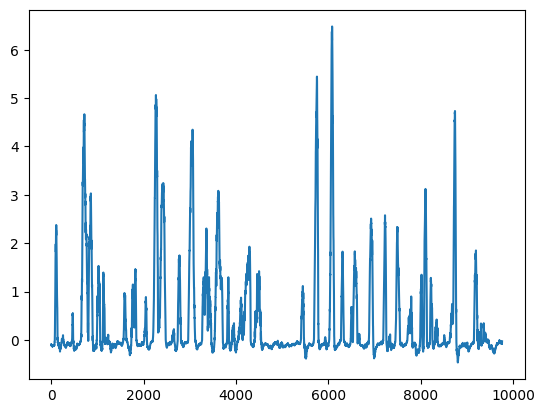

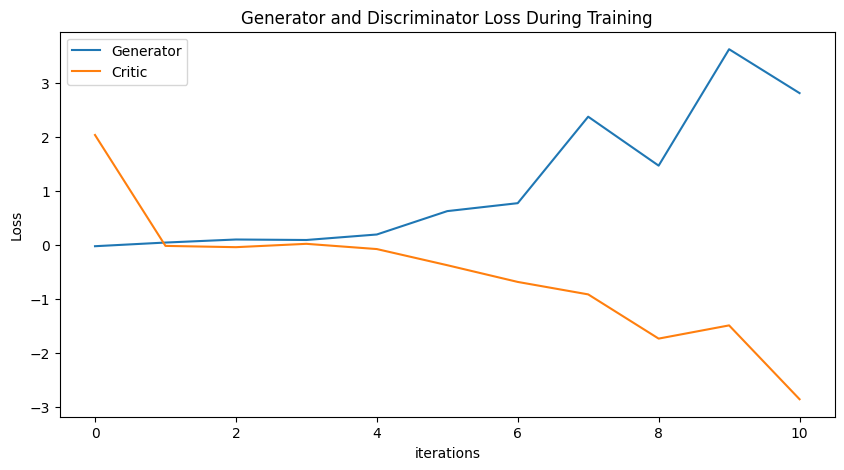

Epoch 20: Critic error ([2.0423351870433435, -0.012860582451595992, -0.03655930382112352, 0.02547116818854203, -0.07155952422086534, -0.3707955602434334, -0.6805564777586038, -0.9114850348992001, -1.7308199420295372, -1.485944159206586, -2.8540448595043886, -2.3392447508798995, -3.2868477861717595, -2.7662740485936994, -3.482535865455064, -3.3657857682317815, -4.172209515372905, -4.017115271201201, -4.560253099815781, -4.5504222585223255, -5.2290681022433]) Generator err ([-0.01871659979224205, 0.049190372228622437, 0.10557858645915985, 0.09649421274662018, 0.19848352670669556, 0.6316109895706177, 0.7788398265838623, 2.3813633918762207, 1.474191427230835, 3.6316051483154297, 2.8183205127716064, 4.476003170013428, 3.134052038192749, 5.105416774749756, 3.4062111377716064, 5.617495536804199, 4.261722564697266, 6.38468599319458, 5.0038275718688965, 7.459485054016113, 6.2420759201049805])


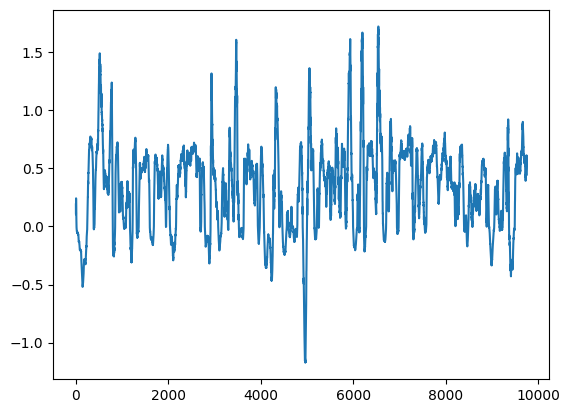

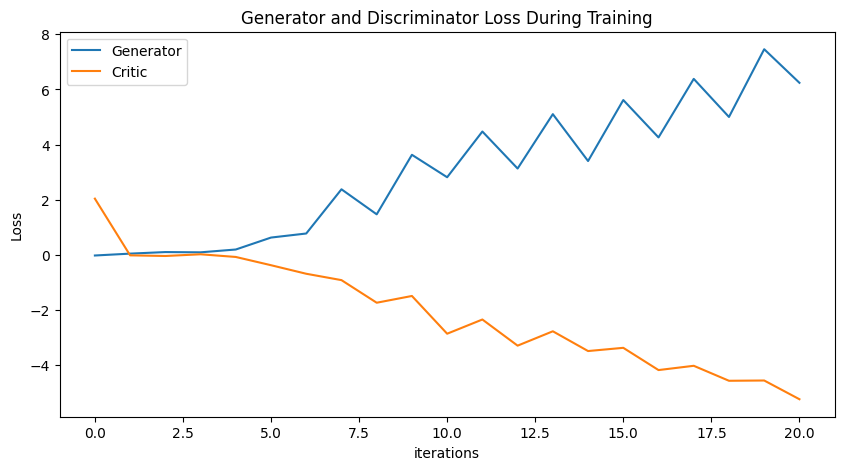

Epoch 30: Critic error ([2.0423351870433435, -0.012860582451595992, -0.03655930382112352, 0.02547116818854203, -0.07155952422086534, -0.3707955602434334, -0.6805564777586038, -0.9114850348992001, -1.7308199420295372, -1.485944159206586, -2.8540448595043886, -2.3392447508798995, -3.2868477861717595, -2.7662740485936994, -3.482535865455064, -3.3657857682317815, -4.172209515372905, -4.017115271201201, -4.560253099815781, -4.5504222585223255, -5.2290681022433, -5.254843971857565, -4.944073804524622, -4.635236061629417, -5.225759413100643, -4.9470242576435295, -4.8456131512184255, -4.859954308699594, -4.406718605234441, -4.023256349311912, -3.730990460979393]) Generator err ([-0.01871659979224205, 0.049190372228622437, 0.10557858645915985, 0.09649421274662018, 0.19848352670669556, 0.6316109895706177, 0.7788398265838623, 2.3813633918762207, 1.474191427230835, 3.6316051483154297, 2.8183205127716064, 4.476003170013428, 3.134052038192749, 5.105416774749756, 3.4062111377716064, 5.617495536804199

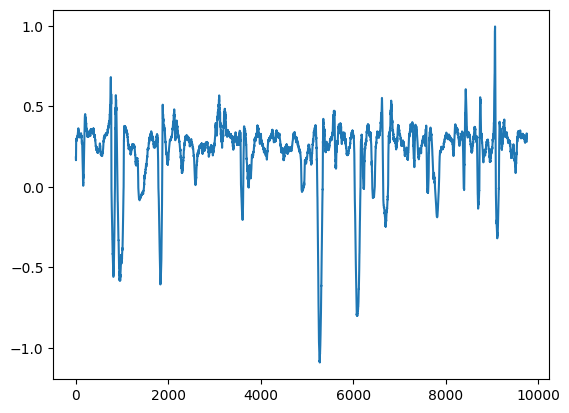

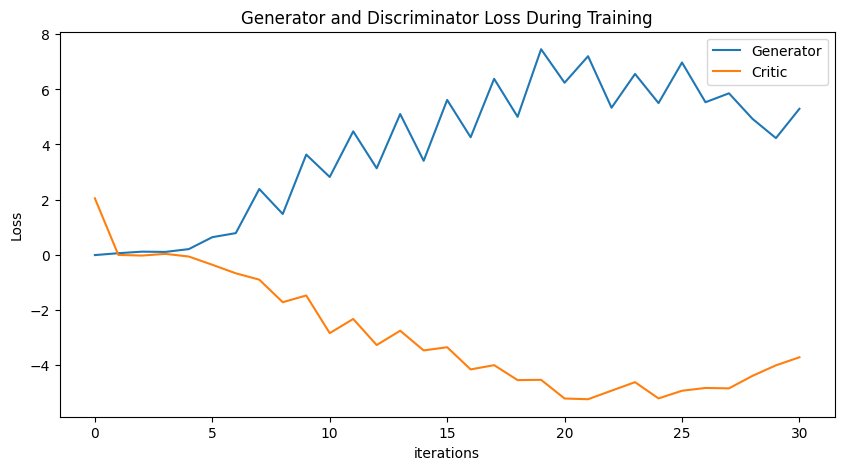

Epoch 40: Critic error ([2.0423351870433435, -0.012860582451595992, -0.03655930382112352, 0.02547116818854203, -0.07155952422086534, -0.3707955602434334, -0.6805564777586038, -0.9114850348992001, -1.7308199420295372, -1.485944159206586, -2.8540448595043886, -2.3392447508798995, -3.2868477861717595, -2.7662740485936994, -3.482535865455064, -3.3657857682317815, -4.172209515372905, -4.017115271201201, -4.560253099815781, -4.5504222585223255, -5.2290681022433, -5.254843971857565, -4.944073804524622, -4.635236061629417, -5.225759413100643, -4.9470242576435295, -4.8456131512184255, -4.859954308699594, -4.406718605234441, -4.023256349311912, -3.730990460979393, -3.8068326130574937, -3.8722522677541624, -3.7558839649341356, -4.0636795861875346, -4.122124776092254, -4.089010791412235, -3.7562901746990223, -3.5148041998635007, -4.005022534772419, -3.6451132435102864]) Generator err ([-0.01871659979224205, 0.049190372228622437, 0.10557858645915985, 0.09649421274662018, 0.19848352670669556, 0.6316

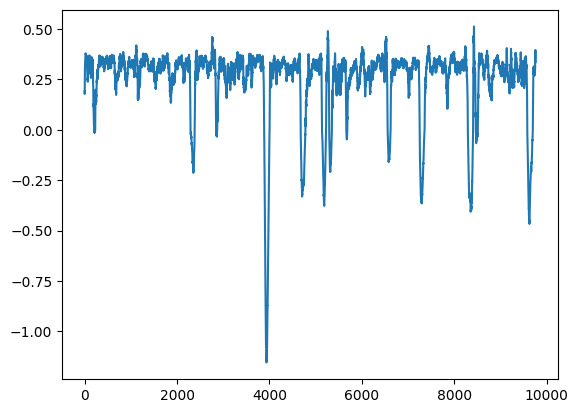

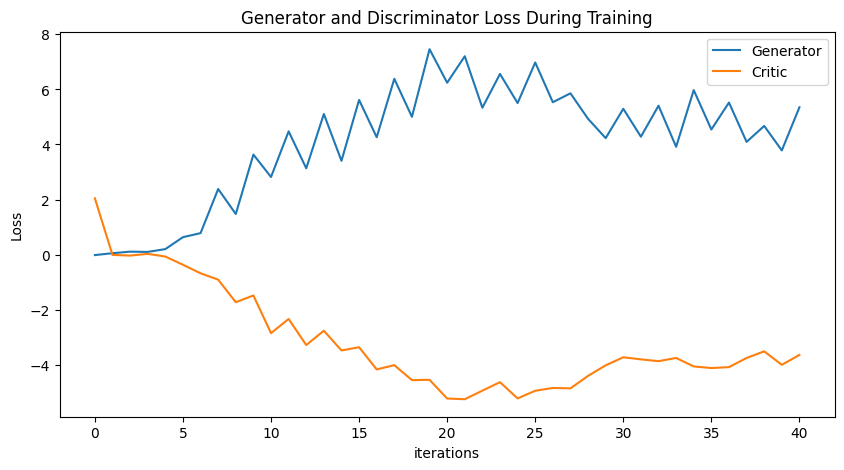

Epoch 50: Critic error ([2.0423351870433435, -0.012860582451595992, -0.03655930382112352, 0.02547116818854203, -0.07155952422086534, -0.3707955602434334, -0.6805564777586038, -0.9114850348992001, -1.7308199420295372, -1.485944159206586, -2.8540448595043886, -2.3392447508798995, -3.2868477861717595, -2.7662740485936994, -3.482535865455064, -3.3657857682317815, -4.172209515372905, -4.017115271201201, -4.560253099815781, -4.5504222585223255, -5.2290681022433, -5.254843971857565, -4.944073804524622, -4.635236061629417, -5.225759413100643, -4.9470242576435295, -4.8456131512184255, -4.859954308699594, -4.406718605234441, -4.023256349311912, -3.730990460979393, -3.8068326130574937, -3.8722522677541624, -3.7558839649341356, -4.0636795861875346, -4.122124776092254, -4.089010791412235, -3.7562901746990223, -3.5148041998635007, -4.005022534772419, -3.6451132435102864, -3.772397388079891, -3.563547050059197, -3.360157302830631, -3.3604445626572343, -3.2726193424798273, -3.268029603979931, -3.84422

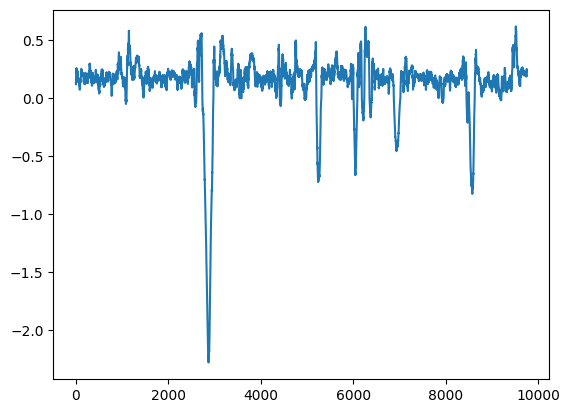

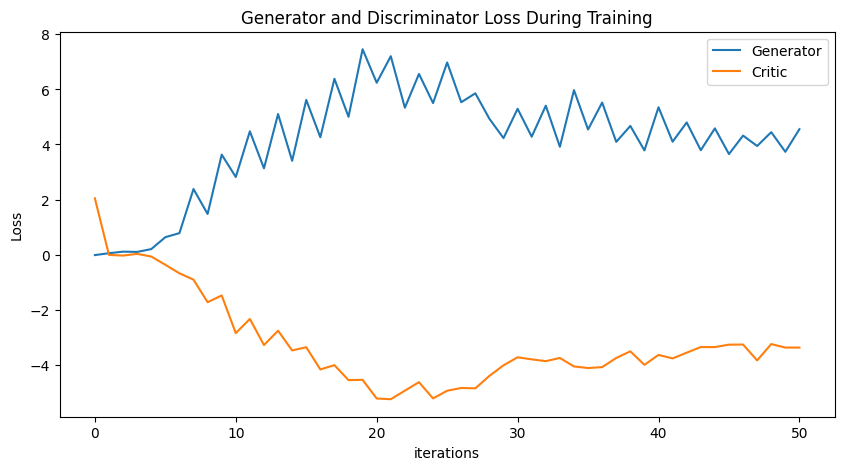

Epoch 60: Critic error ([2.0423351870433435, -0.012860582451595992, -0.03655930382112352, 0.02547116818854203, -0.07155952422086534, -0.3707955602434334, -0.6805564777586038, -0.9114850348992001, -1.7308199420295372, -1.485944159206586, -2.8540448595043886, -2.3392447508798995, -3.2868477861717595, -2.7662740485936994, -3.482535865455064, -3.3657857682317815, -4.172209515372905, -4.017115271201201, -4.560253099815781, -4.5504222585223255, -5.2290681022433, -5.254843971857565, -4.944073804524622, -4.635236061629417, -5.225759413100643, -4.9470242576435295, -4.8456131512184255, -4.859954308699594, -4.406718605234441, -4.023256349311912, -3.730990460979393, -3.8068326130574937, -3.8722522677541624, -3.7558839649341356, -4.0636795861875346, -4.122124776092254, -4.089010791412235, -3.7562901746990223, -3.5148041998635007, -4.005022534772419, -3.6451132435102864, -3.772397388079891, -3.563547050059197, -3.360157302830631, -3.3604445626572343, -3.2726193424798273, -3.268029603979931, -3.84422

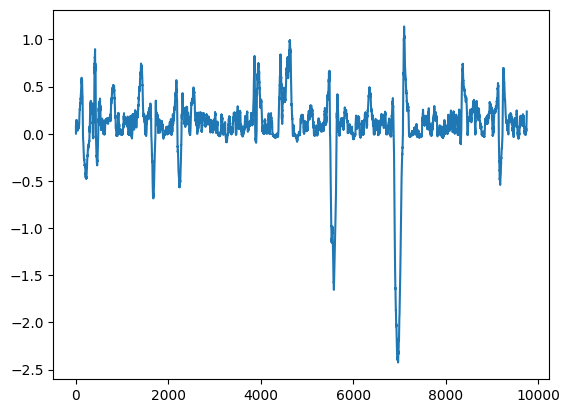

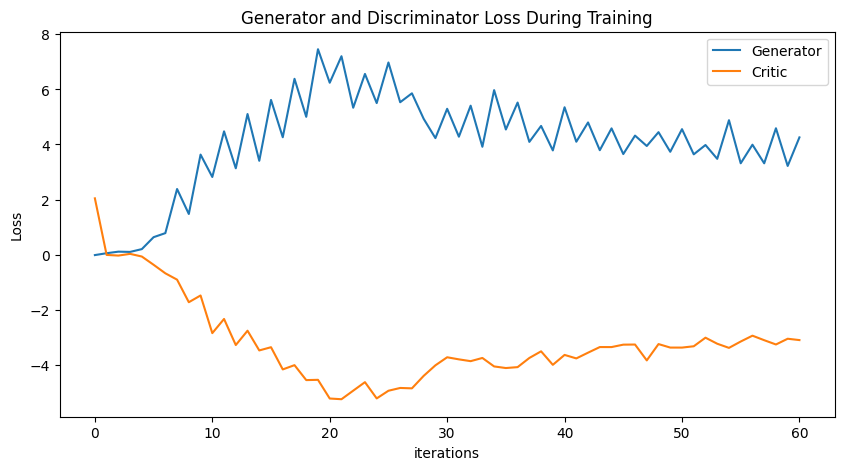

In [60]:
# baseline 

NUM_EPOCHS = 70
PRINT_INTERVAL = 10 # every 10 epoch, print status
BATCH_SIZE = np.shape(training_data_open)[0]
NUM_CHANNELS = 64
SEQUENCE_LENGTH = 9760
LAMBDA_GP = 5

training_data = torch.tensor(training_data_open)

def weights_init(model):
    for m in model.modules():
      if isinstance(m, (nn.Conv1d, nn.ConvTranspose1d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)

# Gaussian normal distribution
def sample_normal_distribution(i, j, k):
    mu = 0
    sigma = 0.02
    return torch.Tensor(np.random.normal(mu, sigma, (i, j, k)))

def gradient_penalty(D, real, fake):
    alpha = torch.rand((BATCH_SIZE, 1, 1)).repeat(1, NUM_CHANNELS, SEQUENCE_LENGTH)
    interpolated_seq = real * alpha + fake * (1 - alpha)

    # Calculate discriminator scores
    mixed_scores = D(interpolated_seq)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_seq,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            real = training_data.clone().detach()
            real.requires_grad=True
            noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
            fake = G(noise)
            critic_real = D(real).reshape(-1) # flatten
            critic_fake = D(fake).reshape(-1) # flatten
            gp = gradient_penalty(D, real, fake)
            critic_loss = -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
            D.zero_grad()
            critic_loss.backward(retain_graph=True)
            critic_optimizer.step()

        generated_data = fake
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()

        critic_err.append(critic_loss.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            values = generated_data[0, 0, :]
            plt.plot(values.tolist())
            plt.show()
            
            # plotting G vs D losses
            plt.figure(figsize=(10,5))
            plt.title("Generator and Discriminator Loss During Training")
            plt.plot(gen_err,label="Generator")
            plt.plot(critic_err,label="Critic")
            plt.xlabel("iterations")
            plt.ylabel("Loss")
            plt.legend()
            plt.show()

    return critic_err, gen_err, generated_data, D, G

critic_err_open, gen_err_open, generated_data_open, disc, gen = train()

torch.save(gen, 'gen_open.pt')
torch.save(disc, 'disc_open.pt')

eyes open


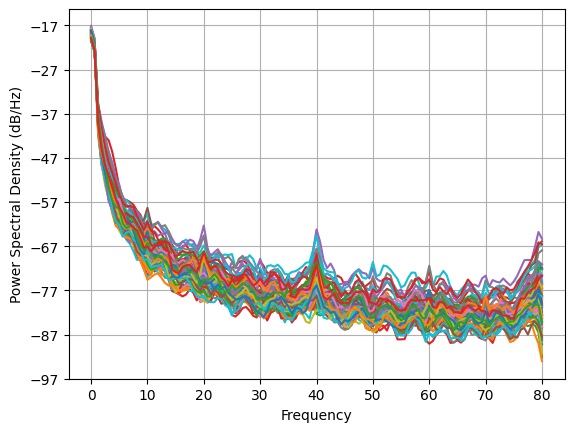

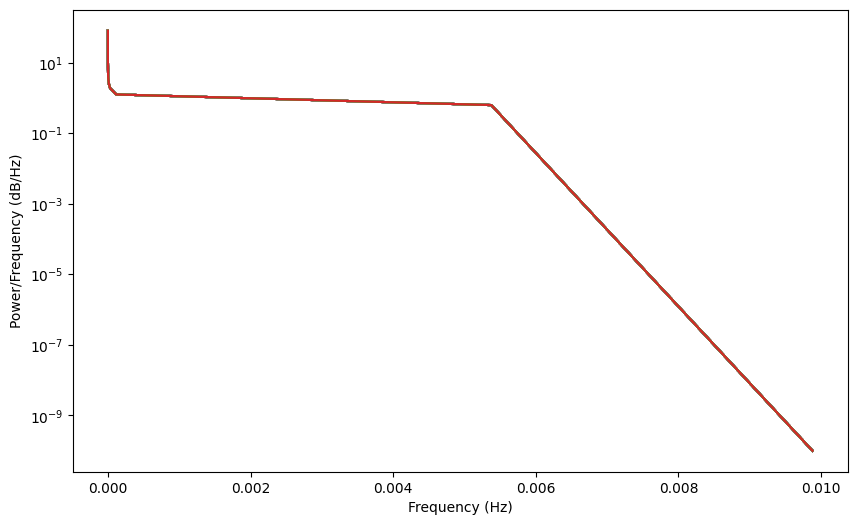

In [154]:
averaged_data = generated_data_open.detach().mean(dim=0)
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')

print("eyes open")
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()

Epoch 0: Critic error ([1.5353020093759673]) Generator err ([-0.03224160894751549])


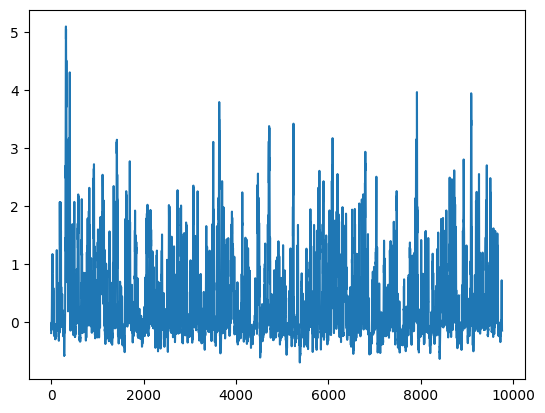

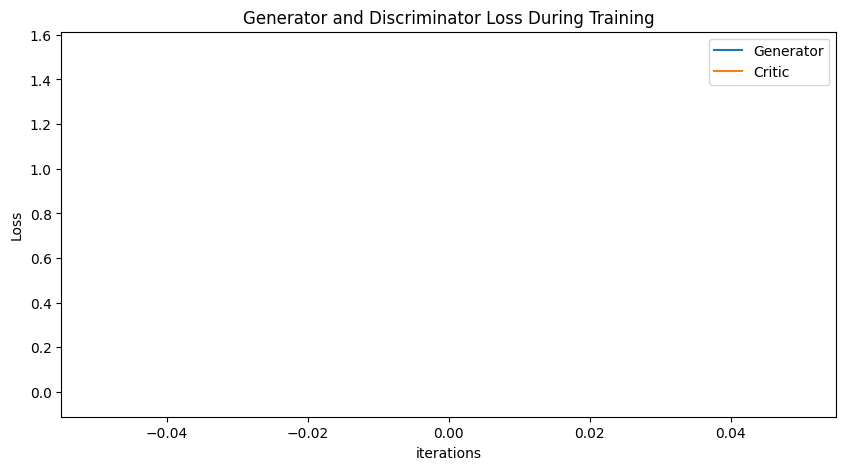

Epoch 10: Critic error ([1.5353020093759673, 1.0228728213697267, 0.605427915184839, 0.4580856109744317, 0.2923391560736925, 0.21078451308535873, 0.18350704714174343, 0.1945925192989664, 0.03164784899567504, 0.06786924201675099, 0.1738743454587165]) Generator err ([-0.03224160894751549, -0.1126360297203064, -0.21810083091259003, -0.2511042058467865, -0.2497183382511139, -0.1872405707836151, -0.13308891654014587, -0.1378105729818344, 0.008619839325547218, -0.03273027017712593, -0.1456783264875412])


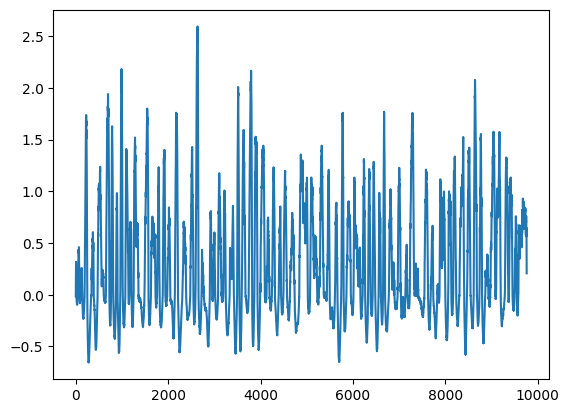

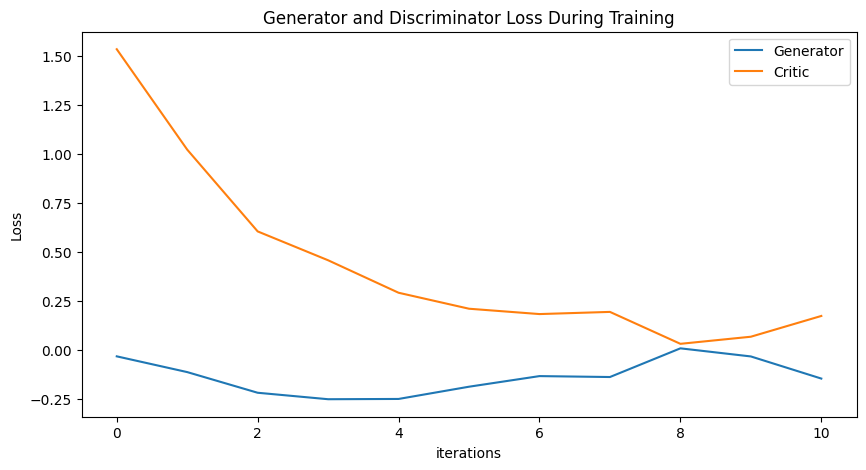

Epoch 20: Critic error ([1.5353020093759673, 1.0228728213697267, 0.605427915184839, 0.4580856109744317, 0.2923391560736925, 0.21078451308535873, 0.18350704714174343, 0.1945925192989664, 0.03164784899567504, 0.06786924201675099, 0.1738743454587165, 0.09596115443712133, 0.15587824682961923, 0.07319153088531874, 0.01570709349557451, 0.0771926841275039, 0.0670405927748814, -0.0789654549503439, -0.06262177609842194, -0.07414365979081679, -0.018685768760940406]) Generator err ([-0.03224160894751549, -0.1126360297203064, -0.21810083091259003, -0.2511042058467865, -0.2497183382511139, -0.1872405707836151, -0.13308891654014587, -0.1378105729818344, 0.008619839325547218, -0.03273027017712593, -0.1456783264875412, -0.018106862902641296, -0.08383992314338684, -0.02562781795859337, 0.015111606568098068, 0.026959996670484543, 0.0002430375461699441, 0.1095535010099411, 0.10234655439853668, 0.12162083387374878, 0.06906931102275848])


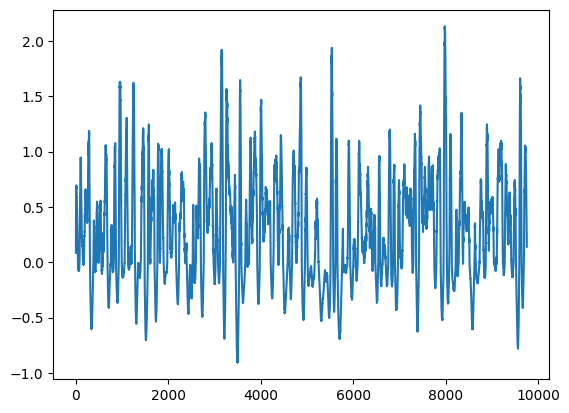

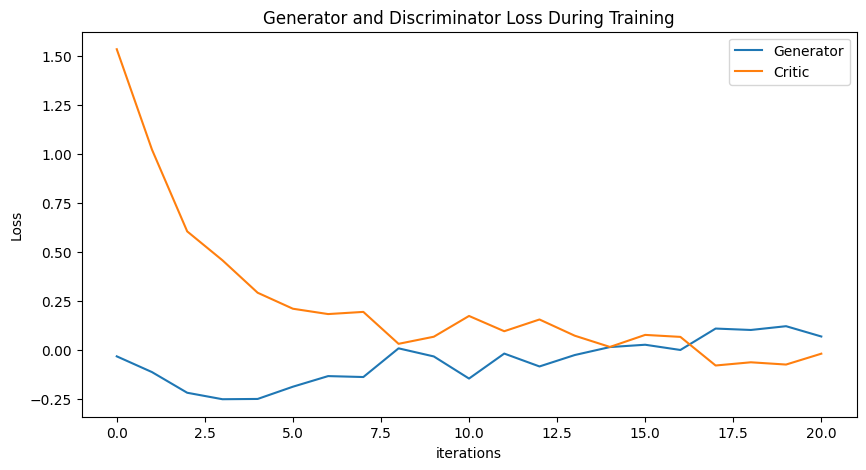

Epoch 30: Critic error ([1.5353020093759673, 1.0228728213697267, 0.605427915184839, 0.4580856109744317, 0.2923391560736925, 0.21078451308535873, 0.18350704714174343, 0.1945925192989664, 0.03164784899567504, 0.06786924201675099, 0.1738743454587165, 0.09596115443712133, 0.15587824682961923, 0.07319153088531874, 0.01570709349557451, 0.0771926841275039, 0.0670405927748814, -0.0789654549503439, -0.06262177609842194, -0.07414365979081679, -0.018685768760940406, -0.02897173371080202, -0.022993140348798784, -0.024045568170827182, -0.03759408979847975, -0.01574928983691953, -0.02613213869264575, -0.02058174676455534, 0.0025397721714826745, 0.004415220343417486, 0.003721087876449026]) Generator err ([-0.03224160894751549, -0.1126360297203064, -0.21810083091259003, -0.2511042058467865, -0.2497183382511139, -0.1872405707836151, -0.13308891654014587, -0.1378105729818344, 0.008619839325547218, -0.03273027017712593, -0.1456783264875412, -0.018106862902641296, -0.08383992314338684, -0.0256278179585933

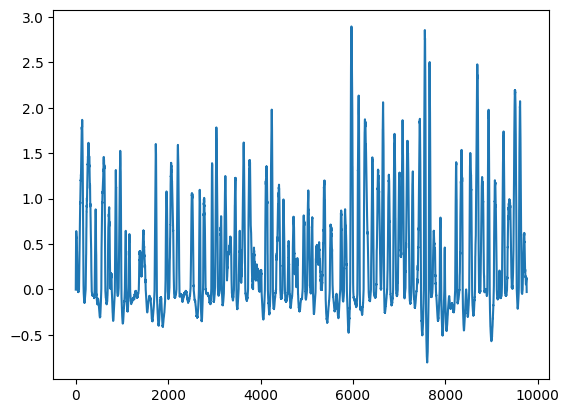

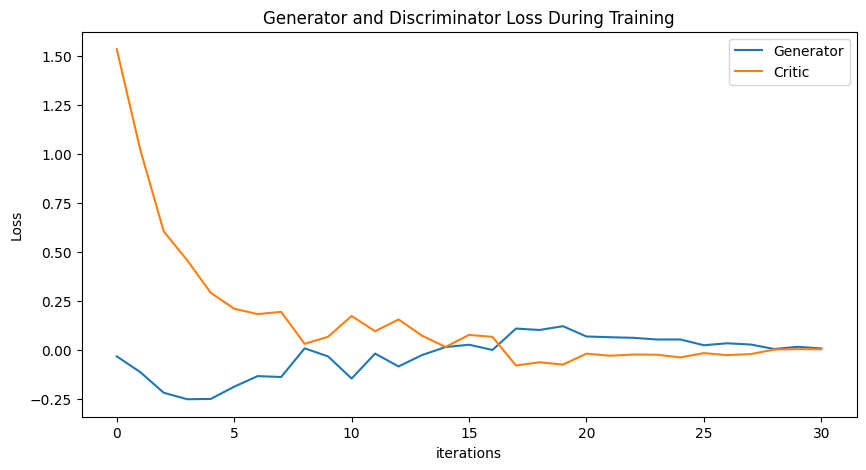

Epoch 40: Critic error ([1.5353020093759673, 1.0228728213697267, 0.605427915184839, 0.4580856109744317, 0.2923391560736925, 0.21078451308535873, 0.18350704714174343, 0.1945925192989664, 0.03164784899567504, 0.06786924201675099, 0.1738743454587165, 0.09596115443712133, 0.15587824682961923, 0.07319153088531874, 0.01570709349557451, 0.0771926841275039, 0.0670405927748814, -0.0789654549503439, -0.06262177609842194, -0.07414365979081679, -0.018685768760940406, -0.02897173371080202, -0.022993140348798784, -0.024045568170827182, -0.03759408979847975, -0.01574928983691953, -0.02613213869264575, -0.02058174676455534, 0.0025397721714826745, 0.004415220343417486, 0.003721087876449026, -0.013386670491603244, 0.006810901339689854, 0.024570453161898057, 0.010226209123328417, 0.02722273996625864, 0.034294001695665405, 0.015360840877171898, -0.00626834486072686, 0.0156442566564095, 0.0033035402651192085]) Generator err ([-0.03224160894751549, -0.1126360297203064, -0.21810083091259003, -0.2511042058467

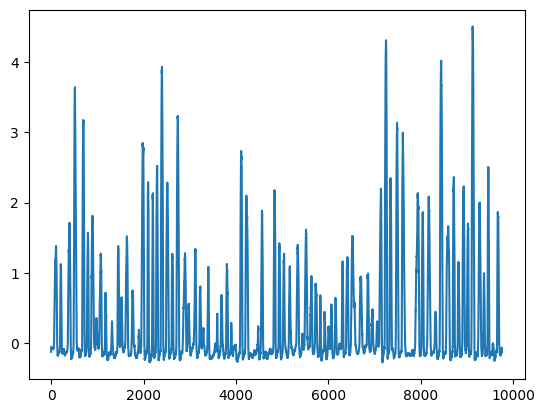

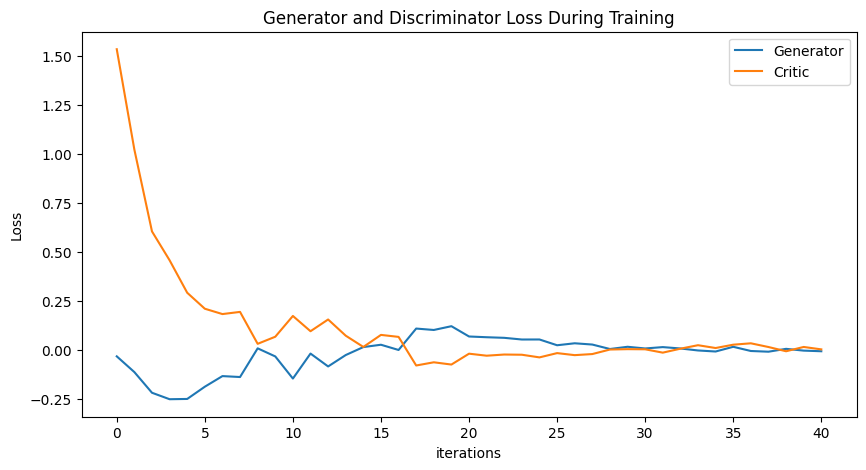

Epoch 50: Critic error ([1.5353020093759673, 1.0228728213697267, 0.605427915184839, 0.4580856109744317, 0.2923391560736925, 0.21078451308535873, 0.18350704714174343, 0.1945925192989664, 0.03164784899567504, 0.06786924201675099, 0.1738743454587165, 0.09596115443712133, 0.15587824682961923, 0.07319153088531874, 0.01570709349557451, 0.0771926841275039, 0.0670405927748814, -0.0789654549503439, -0.06262177609842194, -0.07414365979081679, -0.018685768760940406, -0.02897173371080202, -0.022993140348798784, -0.024045568170827182, -0.03759408979847975, -0.01574928983691953, -0.02613213869264575, -0.02058174676455534, 0.0025397721714826745, 0.004415220343417486, 0.003721087876449026, -0.013386670491603244, 0.006810901339689854, 0.024570453161898057, 0.010226209123328417, 0.02722273996625864, 0.034294001695665405, 0.015360840877171898, -0.00626834486072686, 0.0156442566564095, 0.0033035402651192085, 0.01158473699076783, 0.0022657894152823058, 0.012983823276344772, -0.000991998583353252, -0.003362

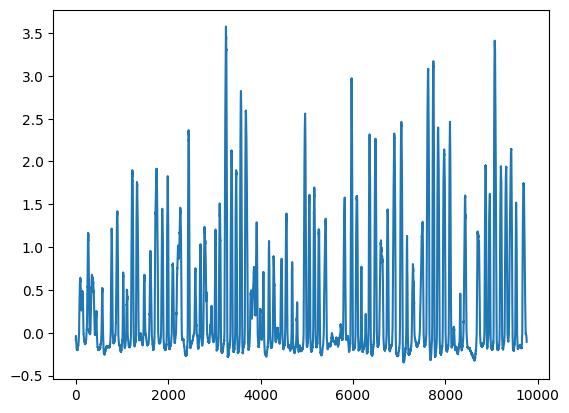

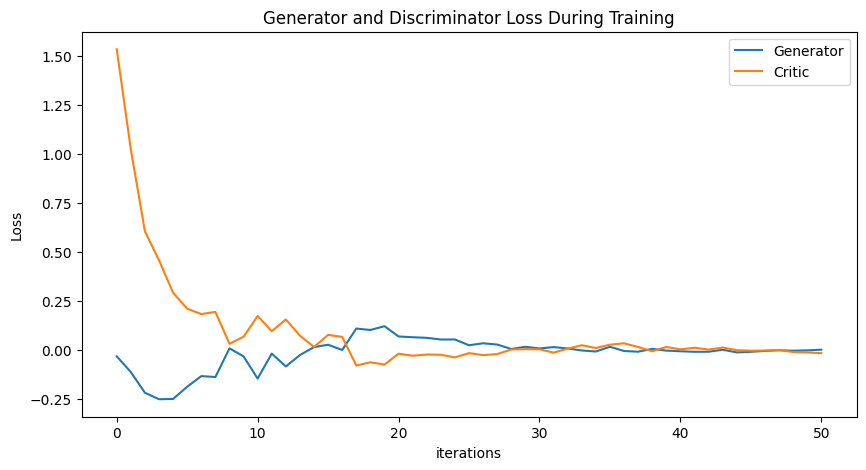

Epoch 60: Critic error ([1.5353020093759673, 1.0228728213697267, 0.605427915184839, 0.4580856109744317, 0.2923391560736925, 0.21078451308535873, 0.18350704714174343, 0.1945925192989664, 0.03164784899567504, 0.06786924201675099, 0.1738743454587165, 0.09596115443712133, 0.15587824682961923, 0.07319153088531874, 0.01570709349557451, 0.0771926841275039, 0.0670405927748814, -0.0789654549503439, -0.06262177609842194, -0.07414365979081679, -0.018685768760940406, -0.02897173371080202, -0.022993140348798784, -0.024045568170827182, -0.03759408979847975, -0.01574928983691953, -0.02613213869264575, -0.02058174676455534, 0.0025397721714826745, 0.004415220343417486, 0.003721087876449026, -0.013386670491603244, 0.006810901339689854, 0.024570453161898057, 0.010226209123328417, 0.02722273996625864, 0.034294001695665405, 0.015360840877171898, -0.00626834486072686, 0.0156442566564095, 0.0033035402651192085, 0.01158473699076783, 0.0022657894152823058, 0.012983823276344772, -0.000991998583353252, -0.003362

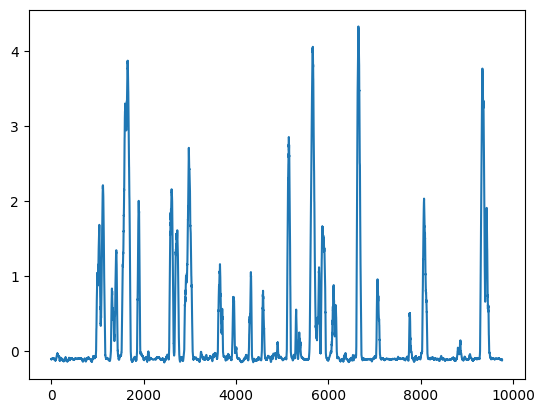

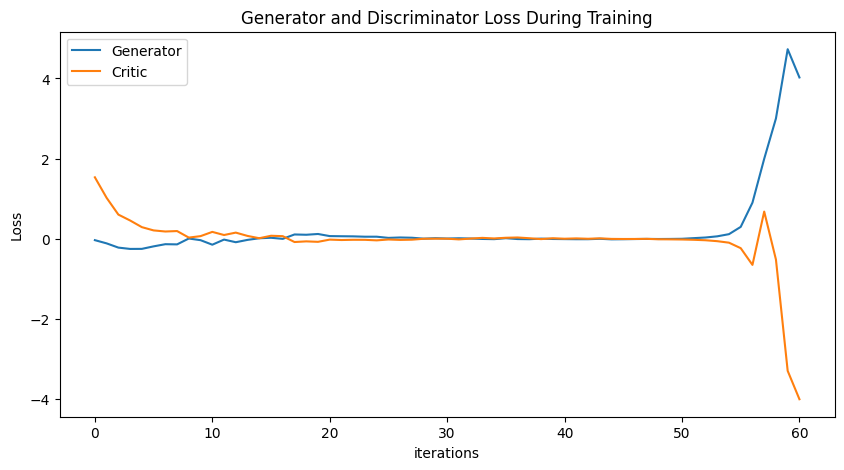

Epoch 70: Critic error ([1.5353020093759673, 1.0228728213697267, 0.605427915184839, 0.4580856109744317, 0.2923391560736925, 0.21078451308535873, 0.18350704714174343, 0.1945925192989664, 0.03164784899567504, 0.06786924201675099, 0.1738743454587165, 0.09596115443712133, 0.15587824682961923, 0.07319153088531874, 0.01570709349557451, 0.0771926841275039, 0.0670405927748814, -0.0789654549503439, -0.06262177609842194, -0.07414365979081679, -0.018685768760940406, -0.02897173371080202, -0.022993140348798784, -0.024045568170827182, -0.03759408979847975, -0.01574928983691953, -0.02613213869264575, -0.02058174676455534, 0.0025397721714826745, 0.004415220343417486, 0.003721087876449026, -0.013386670491603244, 0.006810901339689854, 0.024570453161898057, 0.010226209123328417, 0.02722273996625864, 0.034294001695665405, 0.015360840877171898, -0.00626834486072686, 0.0156442566564095, 0.0033035402651192085, 0.01158473699076783, 0.0022657894152823058, 0.012983823276344772, -0.000991998583353252, -0.003362

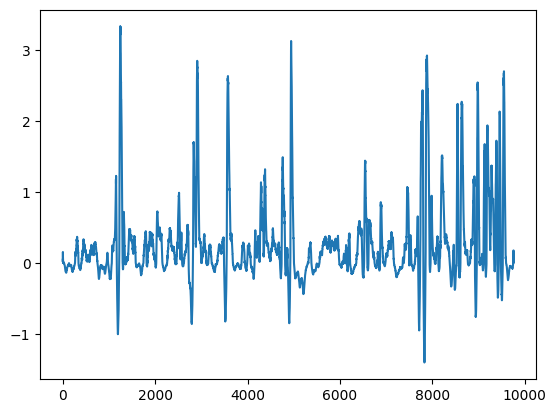

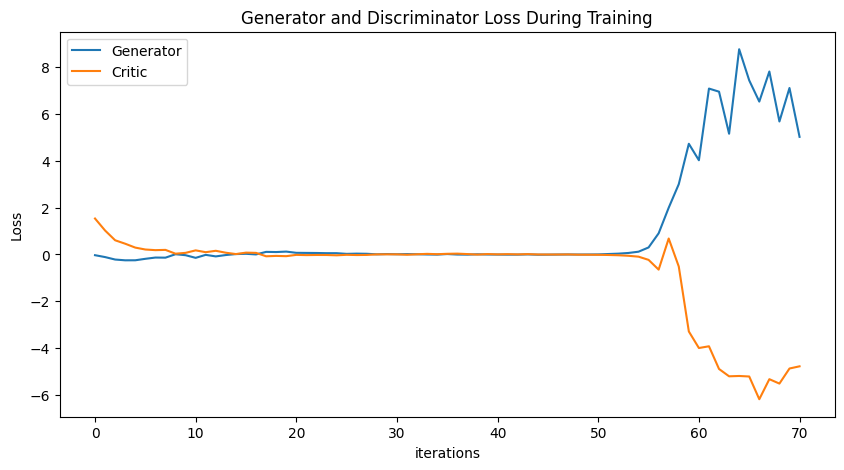

Epoch 80: Critic error ([1.5353020093759673, 1.0228728213697267, 0.605427915184839, 0.4580856109744317, 0.2923391560736925, 0.21078451308535873, 0.18350704714174343, 0.1945925192989664, 0.03164784899567504, 0.06786924201675099, 0.1738743454587165, 0.09596115443712133, 0.15587824682961923, 0.07319153088531874, 0.01570709349557451, 0.0771926841275039, 0.0670405927748814, -0.0789654549503439, -0.06262177609842194, -0.07414365979081679, -0.018685768760940406, -0.02897173371080202, -0.022993140348798784, -0.024045568170827182, -0.03759408979847975, -0.01574928983691953, -0.02613213869264575, -0.02058174676455534, 0.0025397721714826745, 0.004415220343417486, 0.003721087876449026, -0.013386670491603244, 0.006810901339689854, 0.024570453161898057, 0.010226209123328417, 0.02722273996625864, 0.034294001695665405, 0.015360840877171898, -0.00626834486072686, 0.0156442566564095, 0.0033035402651192085, 0.01158473699076783, 0.0022657894152823058, 0.012983823276344772, -0.000991998583353252, -0.003362

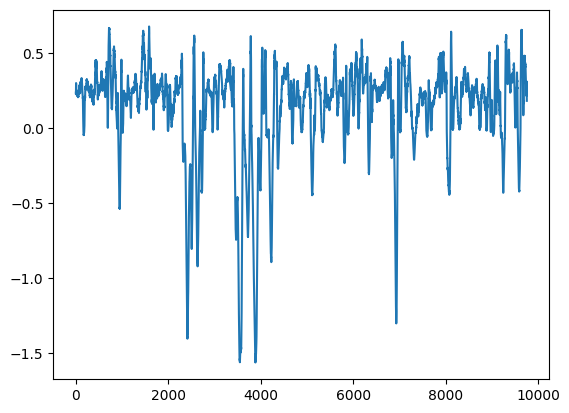

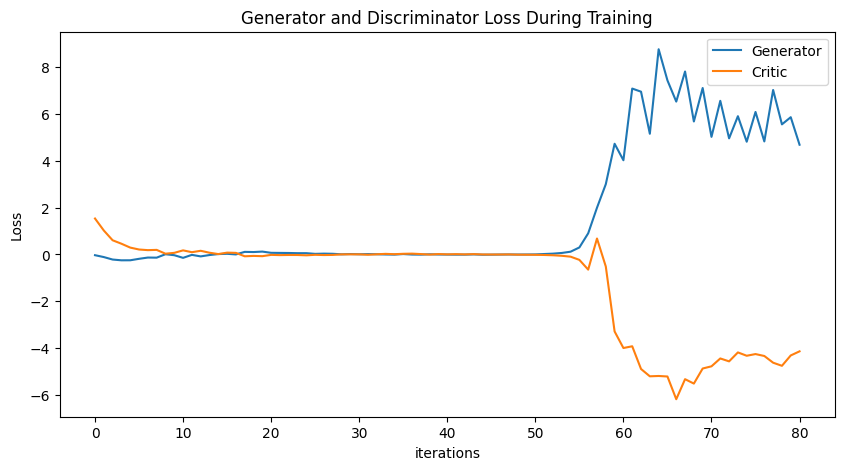

Epoch 90: Critic error ([1.5353020093759673, 1.0228728213697267, 0.605427915184839, 0.4580856109744317, 0.2923391560736925, 0.21078451308535873, 0.18350704714174343, 0.1945925192989664, 0.03164784899567504, 0.06786924201675099, 0.1738743454587165, 0.09596115443712133, 0.15587824682961923, 0.07319153088531874, 0.01570709349557451, 0.0771926841275039, 0.0670405927748814, -0.0789654549503439, -0.06262177609842194, -0.07414365979081679, -0.018685768760940406, -0.02897173371080202, -0.022993140348798784, -0.024045568170827182, -0.03759408979847975, -0.01574928983691953, -0.02613213869264575, -0.02058174676455534, 0.0025397721714826745, 0.004415220343417486, 0.003721087876449026, -0.013386670491603244, 0.006810901339689854, 0.024570453161898057, 0.010226209123328417, 0.02722273996625864, 0.034294001695665405, 0.015360840877171898, -0.00626834486072686, 0.0156442566564095, 0.0033035402651192085, 0.01158473699076783, 0.0022657894152823058, 0.012983823276344772, -0.000991998583353252, -0.003362

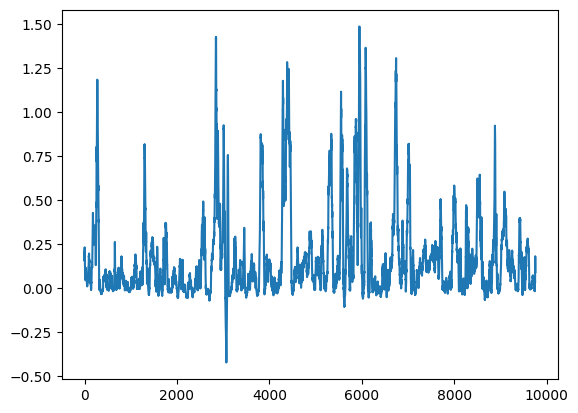

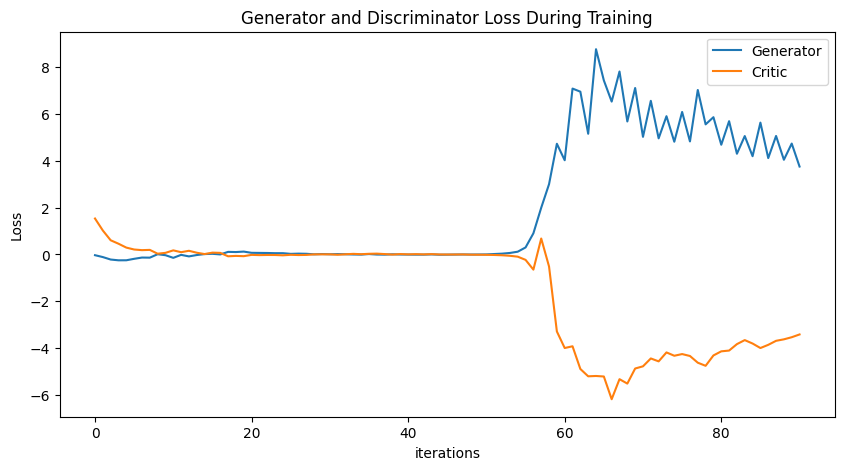

In [77]:
# baseline 

NUM_EPOCHS = 100
PRINT_INTERVAL = 10 # every 10 epoch, print status
BATCH_SIZE = np.shape(training_data_closed)[0]
NUM_CHANNELS = 64
SEQUENCE_LENGTH = 9760
LAMBDA_GP = 5

training_data = torch.tensor(training_data_closed)

def weights_init(model):
    for m in model.modules():
      if isinstance(m, (nn.Conv1d, nn.ConvTranspose1d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)

# Gaussian normal distribution
def sample_normal_distribution(i, j, k):
    mu = 0
    sigma = 0.02
    return torch.Tensor(np.random.normal(mu, sigma, (i, j, k)))

def gradient_penalty(D, real, fake):
    alpha = torch.rand((BATCH_SIZE, 1, 1)).repeat(1, NUM_CHANNELS, SEQUENCE_LENGTH)
    interpolated_seq = real * alpha + fake * (1 - alpha)

    # Calculate discriminator scores
    mixed_scores = D(interpolated_seq)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_seq,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            real = training_data.clone().detach()
            real.requires_grad=True
            noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
            fake = G(noise)
            critic_real = D(real).reshape(-1) # flatten
            critic_fake = D(fake).reshape(-1) # flatten
            gp = gradient_penalty(D, real, fake)
            critic_loss = -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
            D.zero_grad()
            critic_loss.backward(retain_graph=True)
            critic_optimizer.step()

        generated_data = fake
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()

        critic_err.append(critic_loss.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            values = generated_data[0, 0, :]
            plt.plot(values.tolist())
            plt.show()
            
            # plotting G vs D losses
            plt.figure(figsize=(10,5))
            plt.title("Generator and Discriminator Loss During Training")
            plt.plot(gen_err,label="Generator")
            plt.plot(critic_err,label="Critic")
            plt.xlabel("iterations")
            plt.ylabel("Loss")
            plt.legend()
            plt.show()

    return critic_err, gen_err, generated_data, D, G

critic_err_closed, gen_err_closed, generated_data_closed, disc, gen = train()

torch.save(gen, 'gen_closed.pt')
torch.save(disc, 'disc_closed.pt')

eyes closed


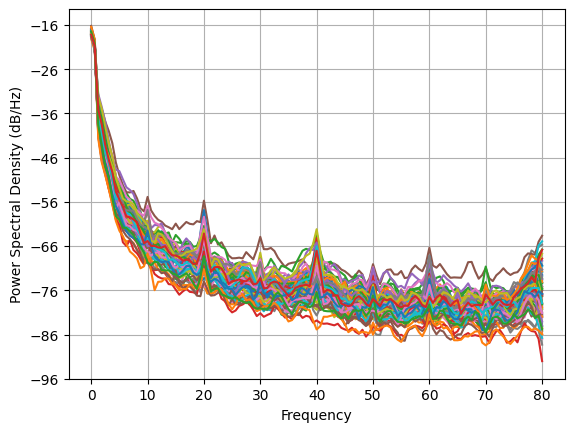

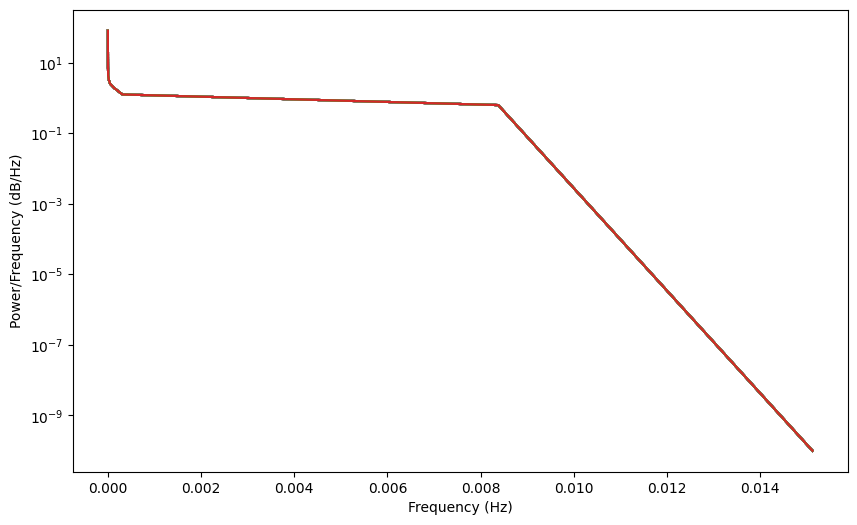

In [155]:
averaged_data = generated_data_closed.detach().mean(dim=0)
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')

print("eyes closed")
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()

# BASELINE + NORMALIZED

In [95]:
# from scipy import signal


# # compute smooth envelope of this signal = approx power
# training_data_closed_filtered = np.abs(training_data_closed)**2
# b, a = signal.butter(3, [10], btype='low', fs=1000)
# training_data_closed_filtered = signal.filtfilt(b, a, training_data_closed_filtered, 0)

# # normalize each channel so its mean power is 1
# # training_data_closed_filtered = training_data_closed_filtered/training_data_closed_filtered.mean(0)





# # compute smooth envelope of this signal = approx power
# training_data_open_filtered = np.abs(training_data_open)**2
# b, a = signal.butter(3, [10], btype='low', fs=1000)
# training_data_open_filtered = signal.filtfilt(b, a, training_data_open_filtered, 0)

# # normalize each channel so its mean power is 1
# # training_data_open_filtered = training_data_open_filtered/training_data_open_filtered.mean(0)


In [113]:
# from scipy.signal import butter, lfilter
# from sklearn.preprocessing import MinMaxScaler
# import numpy as np

# # Bandpass Filter
# def butter_bandpass(lowcut, highcut, fs, order = 5):
#     nyq = 0.5 * fs
#     low = lowcut / nyq
#     high = highcut / nyq
#     b, a = butter(order, [low, high], btype='band')
#     return b, a

# def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
#     b, a = butter_bandpass(lowcut, highcut, fs, order=order)
#     y = lfilter(b, a, data)
#     return y

# # Constants for bandpass filter
# lowcut = 0.5
# highcut = 50
# fs = 160

# Apply the bandpass filter
# filtered_data = np.zeros_like(training_data_open)
# for i in range(training_data_open.shape[0]):
#     for j in range(training_data_open.shape[1]):
#         filtered_data[i][j] = butter_bandpass_filter(training_data_open[i][j], lowcut, highcut, fs)


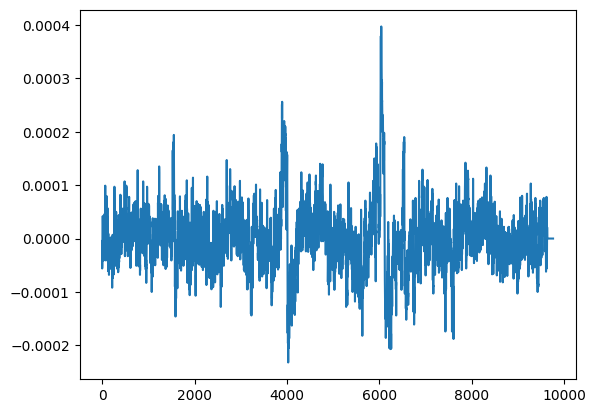

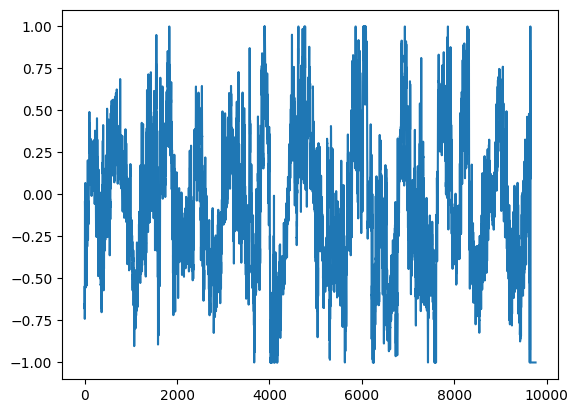

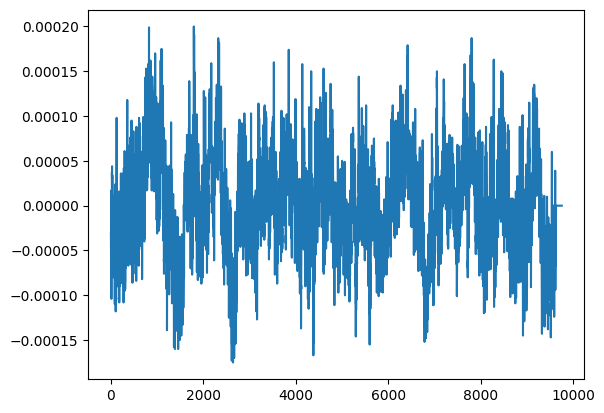

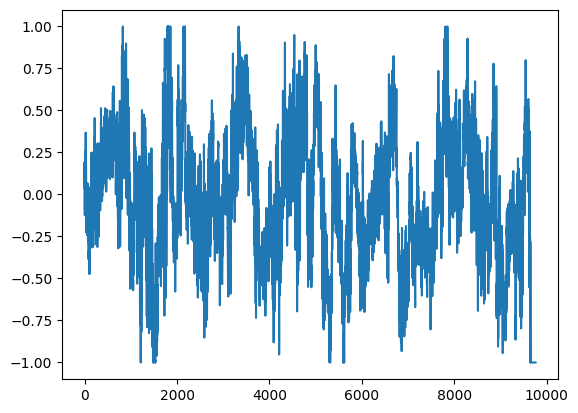

In [134]:
# Normalize the data (OPEN)
scaler = MinMaxScaler(feature_range=(-1, 1))
normalized_data_open = np.zeros_like(training_data_open)
for i in range(training_data_open.shape[1]):
    scaler = scaler.fit(training_data_open[:, i])
    normalized_data_open[:, i] = scaler.transform(training_data_open[:, i])
    
plt.plot(training_data_open[0][0])
plt.show()

plt.plot(normalized_data_open[0][0])
plt.show()


# Normalize the data (CLOSED)
scaler = MinMaxScaler(feature_range=(-1, 1))
normalized_data_closed = np.zeros_like(training_data_closed)
for i in range(training_data_closed.shape[1]):
    scaler = scaler.fit(training_data_closed[:, i])
    normalized_data_closed[:, i] = scaler.transform(training_data_closed[:, i])
    
plt.plot(training_data_closed[1][0])
plt.show()

plt.plot(normalized_data_closed[1][0])
plt.show()


Epoch 0: Critic error ([1.8670490023177013]) Generator err ([-0.04937806352972984])


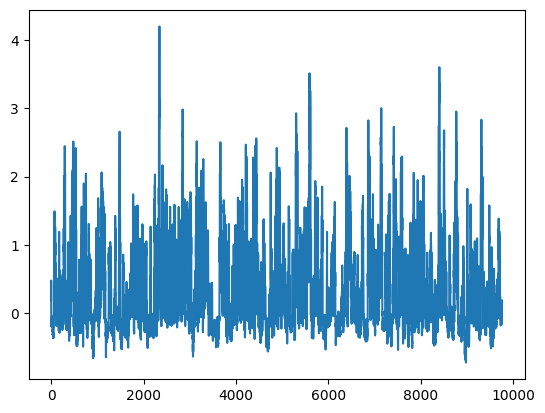

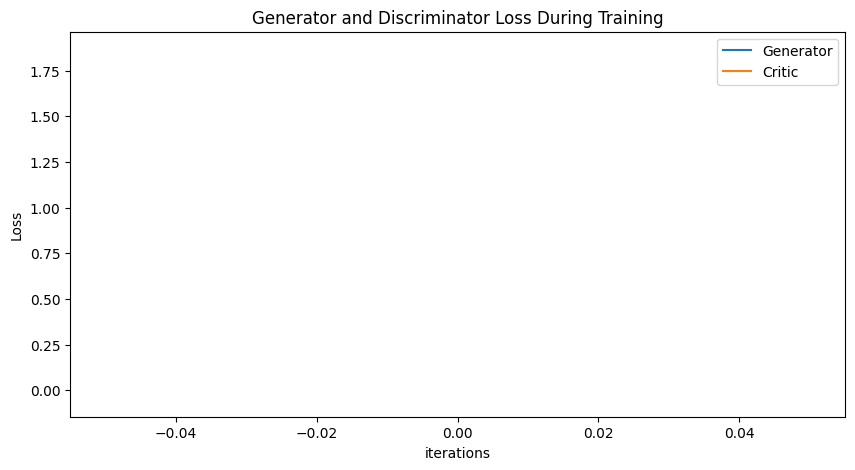

Epoch 10: Critic error ([1.8670490023177013, -0.0011635343583610708, -0.022591818454736505, -0.04394122148070038, -0.07417515127674305, -0.06382649857817027, -0.021131353768808786, -0.0055834868722011155, -0.11569126010264053, -0.0639238131087922, -0.1387394494900791]) Generator err ([-0.04937806352972984, -0.0712830200791359, -0.07856548577547073, -0.06813260912895203, -0.0377894751727581, -0.013961372897028923, 0.029507314786314964, 0.009085197001695633, 0.04886298626661301, 0.0016003025230020285, -0.055487751960754395])


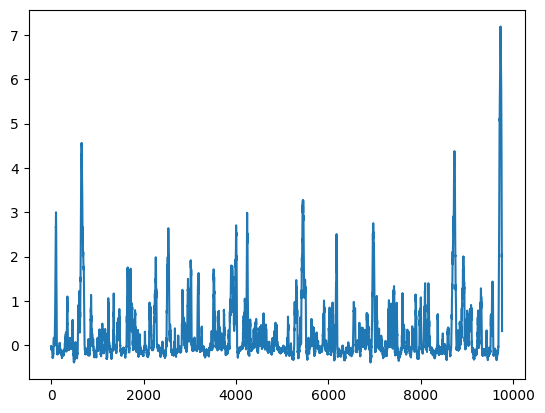

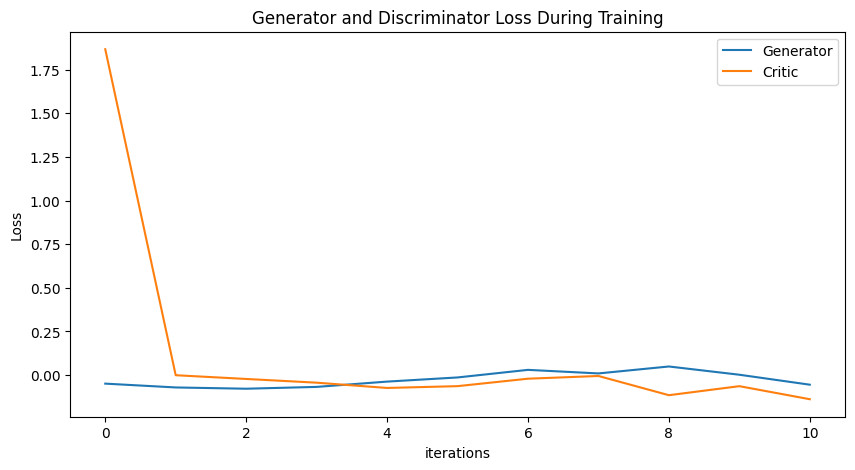

Epoch 20: Critic error ([1.8670490023177013, -0.0011635343583610708, -0.022591818454736505, -0.04394122148070038, -0.07417515127674305, -0.06382649857817027, -0.021131353768808786, -0.0055834868722011155, -0.11569126010264053, -0.0639238131087922, -0.1387394494900791, -0.23183352452242775, -0.37107405035641244, -0.4766790543402782, -0.593698791108505, -0.6238456886679771, -0.8434172362403132, -0.7101793445883509, -1.1974548918218553, -1.3492498262848973, -1.6743473269680886]) Generator err ([-0.04937806352972984, -0.0712830200791359, -0.07856548577547073, -0.06813260912895203, -0.0377894751727581, -0.013961372897028923, 0.029507314786314964, 0.009085197001695633, 0.04886298626661301, 0.0016003025230020285, -0.055487751960754395, -0.05793479457497597, -0.062406182289123535, -0.09029056876897812, -0.11503145843744278, -0.14613690972328186, -0.14638493955135345, -0.15740907192230225, -0.1843748688697815, -0.16812030971050262, -0.2129313051700592])


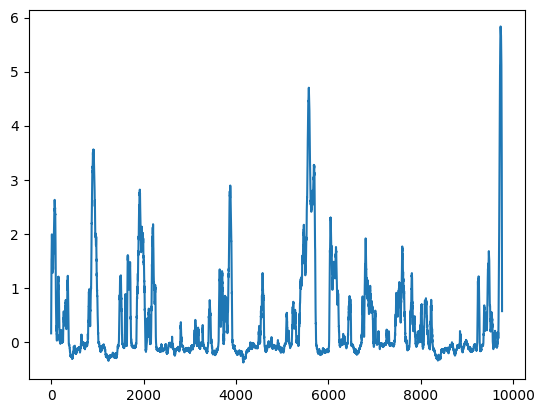

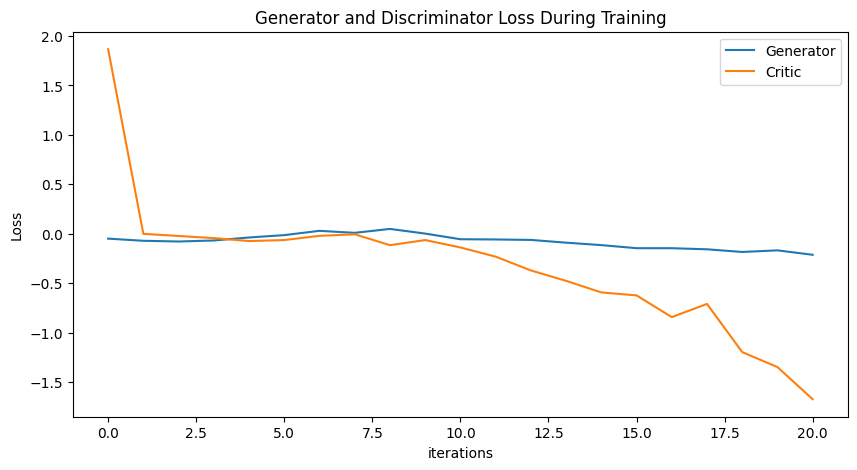

Epoch 30: Critic error ([1.8670490023177013, -0.0011635343583610708, -0.022591818454736505, -0.04394122148070038, -0.07417515127674305, -0.06382649857817027, -0.021131353768808786, -0.0055834868722011155, -0.11569126010264053, -0.0639238131087922, -0.1387394494900791, -0.23183352452242775, -0.37107405035641244, -0.4766790543402782, -0.593698791108505, -0.6238456886679771, -0.8434172362403132, -0.7101793445883509, -1.1974548918218553, -1.3492498262848973, -1.6743473269680886, -0.2934362209164081, -1.9655776086431649, -1.8493467936670087, -1.7846443367754132, -2.0806087501305486, -2.0642259705074206, -1.9565221643769344, -2.2503908688424787, -2.2433869537950764, -2.120958634464178]) Generator err ([-0.04937806352972984, -0.0712830200791359, -0.07856548577547073, -0.06813260912895203, -0.0377894751727581, -0.013961372897028923, 0.029507314786314964, 0.009085197001695633, 0.04886298626661301, 0.0016003025230020285, -0.055487751960754395, -0.05793479457497597, -0.062406182289123535, -0.0902

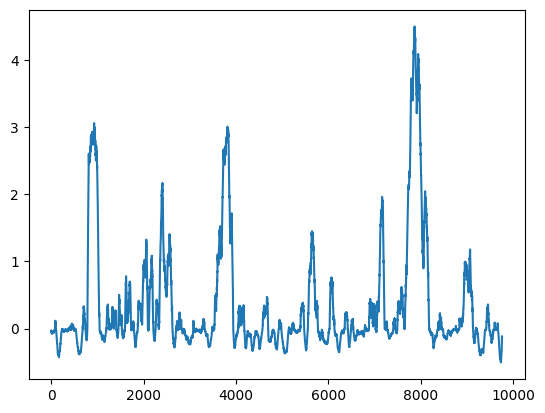

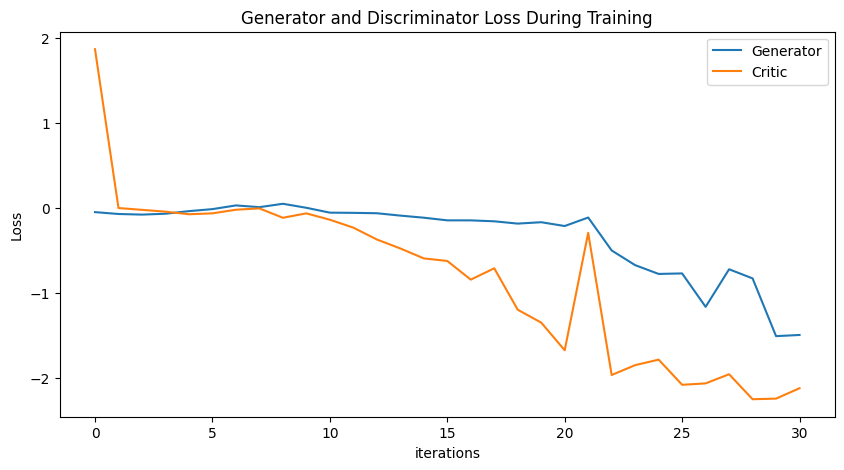

Epoch 40: Critic error ([1.8670490023177013, -0.0011635343583610708, -0.022591818454736505, -0.04394122148070038, -0.07417515127674305, -0.06382649857817027, -0.021131353768808786, -0.0055834868722011155, -0.11569126010264053, -0.0639238131087922, -0.1387394494900791, -0.23183352452242775, -0.37107405035641244, -0.4766790543402782, -0.593698791108505, -0.6238456886679771, -0.8434172362403132, -0.7101793445883509, -1.1974548918218553, -1.3492498262848973, -1.6743473269680886, -0.2934362209164081, -1.9655776086431649, -1.8493467936670087, -1.7846443367754132, -2.0806087501305486, -2.0642259705074206, -1.9565221643769344, -2.2503908688424787, -2.2433869537950764, -2.120958634464178, -2.374520956731704, -1.8837077597402967, -2.4379399366024597, -2.375210164383228, -2.5124790843367806, -2.1011522614800726, -2.6327407186478577, -2.349372330929965, -2.6018255620923236, -2.855409056624133]) Generator err ([-0.04937806352972984, -0.0712830200791359, -0.07856548577547073, -0.06813260912895203, -

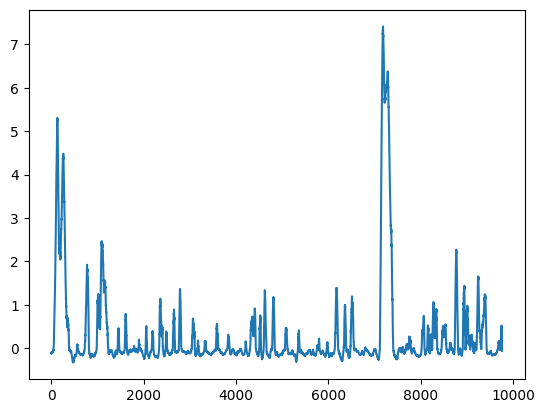

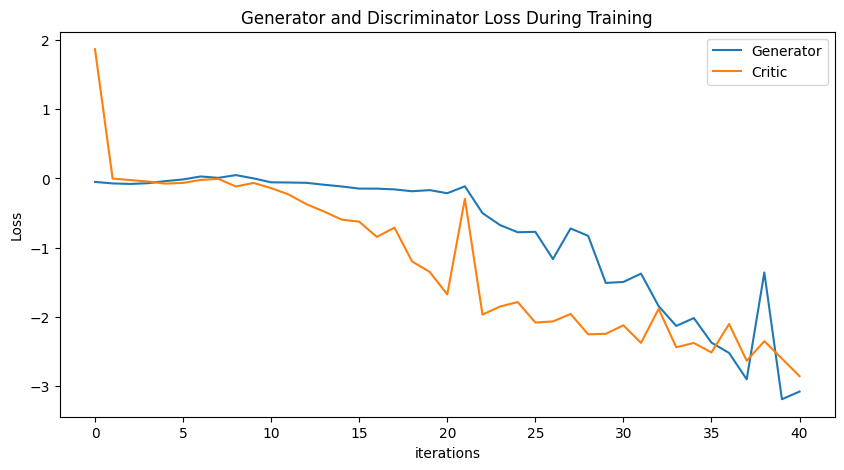

Epoch 50: Critic error ([1.8670490023177013, -0.0011635343583610708, -0.022591818454736505, -0.04394122148070038, -0.07417515127674305, -0.06382649857817027, -0.021131353768808786, -0.0055834868722011155, -0.11569126010264053, -0.0639238131087922, -0.1387394494900791, -0.23183352452242775, -0.37107405035641244, -0.4766790543402782, -0.593698791108505, -0.6238456886679771, -0.8434172362403132, -0.7101793445883509, -1.1974548918218553, -1.3492498262848973, -1.6743473269680886, -0.2934362209164081, -1.9655776086431649, -1.8493467936670087, -1.7846443367754132, -2.0806087501305486, -2.0642259705074206, -1.9565221643769344, -2.2503908688424787, -2.2433869537950764, -2.120958634464178, -2.374520956731704, -1.8837077597402967, -2.4379399366024597, -2.375210164383228, -2.5124790843367806, -2.1011522614800726, -2.6327407186478577, -2.349372330929965, -2.6018255620923236, -2.855409056624133, -2.3994716037525103, -1.9818085348679781, -1.744864478120983, -2.85846878274848, -3.2373329348116364, -3.

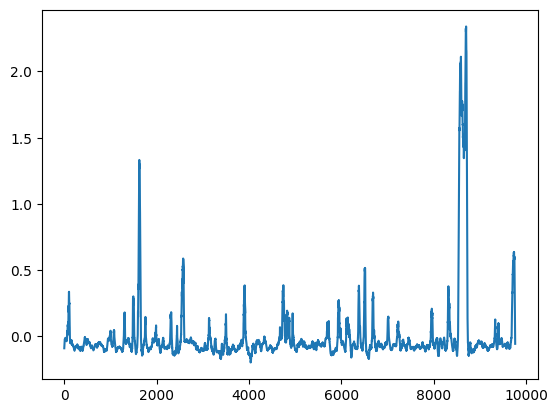

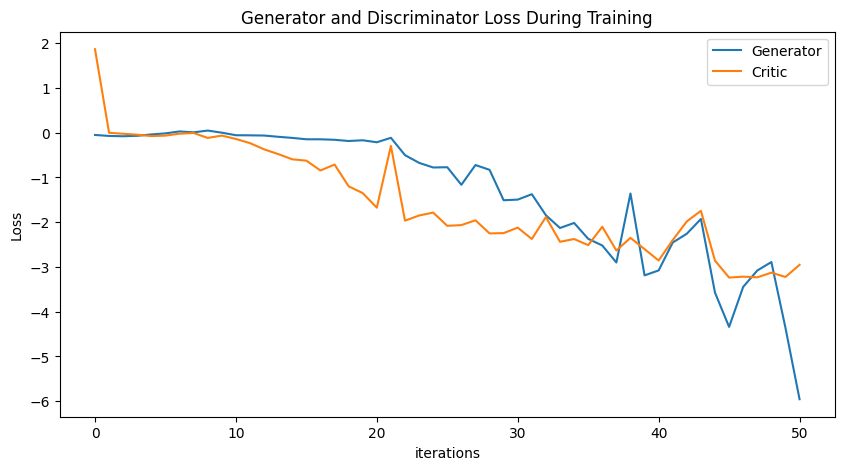

Epoch 60: Critic error ([1.8670490023177013, -0.0011635343583610708, -0.022591818454736505, -0.04394122148070038, -0.07417515127674305, -0.06382649857817027, -0.021131353768808786, -0.0055834868722011155, -0.11569126010264053, -0.0639238131087922, -0.1387394494900791, -0.23183352452242775, -0.37107405035641244, -0.4766790543402782, -0.593698791108505, -0.6238456886679771, -0.8434172362403132, -0.7101793445883509, -1.1974548918218553, -1.3492498262848973, -1.6743473269680886, -0.2934362209164081, -1.9655776086431649, -1.8493467936670087, -1.7846443367754132, -2.0806087501305486, -2.0642259705074206, -1.9565221643769344, -2.2503908688424787, -2.2433869537950764, -2.120958634464178, -2.374520956731704, -1.8837077597402967, -2.4379399366024597, -2.375210164383228, -2.5124790843367806, -2.1011522614800726, -2.6327407186478577, -2.349372330929965, -2.6018255620923236, -2.855409056624133, -2.3994716037525103, -1.9818085348679781, -1.744864478120983, -2.85846878274848, -3.2373329348116364, -3.

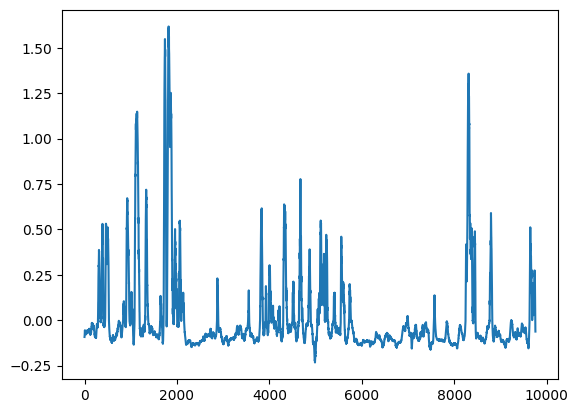

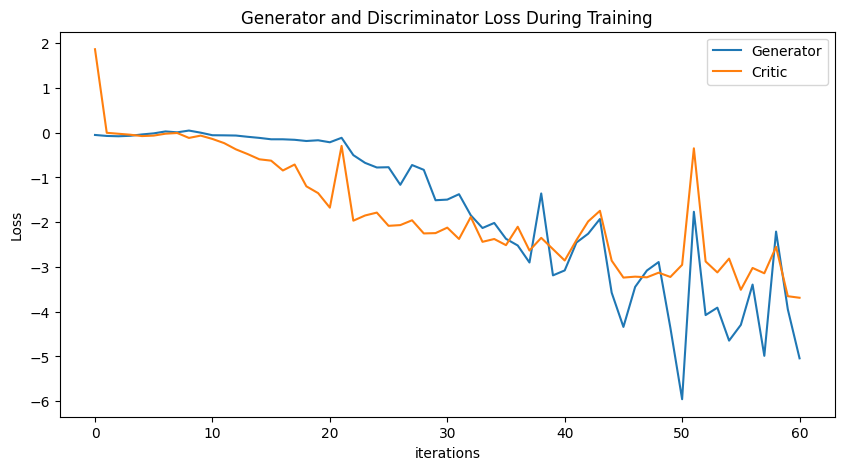

Epoch 70: Critic error ([1.8670490023177013, -0.0011635343583610708, -0.022591818454736505, -0.04394122148070038, -0.07417515127674305, -0.06382649857817027, -0.021131353768808786, -0.0055834868722011155, -0.11569126010264053, -0.0639238131087922, -0.1387394494900791, -0.23183352452242775, -0.37107405035641244, -0.4766790543402782, -0.593698791108505, -0.6238456886679771, -0.8434172362403132, -0.7101793445883509, -1.1974548918218553, -1.3492498262848973, -1.6743473269680886, -0.2934362209164081, -1.9655776086431649, -1.8493467936670087, -1.7846443367754132, -2.0806087501305486, -2.0642259705074206, -1.9565221643769344, -2.2503908688424787, -2.2433869537950764, -2.120958634464178, -2.374520956731704, -1.8837077597402967, -2.4379399366024597, -2.375210164383228, -2.5124790843367806, -2.1011522614800726, -2.6327407186478577, -2.349372330929965, -2.6018255620923236, -2.855409056624133, -2.3994716037525103, -1.9818085348679781, -1.744864478120983, -2.85846878274848, -3.2373329348116364, -3.

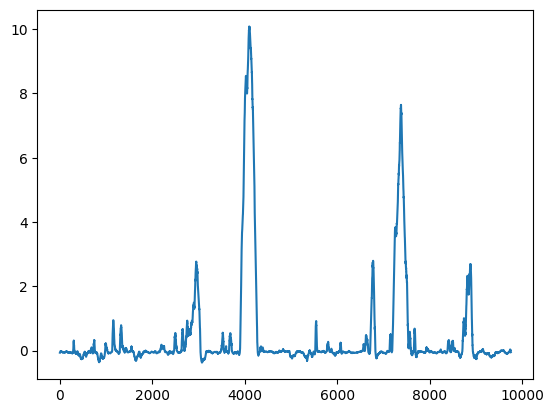

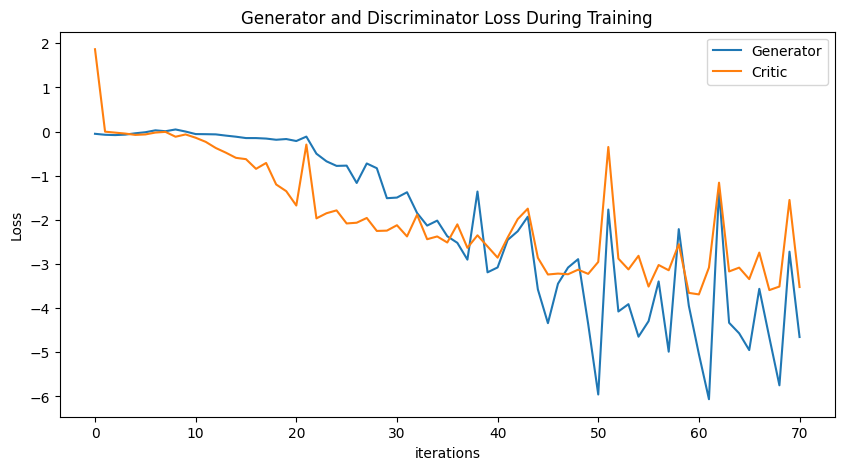

Epoch 80: Critic error ([1.8670490023177013, -0.0011635343583610708, -0.022591818454736505, -0.04394122148070038, -0.07417515127674305, -0.06382649857817027, -0.021131353768808786, -0.0055834868722011155, -0.11569126010264053, -0.0639238131087922, -0.1387394494900791, -0.23183352452242775, -0.37107405035641244, -0.4766790543402782, -0.593698791108505, -0.6238456886679771, -0.8434172362403132, -0.7101793445883509, -1.1974548918218553, -1.3492498262848973, -1.6743473269680886, -0.2934362209164081, -1.9655776086431649, -1.8493467936670087, -1.7846443367754132, -2.0806087501305486, -2.0642259705074206, -1.9565221643769344, -2.2503908688424787, -2.2433869537950764, -2.120958634464178, -2.374520956731704, -1.8837077597402967, -2.4379399366024597, -2.375210164383228, -2.5124790843367806, -2.1011522614800726, -2.6327407186478577, -2.349372330929965, -2.6018255620923236, -2.855409056624133, -2.3994716037525103, -1.9818085348679781, -1.744864478120983, -2.85846878274848, -3.2373329348116364, -3.

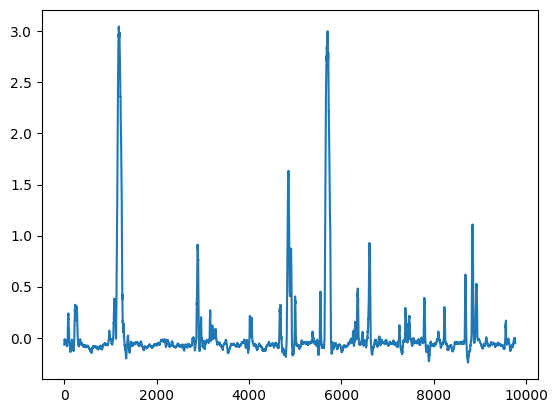

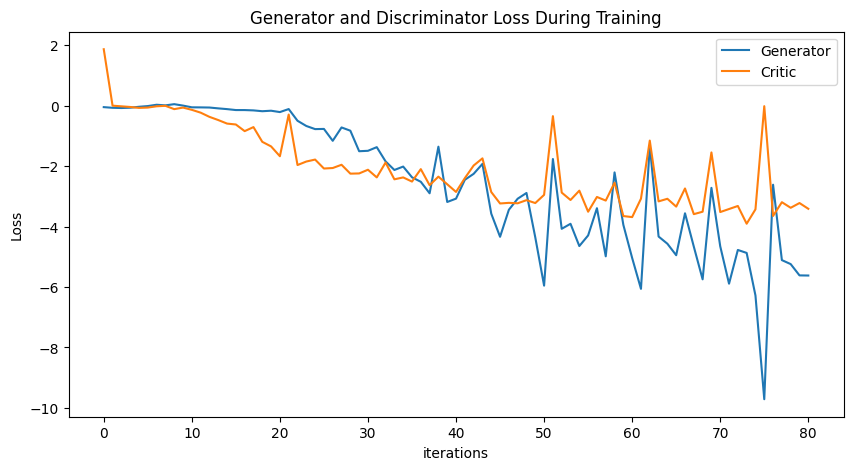

Epoch 90: Critic error ([1.8670490023177013, -0.0011635343583610708, -0.022591818454736505, -0.04394122148070038, -0.07417515127674305, -0.06382649857817027, -0.021131353768808786, -0.0055834868722011155, -0.11569126010264053, -0.0639238131087922, -0.1387394494900791, -0.23183352452242775, -0.37107405035641244, -0.4766790543402782, -0.593698791108505, -0.6238456886679771, -0.8434172362403132, -0.7101793445883509, -1.1974548918218553, -1.3492498262848973, -1.6743473269680886, -0.2934362209164081, -1.9655776086431649, -1.8493467936670087, -1.7846443367754132, -2.0806087501305486, -2.0642259705074206, -1.9565221643769344, -2.2503908688424787, -2.2433869537950764, -2.120958634464178, -2.374520956731704, -1.8837077597402967, -2.4379399366024597, -2.375210164383228, -2.5124790843367806, -2.1011522614800726, -2.6327407186478577, -2.349372330929965, -2.6018255620923236, -2.855409056624133, -2.3994716037525103, -1.9818085348679781, -1.744864478120983, -2.85846878274848, -3.2373329348116364, -3.

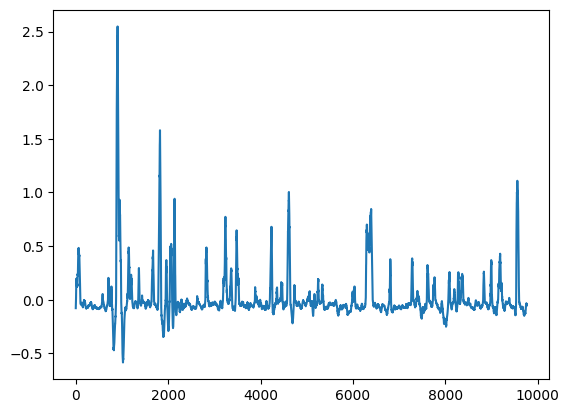

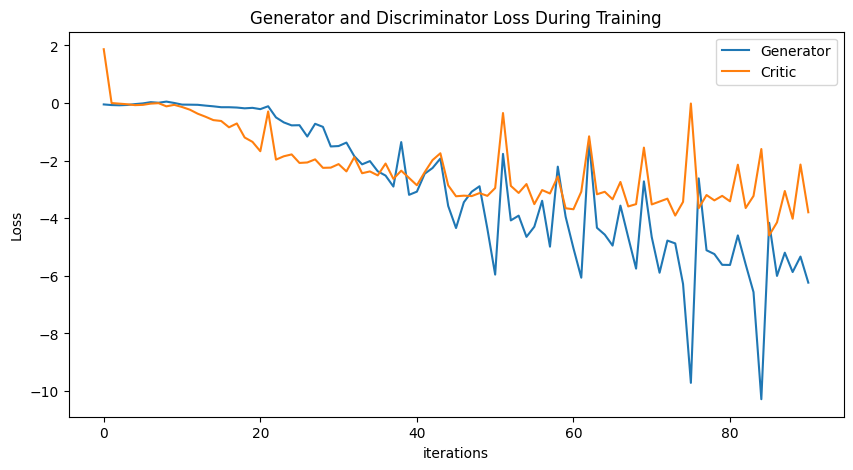

In [135]:
# baseline 

NUM_EPOCHS = 100
PRINT_INTERVAL = 10 # every 10 epoch, print status
BATCH_SIZE = np.shape(normalized_data_open)[0]
NUM_CHANNELS = 64
SEQUENCE_LENGTH = 9760
LAMBDA_GP = 5

training_data = torch.tensor(normalized_data_open)

def weights_init(model):
    for m in model.modules():
      if isinstance(m, (nn.Conv1d, nn.ConvTranspose1d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)

# Gaussian normal distribution
def sample_normal_distribution(i, j, k):
    mu = 0
    sigma = 0.02
    return torch.Tensor(np.random.normal(mu, sigma, (i, j, k)))

def gradient_penalty(D, real, fake):
    alpha = torch.rand((BATCH_SIZE, 1, 1)).repeat(1, NUM_CHANNELS, SEQUENCE_LENGTH)
    interpolated_seq = real * alpha + fake * (1 - alpha)

    # Calculate discriminator scores
    mixed_scores = D(interpolated_seq)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_seq,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            real = training_data.clone().detach()
            real.requires_grad=True
            noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
            fake = G(noise)
            critic_real = D(real).reshape(-1) # flatten
            critic_fake = D(fake).reshape(-1) # flatten
            gp = gradient_penalty(D, real, fake)
            critic_loss = -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
            D.zero_grad()
            critic_loss.backward(retain_graph=True)
            critic_optimizer.step()

        generated_data = fake
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()

        critic_err.append(critic_loss.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            values = generated_data[0, 0, :]
            plt.plot(values.tolist())
            plt.show()
            
            # plotting G vs D losses
            plt.figure(figsize=(10,5))
            plt.title("Generator and Discriminator Loss During Training")
            plt.plot(gen_err,label="Generator")
            plt.plot(critic_err,label="Critic")
            plt.xlabel("iterations")
            plt.ylabel("Loss")
            plt.legend()
            plt.show()

    return critic_err, gen_err, generated_data, D, G

critic_err_open, gen_err_open, generated_data_open_filtered, disc, gen = train()

torch.save(gen, 'gen_open_filtered.pt')
torch.save(disc, 'disc_open_filtered.pt')


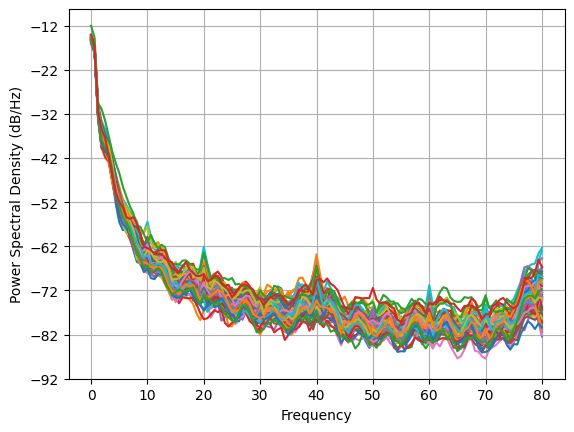

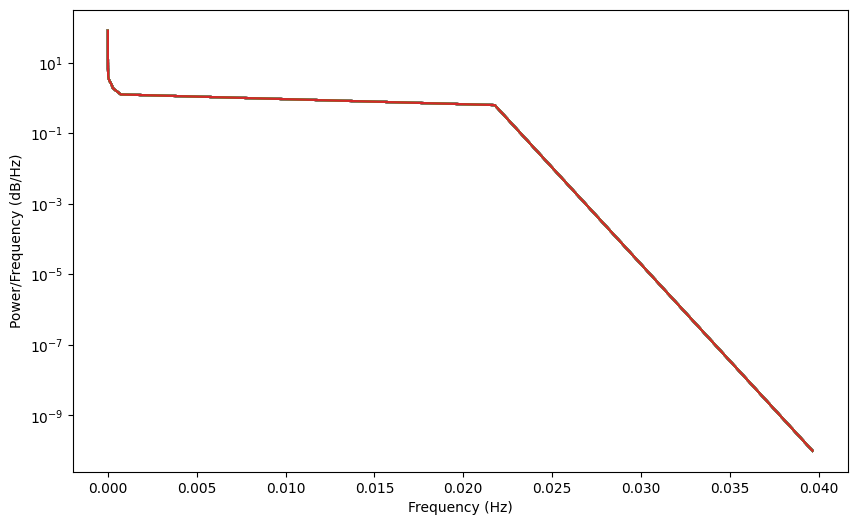

In [136]:
averaged_data = generated_data_open_filtered.detach().mean(dim=0)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()

Epoch 0: Critic error ([2.4146511326040065]) Generator err ([-0.05736660212278366])


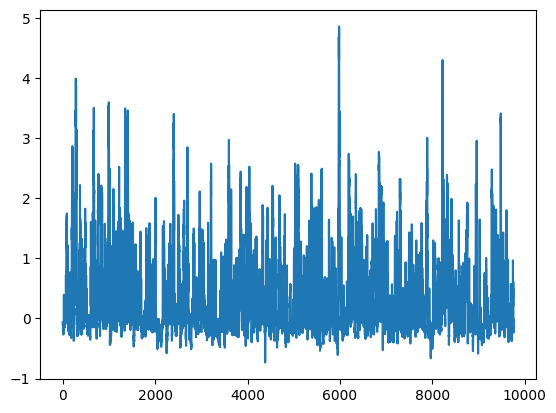

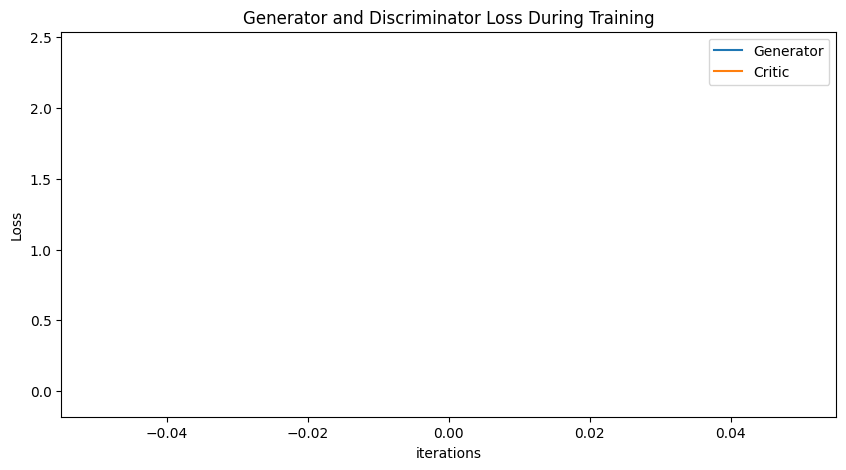

Epoch 10: Critic error ([2.4146511326040065, 1.0635375515208085, -0.07054742754087216, 0.055401764167866435, -0.06613833821074205, -0.06734996026402598, -0.21916532446383474, -0.25095622953878577, -0.2685888892699369, -0.28602379196944144, -0.5215915190506863]) Generator err ([-0.05736660212278366, -0.12338628619909286, 0.004752076230943203, -0.10752061754465103, 0.051718831062316895, 0.08988399803638458, 0.2954942584037781, 0.33140474557876587, 0.39220595359802246, 0.4572981894016266, 0.8588525652885437])


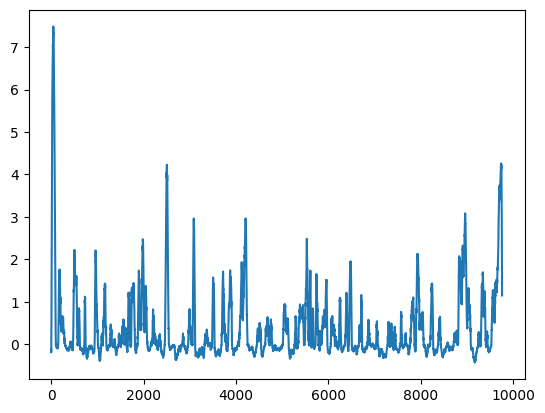

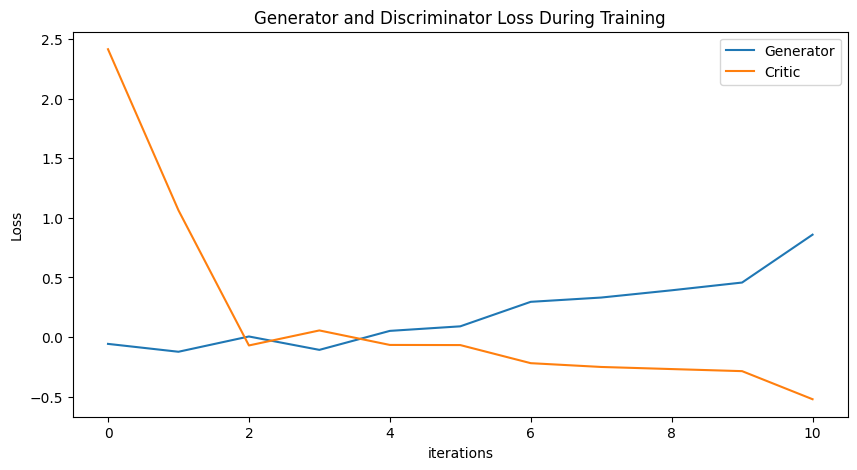

Epoch 20: Critic error ([2.4146511326040065, 1.0635375515208085, -0.07054742754087216, 0.055401764167866435, -0.06613833821074205, -0.06734996026402598, -0.21916532446383474, -0.25095622953878577, -0.2685888892699369, -0.28602379196944144, -0.5215915190506863, -0.7814334147669272, -1.1365300367804614, -1.171085511058637, -1.6795476908581741, -1.9422863675637434, -2.2369733660039266, -4.215421278741387, -2.819639591149724, -2.5900667933307715, -2.70195053961586]) Generator err ([-0.05736660212278366, -0.12338628619909286, 0.004752076230943203, -0.10752061754465103, 0.051718831062316895, 0.08988399803638458, 0.2954942584037781, 0.33140474557876587, 0.39220595359802246, 0.4572981894016266, 0.8588525652885437, 1.603623628616333, 1.7496232986450195, 2.9239251613616943, 3.0289011001586914, 2.748436689376831, 4.444642543792725, 5.337831020355225, 5.8884429931640625, 4.223156929016113, 3.997134208679199])


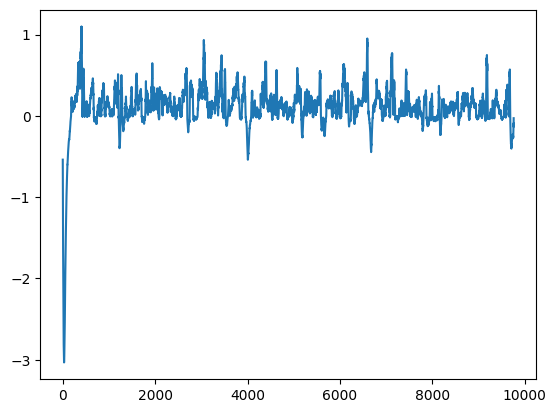

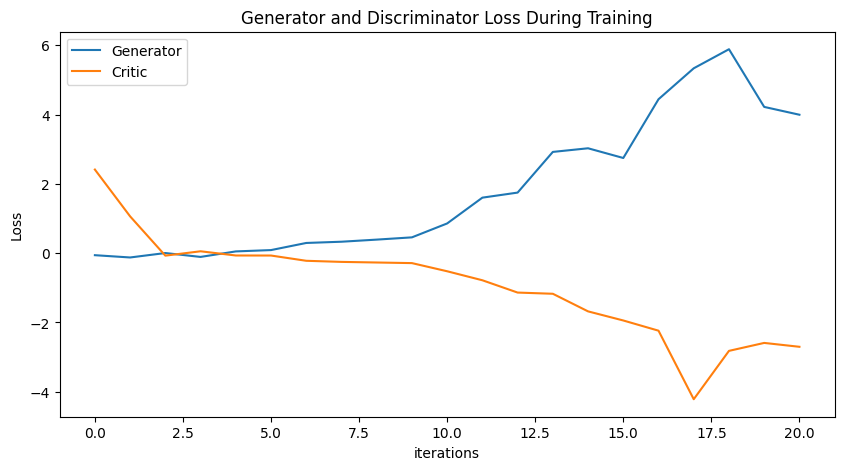

Epoch 30: Critic error ([2.4146511326040065, 1.0635375515208085, -0.07054742754087216, 0.055401764167866435, -0.06613833821074205, -0.06734996026402598, -0.21916532446383474, -0.25095622953878577, -0.2685888892699369, -0.28602379196944144, -0.5215915190506863, -0.7814334147669272, -1.1365300367804614, -1.171085511058637, -1.6795476908581741, -1.9422863675637434, -2.2369733660039266, -4.215421278741387, -2.819639591149724, -2.5900667933307715, -2.70195053961586, -2.1974632793631095, -2.813626881748279, -2.43679712220481, -2.272501049028862, -2.2902338949104024, -1.9614460221384167, -2.41733023091538, -2.3550355947399813, -2.511306434624745, -0.5229240519457922]) Generator err ([-0.05736660212278366, -0.12338628619909286, 0.004752076230943203, -0.10752061754465103, 0.051718831062316895, 0.08988399803638458, 0.2954942584037781, 0.33140474557876587, 0.39220595359802246, 0.4572981894016266, 0.8588525652885437, 1.603623628616333, 1.7496232986450195, 2.9239251613616943, 3.0289011001586914, 2.

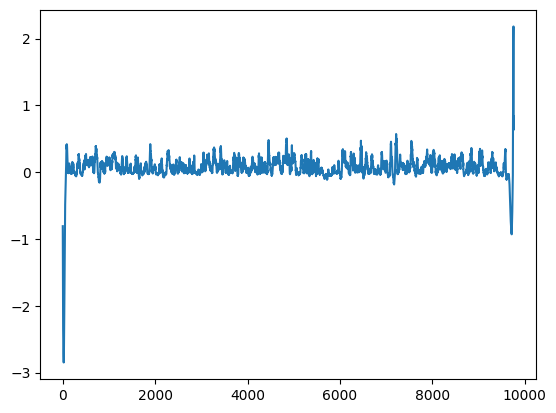

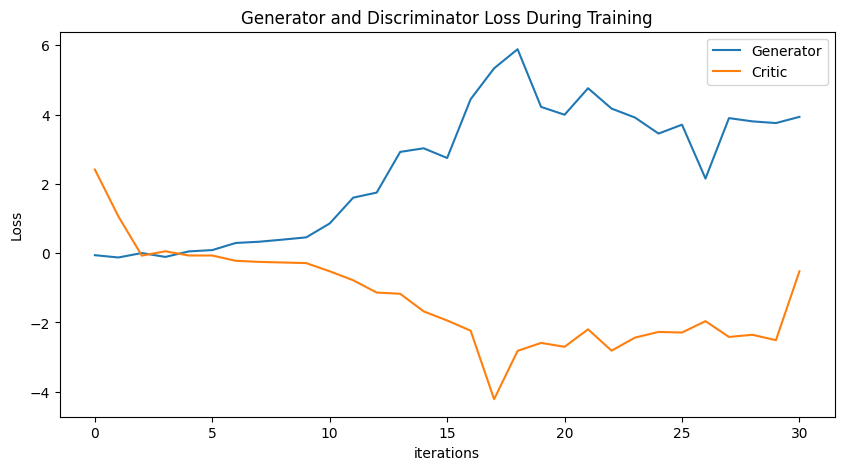

Epoch 40: Critic error ([2.4146511326040065, 1.0635375515208085, -0.07054742754087216, 0.055401764167866435, -0.06613833821074205, -0.06734996026402598, -0.21916532446383474, -0.25095622953878577, -0.2685888892699369, -0.28602379196944144, -0.5215915190506863, -0.7814334147669272, -1.1365300367804614, -1.171085511058637, -1.6795476908581741, -1.9422863675637434, -2.2369733660039266, -4.215421278741387, -2.819639591149724, -2.5900667933307715, -2.70195053961586, -2.1974632793631095, -2.813626881748279, -2.43679712220481, -2.272501049028862, -2.2902338949104024, -1.9614460221384167, -2.41733023091538, -2.3550355947399813, -2.511306434624745, -0.5229240519457922, -1.3168686445596756, -2.5541141993886507, -2.12269327623651, -2.5141373848496955, -2.4031220472012786, -2.4003182293419782, -2.6360871124676972, -1.9419469059576497, -2.6173509251343825, -2.1248813436672207]) Generator err ([-0.05736660212278366, -0.12338628619909286, 0.004752076230943203, -0.10752061754465103, 0.0517188310623168

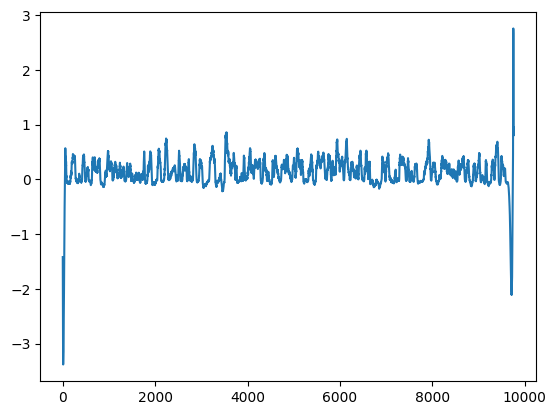

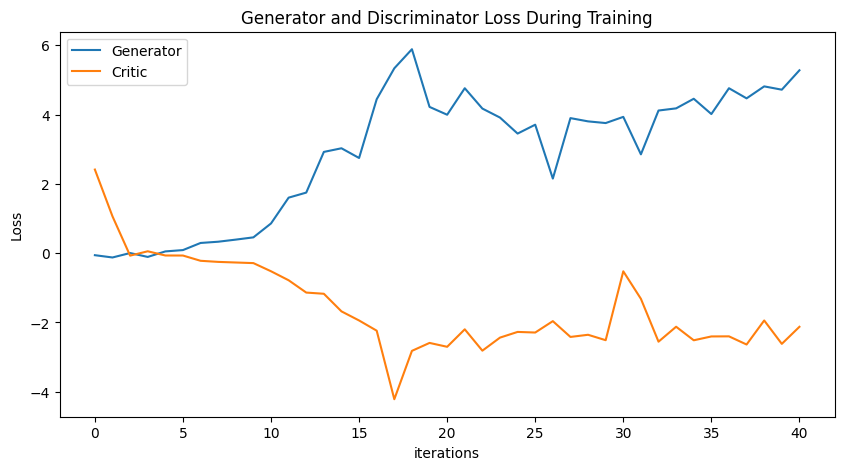

Epoch 50: Critic error ([2.4146511326040065, 1.0635375515208085, -0.07054742754087216, 0.055401764167866435, -0.06613833821074205, -0.06734996026402598, -0.21916532446383474, -0.25095622953878577, -0.2685888892699369, -0.28602379196944144, -0.5215915190506863, -0.7814334147669272, -1.1365300367804614, -1.171085511058637, -1.6795476908581741, -1.9422863675637434, -2.2369733660039266, -4.215421278741387, -2.819639591149724, -2.5900667933307715, -2.70195053961586, -2.1974632793631095, -2.813626881748279, -2.43679712220481, -2.272501049028862, -2.2902338949104024, -1.9614460221384167, -2.41733023091538, -2.3550355947399813, -2.511306434624745, -0.5229240519457922, -1.3168686445596756, -2.5541141993886507, -2.12269327623651, -2.5141373848496955, -2.4031220472012786, -2.4003182293419782, -2.6360871124676972, -1.9419469059576497, -2.6173509251343825, -2.1248813436672207, -2.4387916721455394, -2.542852558373771, -2.6046795462363956, -2.406404749951829, -2.885762220648459, -2.3264409411411355, 

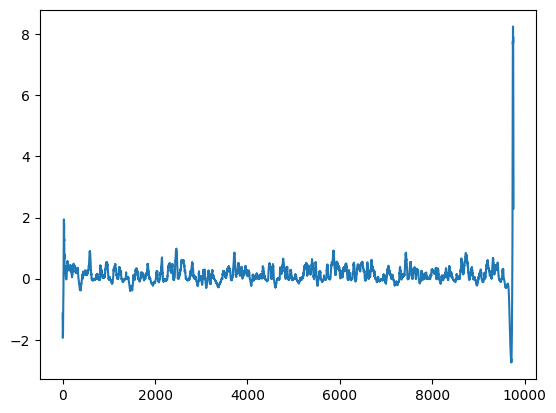

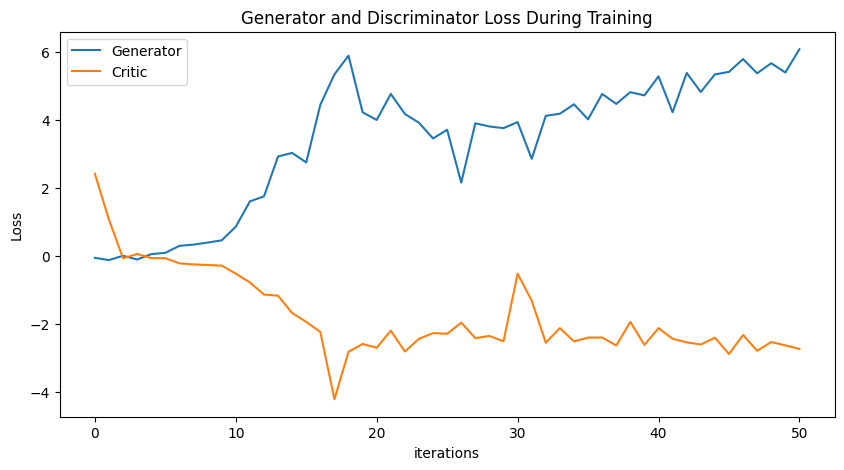

Epoch 60: Critic error ([2.4146511326040065, 1.0635375515208085, -0.07054742754087216, 0.055401764167866435, -0.06613833821074205, -0.06734996026402598, -0.21916532446383474, -0.25095622953878577, -0.2685888892699369, -0.28602379196944144, -0.5215915190506863, -0.7814334147669272, -1.1365300367804614, -1.171085511058637, -1.6795476908581741, -1.9422863675637434, -2.2369733660039266, -4.215421278741387, -2.819639591149724, -2.5900667933307715, -2.70195053961586, -2.1974632793631095, -2.813626881748279, -2.43679712220481, -2.272501049028862, -2.2902338949104024, -1.9614460221384167, -2.41733023091538, -2.3550355947399813, -2.511306434624745, -0.5229240519457922, -1.3168686445596756, -2.5541141993886507, -2.12269327623651, -2.5141373848496955, -2.4031220472012786, -2.4003182293419782, -2.6360871124676972, -1.9419469059576497, -2.6173509251343825, -2.1248813436672207, -2.4387916721455394, -2.542852558373771, -2.6046795462363956, -2.406404749951829, -2.885762220648459, -2.3264409411411355, 

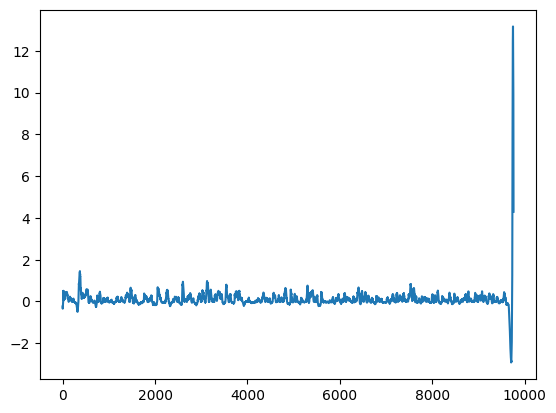

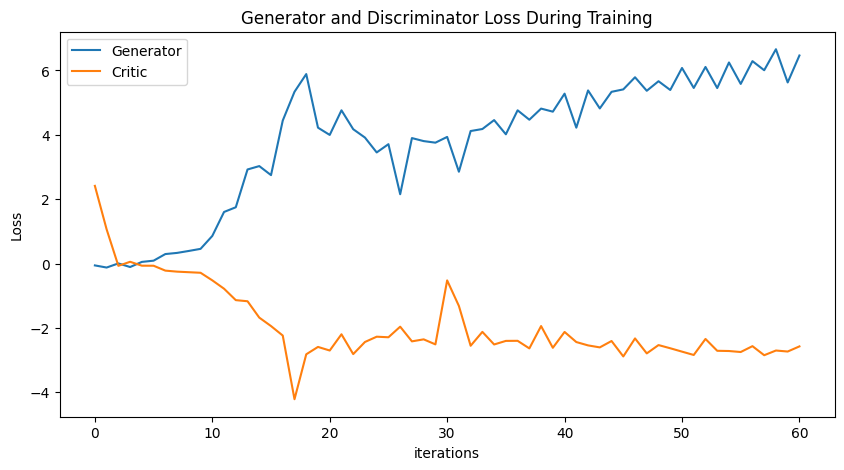

Epoch 70: Critic error ([2.4146511326040065, 1.0635375515208085, -0.07054742754087216, 0.055401764167866435, -0.06613833821074205, -0.06734996026402598, -0.21916532446383474, -0.25095622953878577, -0.2685888892699369, -0.28602379196944144, -0.5215915190506863, -0.7814334147669272, -1.1365300367804614, -1.171085511058637, -1.6795476908581741, -1.9422863675637434, -2.2369733660039266, -4.215421278741387, -2.819639591149724, -2.5900667933307715, -2.70195053961586, -2.1974632793631095, -2.813626881748279, -2.43679712220481, -2.272501049028862, -2.2902338949104024, -1.9614460221384167, -2.41733023091538, -2.3550355947399813, -2.511306434624745, -0.5229240519457922, -1.3168686445596756, -2.5541141993886507, -2.12269327623651, -2.5141373848496955, -2.4031220472012786, -2.4003182293419782, -2.6360871124676972, -1.9419469059576497, -2.6173509251343825, -2.1248813436672207, -2.4387916721455394, -2.542852558373771, -2.6046795462363956, -2.406404749951829, -2.885762220648459, -2.3264409411411355, 

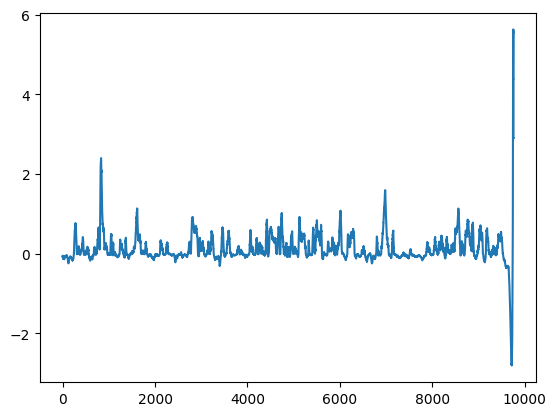

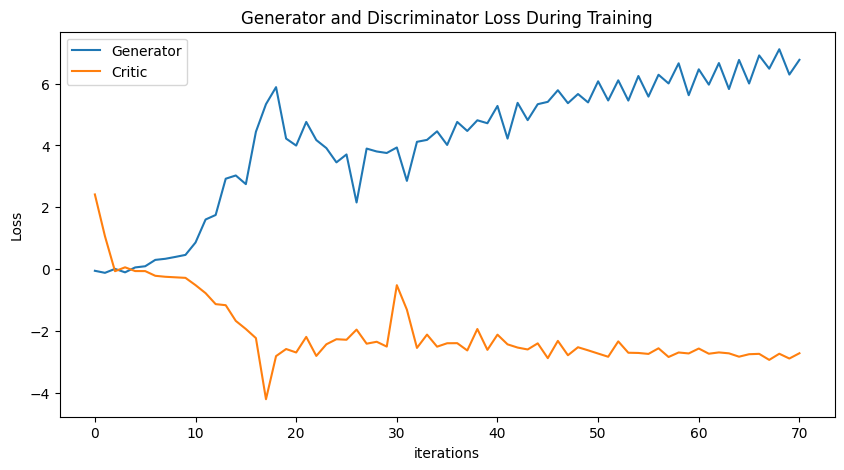

Epoch 80: Critic error ([2.4146511326040065, 1.0635375515208085, -0.07054742754087216, 0.055401764167866435, -0.06613833821074205, -0.06734996026402598, -0.21916532446383474, -0.25095622953878577, -0.2685888892699369, -0.28602379196944144, -0.5215915190506863, -0.7814334147669272, -1.1365300367804614, -1.171085511058637, -1.6795476908581741, -1.9422863675637434, -2.2369733660039266, -4.215421278741387, -2.819639591149724, -2.5900667933307715, -2.70195053961586, -2.1974632793631095, -2.813626881748279, -2.43679712220481, -2.272501049028862, -2.2902338949104024, -1.9614460221384167, -2.41733023091538, -2.3550355947399813, -2.511306434624745, -0.5229240519457922, -1.3168686445596756, -2.5541141993886507, -2.12269327623651, -2.5141373848496955, -2.4031220472012786, -2.4003182293419782, -2.6360871124676972, -1.9419469059576497, -2.6173509251343825, -2.1248813436672207, -2.4387916721455394, -2.542852558373771, -2.6046795462363956, -2.406404749951829, -2.885762220648459, -2.3264409411411355, 

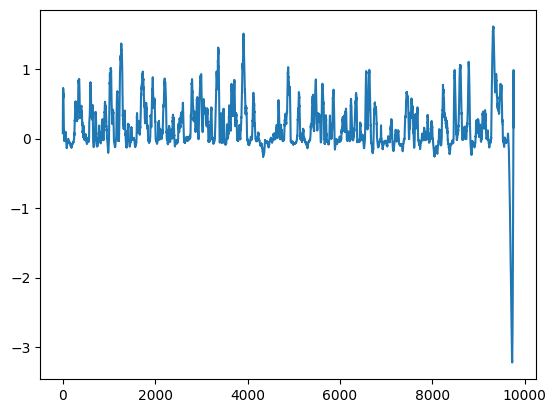

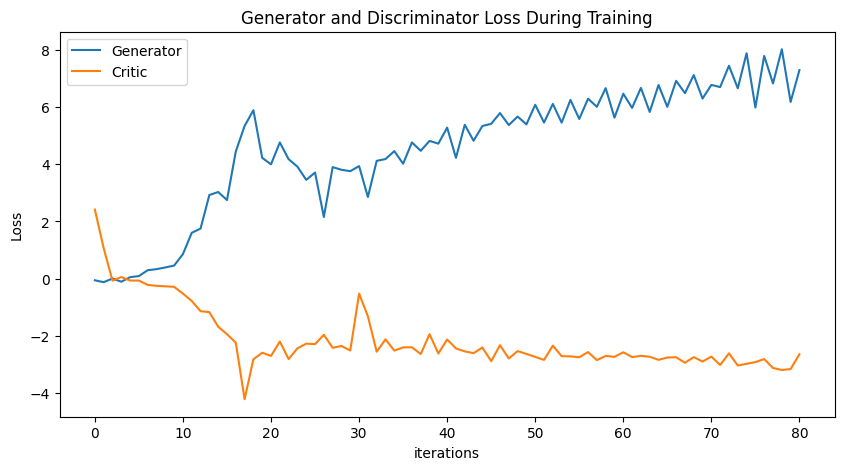

Epoch 90: Critic error ([2.4146511326040065, 1.0635375515208085, -0.07054742754087216, 0.055401764167866435, -0.06613833821074205, -0.06734996026402598, -0.21916532446383474, -0.25095622953878577, -0.2685888892699369, -0.28602379196944144, -0.5215915190506863, -0.7814334147669272, -1.1365300367804614, -1.171085511058637, -1.6795476908581741, -1.9422863675637434, -2.2369733660039266, -4.215421278741387, -2.819639591149724, -2.5900667933307715, -2.70195053961586, -2.1974632793631095, -2.813626881748279, -2.43679712220481, -2.272501049028862, -2.2902338949104024, -1.9614460221384167, -2.41733023091538, -2.3550355947399813, -2.511306434624745, -0.5229240519457922, -1.3168686445596756, -2.5541141993886507, -2.12269327623651, -2.5141373848496955, -2.4031220472012786, -2.4003182293419782, -2.6360871124676972, -1.9419469059576497, -2.6173509251343825, -2.1248813436672207, -2.4387916721455394, -2.542852558373771, -2.6046795462363956, -2.406404749951829, -2.885762220648459, -2.3264409411411355, 

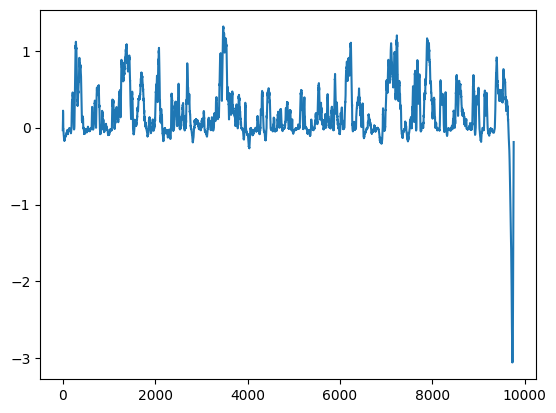

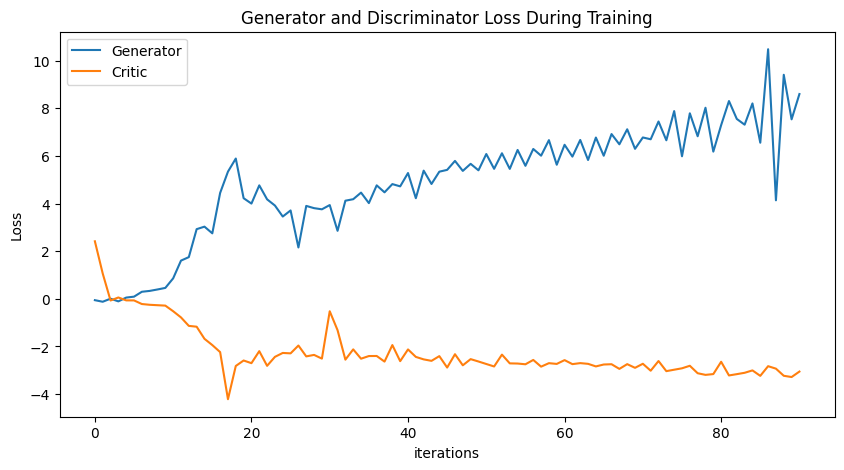

In [137]:
# baseline 

NUM_EPOCHS = 100
PRINT_INTERVAL = 10 # every 10 epoch, print status
BATCH_SIZE = np.shape(normalized_data_closed)[0]
NUM_CHANNELS = 64
SEQUENCE_LENGTH = 9760
LAMBDA_GP = 5

training_data = torch.tensor(normalized_data_closed)

def weights_init(model):
    for m in model.modules():
      if isinstance(m, (nn.Conv1d, nn.ConvTranspose1d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)

# Gaussian normal distribution
def sample_normal_distribution(i, j, k):
    mu = 0
    sigma = 0.02
    return torch.Tensor(np.random.normal(mu, sigma, (i, j, k)))

def gradient_penalty(D, real, fake):
    alpha = torch.rand((BATCH_SIZE, 1, 1)).repeat(1, NUM_CHANNELS, SEQUENCE_LENGTH)
    interpolated_seq = real * alpha + fake * (1 - alpha)

    # Calculate discriminator scores
    mixed_scores = D(interpolated_seq)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_seq,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            real = training_data.clone().detach()
            real.requires_grad=True
            noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
            fake = G(noise)
            critic_real = D(real).reshape(-1) # flatten
            critic_fake = D(fake).reshape(-1) # flatten
            gp = gradient_penalty(D, real, fake)
            critic_loss = -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
            D.zero_grad()
            critic_loss.backward(retain_graph=True)
            critic_optimizer.step()

        generated_data = fake
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()

        critic_err.append(critic_loss.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            values = generated_data[0, 0, :]
            plt.plot(values.tolist())
            plt.show()
            
            # plotting G vs D losses
            plt.figure(figsize=(10,5))
            plt.title("Generator and Discriminator Loss During Training")
            plt.plot(gen_err,label="Generator")
            plt.plot(critic_err,label="Critic")
            plt.xlabel("iterations")
            plt.ylabel("Loss")
            plt.legend()
            plt.show()

    return critic_err, gen_err, generated_data, D, G

critic_err_closed, gen_err_closed, generated_data_closed_filtered, disc, gen = train()

torch.save(gen, 'gen_closed_filtered.pt')
torch.save(disc, 'disc_closed_filtered.pt')


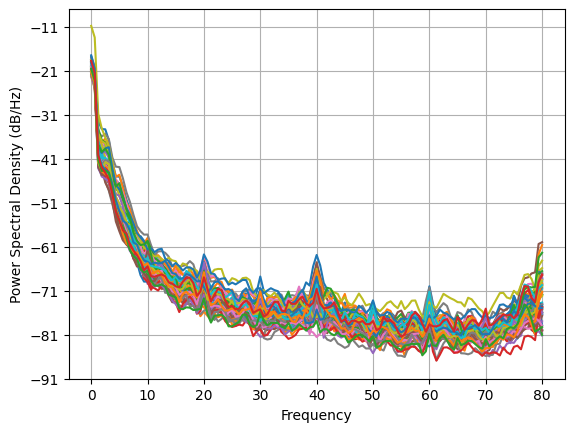

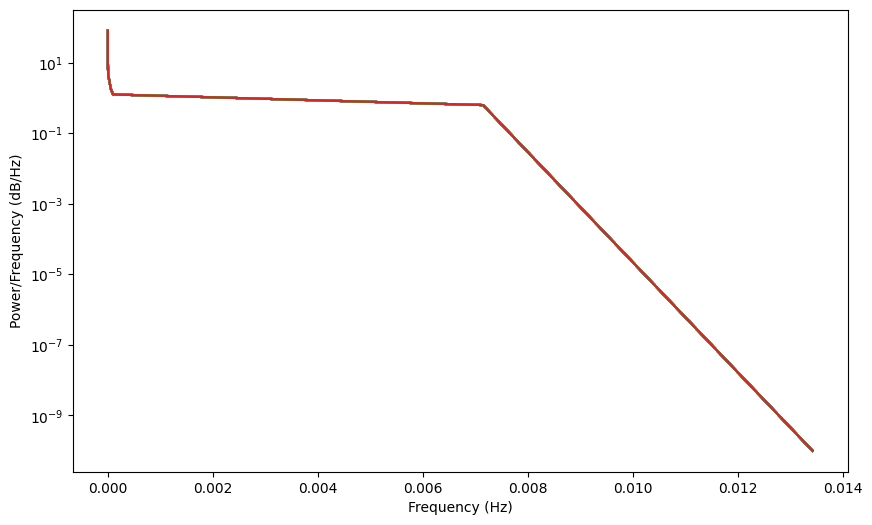

In [138]:
averaged_data = generated_data_closed_filtered.detach().mean(dim=0)
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()

# Normalized and high LR

Epoch 0: Critic error ([94425.92207424289]) Generator err ([3.904390573501587])


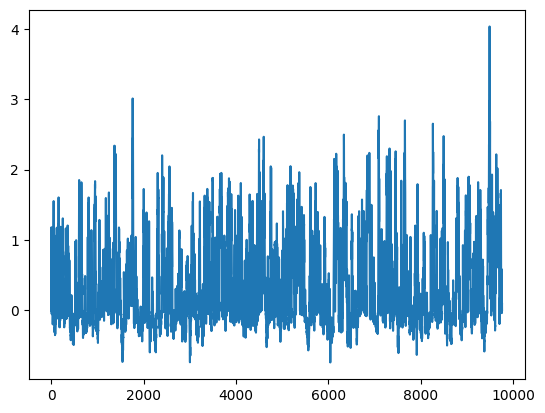

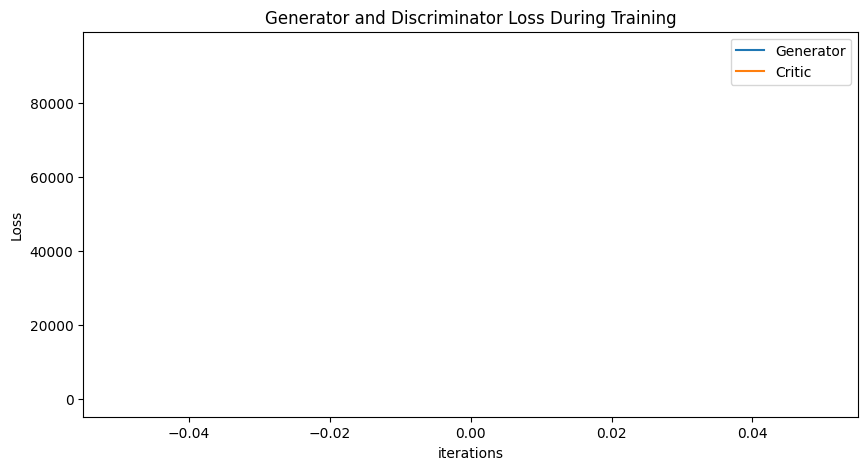

Epoch 10: Critic error ([94425.92207424289, 16.387053859383872, 17.530673875795415, 14.304203592062004, 12.241593023559782, 11.086807174285486, 9.469388265816153, 8.329383827027126, 7.952648448188644, 7.665964103628751, 7.00837108379408]) Generator err ([3.904390573501587, -0.3424505591392517, -0.6272765398025513, -0.5898137092590332, -0.5981549024581909, -0.5749285221099854, -0.4660978317260742, -0.5037404298782349, -0.6010949015617371, -0.5136280059814453, -0.6304188370704651])


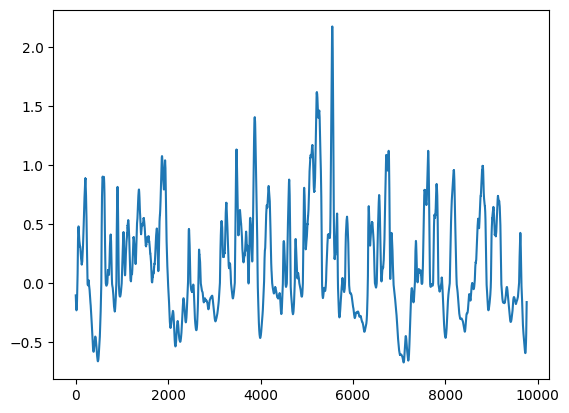

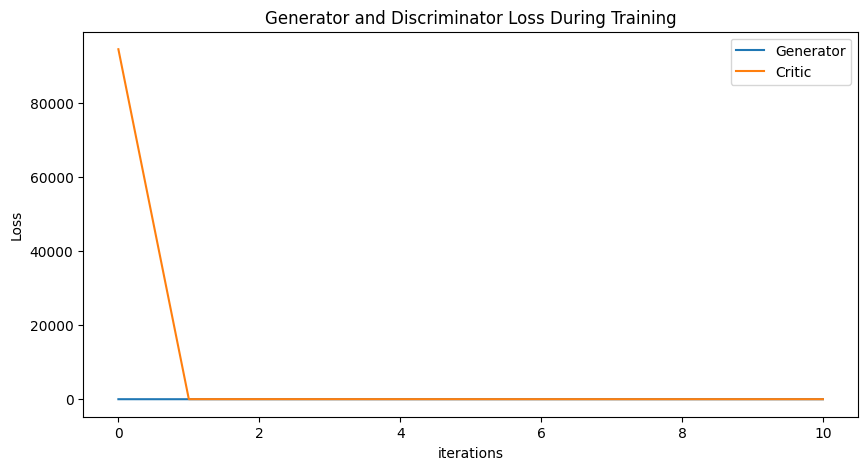

Epoch 20: Critic error ([94425.92207424289, 16.387053859383872, 17.530673875795415, 14.304203592062004, 12.241593023559782, 11.086807174285486, 9.469388265816153, 8.329383827027126, 7.952648448188644, 7.665964103628751, 7.00837108379408, 6.134188083699983, 5.6681058741630785, 5.098220573719189, 4.736815709422022, 3.788624872472332, 4.031652208187896, 4.102871343705157, 3.8992376752740276, 4.159101260909637, 3.8305556116713504]) Generator err ([3.904390573501587, -0.3424505591392517, -0.6272765398025513, -0.5898137092590332, -0.5981549024581909, -0.5749285221099854, -0.4660978317260742, -0.5037404298782349, -0.6010949015617371, -0.5136280059814453, -0.6304188370704651, -0.5559126734733582, -0.6424440145492554, -0.5236536264419556, -0.5215295553207397, -0.5426912903785706, -0.6168344616889954, -0.6136094331741333, -0.6851505637168884, -0.7180706262588501, -0.6187542080879211])


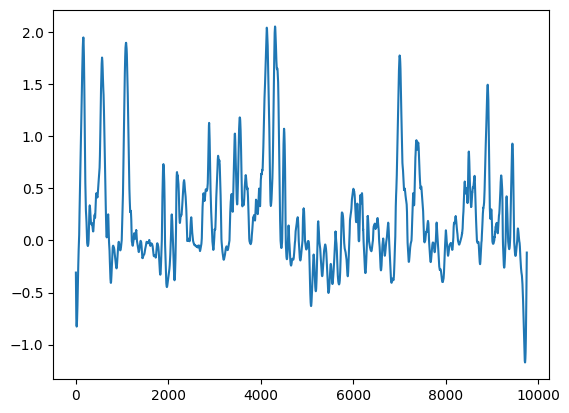

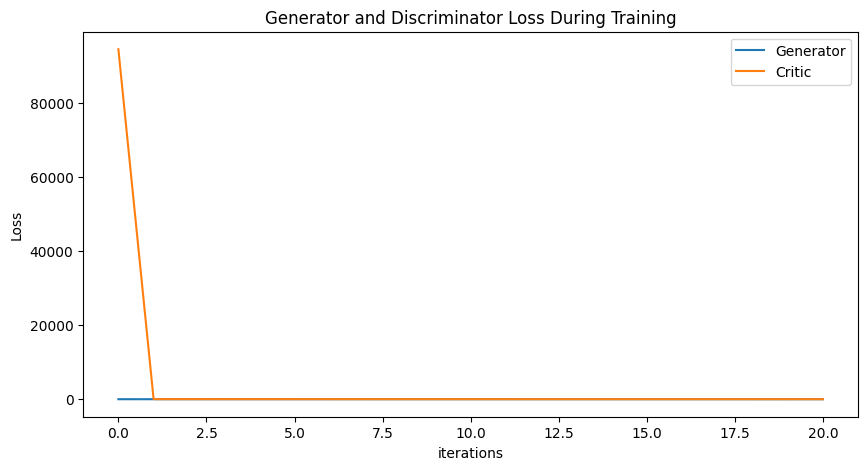

Epoch 30: Critic error ([94425.92207424289, 16.387053859383872, 17.530673875795415, 14.304203592062004, 12.241593023559782, 11.086807174285486, 9.469388265816153, 8.329383827027126, 7.952648448188644, 7.665964103628751, 7.00837108379408, 6.134188083699983, 5.6681058741630785, 5.098220573719189, 4.736815709422022, 3.788624872472332, 4.031652208187896, 4.102871343705157, 3.8992376752740276, 4.159101260909637, 3.8305556116713504, 4.1779735445711745, 4.3601772594661945, 3.268627347316397, 4.584327355721054, 5.291397071076456, 5.658643596754962, 5.505054872226547, 5.836737052937206, 5.768289047759088, 5.7005510832301285]) Generator err ([3.904390573501587, -0.3424505591392517, -0.6272765398025513, -0.5898137092590332, -0.5981549024581909, -0.5749285221099854, -0.4660978317260742, -0.5037404298782349, -0.6010949015617371, -0.5136280059814453, -0.6304188370704651, -0.5559126734733582, -0.6424440145492554, -0.5236536264419556, -0.5215295553207397, -0.5426912903785706, -0.6168344616889954, -0.6

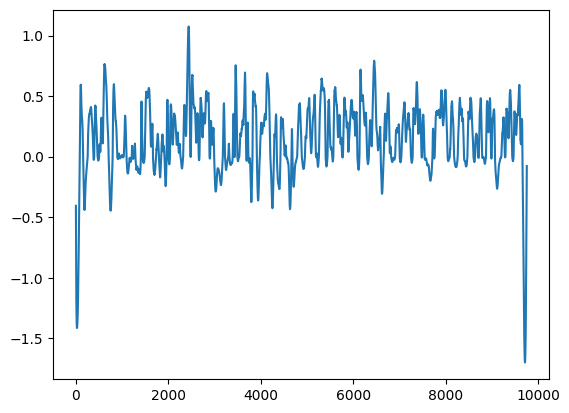

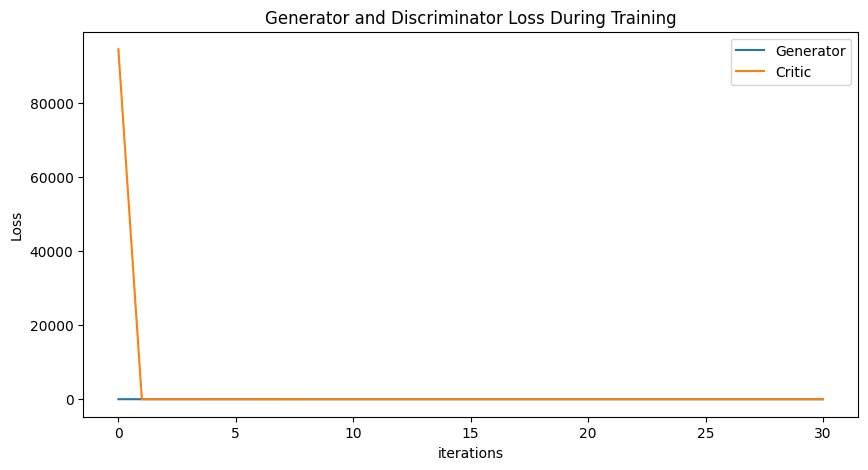

Epoch 40: Critic error ([94425.92207424289, 16.387053859383872, 17.530673875795415, 14.304203592062004, 12.241593023559782, 11.086807174285486, 9.469388265816153, 8.329383827027126, 7.952648448188644, 7.665964103628751, 7.00837108379408, 6.134188083699983, 5.6681058741630785, 5.098220573719189, 4.736815709422022, 3.788624872472332, 4.031652208187896, 4.102871343705157, 3.8992376752740276, 4.159101260909637, 3.8305556116713504, 4.1779735445711745, 4.3601772594661945, 3.268627347316397, 4.584327355721054, 5.291397071076456, 5.658643596754962, 5.505054872226547, 5.836737052937206, 5.768289047759088, 5.7005510832301285, 5.457958872697628, 5.842501014416921, 4.808706008595843, 5.46094287356849, 5.762486100893351, 6.653998410467569, 7.535310965682273, 6.164040591997038, 7.08006884264857, 6.531242846982813]) Generator err ([3.904390573501587, -0.3424505591392517, -0.6272765398025513, -0.5898137092590332, -0.5981549024581909, -0.5749285221099854, -0.4660978317260742, -0.5037404298782349, -0.60

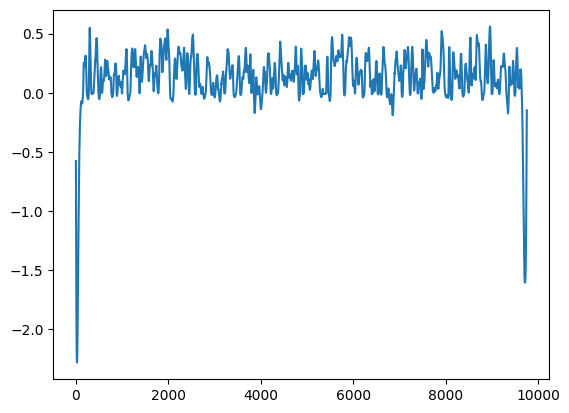

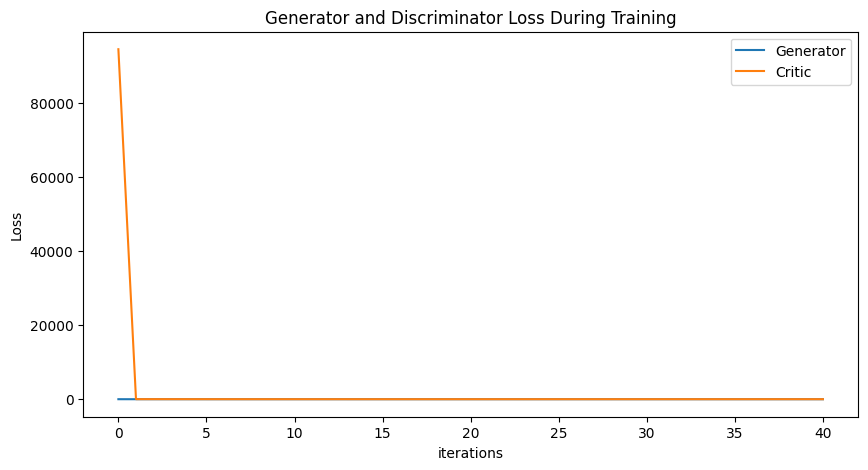

Epoch 50: Critic error ([94425.92207424289, 16.387053859383872, 17.530673875795415, 14.304203592062004, 12.241593023559782, 11.086807174285486, 9.469388265816153, 8.329383827027126, 7.952648448188644, 7.665964103628751, 7.00837108379408, 6.134188083699983, 5.6681058741630785, 5.098220573719189, 4.736815709422022, 3.788624872472332, 4.031652208187896, 4.102871343705157, 3.8992376752740276, 4.159101260909637, 3.8305556116713504, 4.1779735445711745, 4.3601772594661945, 3.268627347316397, 4.584327355721054, 5.291397071076456, 5.658643596754962, 5.505054872226547, 5.836737052937206, 5.768289047759088, 5.7005510832301285, 5.457958872697628, 5.842501014416921, 4.808706008595843, 5.46094287356849, 5.762486100893351, 6.653998410467569, 7.535310965682273, 6.164040591997038, 7.08006884264857, 6.531242846982813, 6.390894916931252, 5.867893568886604, 5.271196845413097, 5.412781050308851, 4.445698348327243, 4.600815295617778, 5.025773454591478, 3.8426661962116353, 4.029320727177475, 3.69123115507999

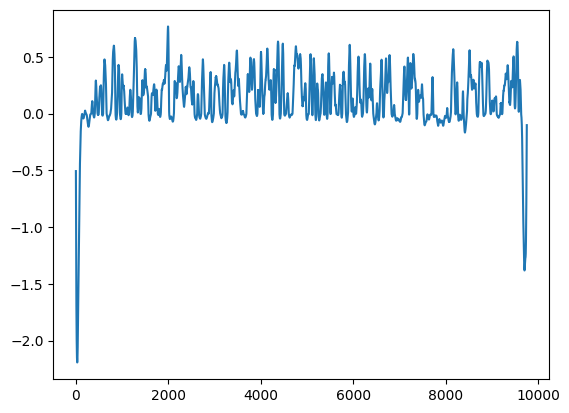

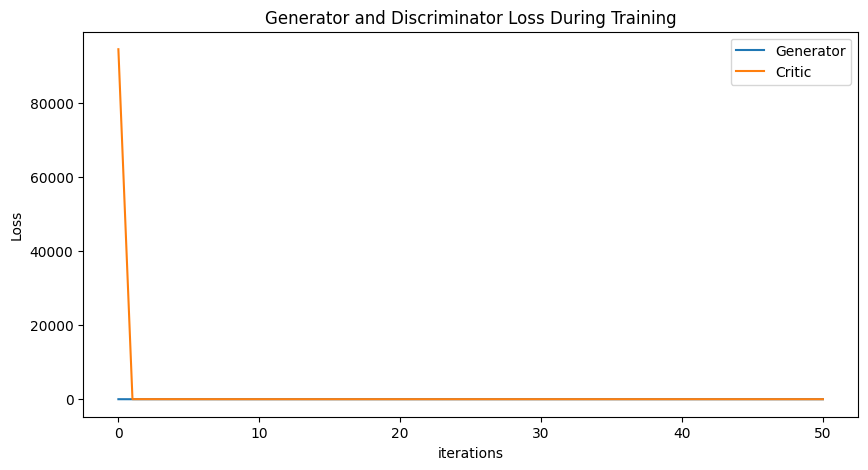

Epoch 60: Critic error ([94425.92207424289, 16.387053859383872, 17.530673875795415, 14.304203592062004, 12.241593023559782, 11.086807174285486, 9.469388265816153, 8.329383827027126, 7.952648448188644, 7.665964103628751, 7.00837108379408, 6.134188083699983, 5.6681058741630785, 5.098220573719189, 4.736815709422022, 3.788624872472332, 4.031652208187896, 4.102871343705157, 3.8992376752740276, 4.159101260909637, 3.8305556116713504, 4.1779735445711745, 4.3601772594661945, 3.268627347316397, 4.584327355721054, 5.291397071076456, 5.658643596754962, 5.505054872226547, 5.836737052937206, 5.768289047759088, 5.7005510832301285, 5.457958872697628, 5.842501014416921, 4.808706008595843, 5.46094287356849, 5.762486100893351, 6.653998410467569, 7.535310965682273, 6.164040591997038, 7.08006884264857, 6.531242846982813, 6.390894916931252, 5.867893568886604, 5.271196845413097, 5.412781050308851, 4.445698348327243, 4.600815295617778, 5.025773454591478, 3.8426661962116353, 4.029320727177475, 3.69123115507999

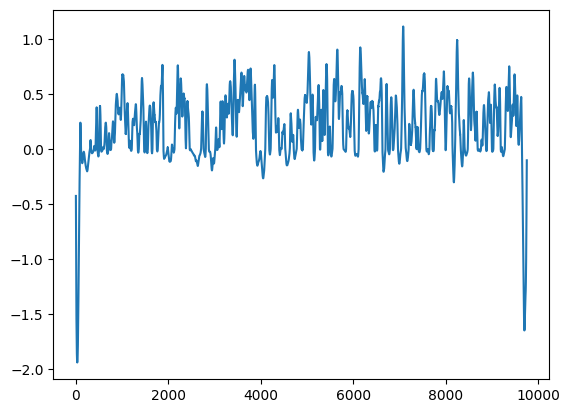

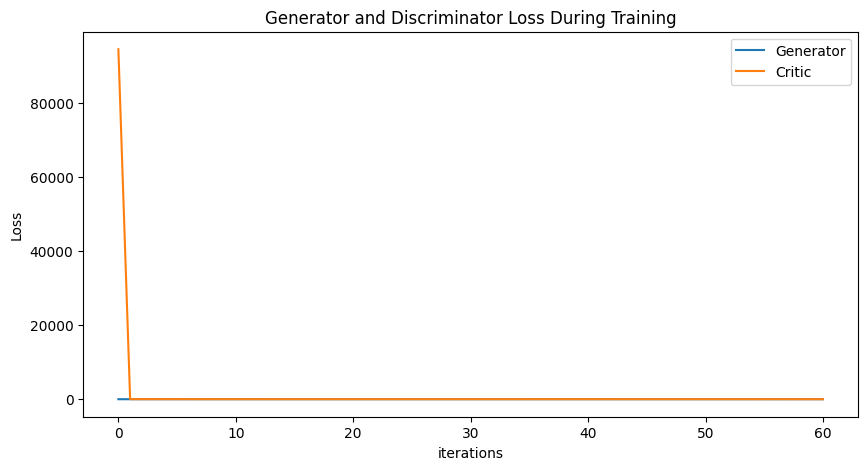

Epoch 70: Critic error ([94425.92207424289, 16.387053859383872, 17.530673875795415, 14.304203592062004, 12.241593023559782, 11.086807174285486, 9.469388265816153, 8.329383827027126, 7.952648448188644, 7.665964103628751, 7.00837108379408, 6.134188083699983, 5.6681058741630785, 5.098220573719189, 4.736815709422022, 3.788624872472332, 4.031652208187896, 4.102871343705157, 3.8992376752740276, 4.159101260909637, 3.8305556116713504, 4.1779735445711745, 4.3601772594661945, 3.268627347316397, 4.584327355721054, 5.291397071076456, 5.658643596754962, 5.505054872226547, 5.836737052937206, 5.768289047759088, 5.7005510832301285, 5.457958872697628, 5.842501014416921, 4.808706008595843, 5.46094287356849, 5.762486100893351, 6.653998410467569, 7.535310965682273, 6.164040591997038, 7.08006884264857, 6.531242846982813, 6.390894916931252, 5.867893568886604, 5.271196845413097, 5.412781050308851, 4.445698348327243, 4.600815295617778, 5.025773454591478, 3.8426661962116353, 4.029320727177475, 3.69123115507999

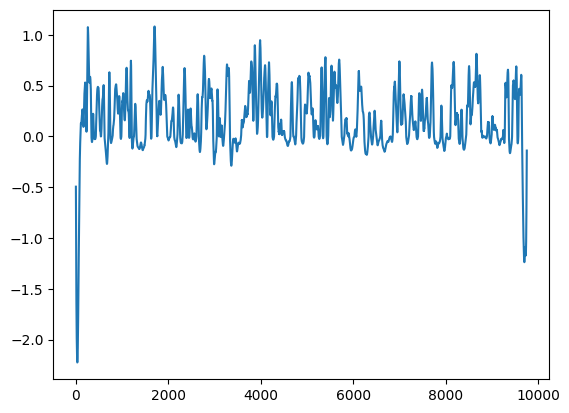

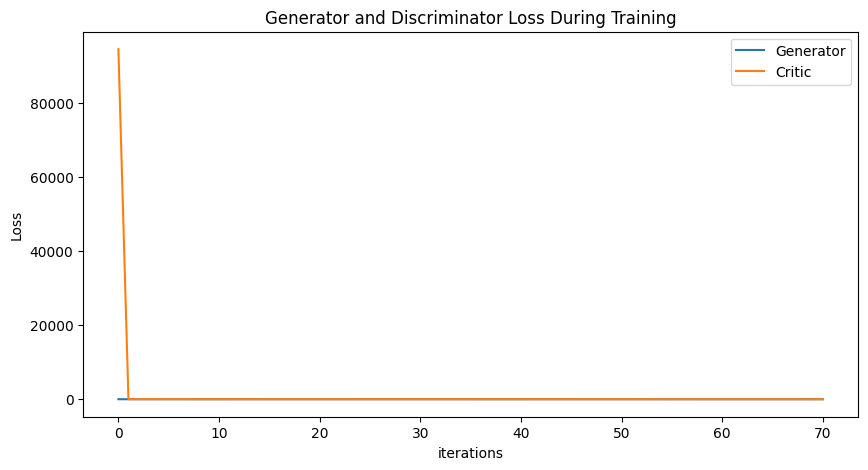

Epoch 80: Critic error ([94425.92207424289, 16.387053859383872, 17.530673875795415, 14.304203592062004, 12.241593023559782, 11.086807174285486, 9.469388265816153, 8.329383827027126, 7.952648448188644, 7.665964103628751, 7.00837108379408, 6.134188083699983, 5.6681058741630785, 5.098220573719189, 4.736815709422022, 3.788624872472332, 4.031652208187896, 4.102871343705157, 3.8992376752740276, 4.159101260909637, 3.8305556116713504, 4.1779735445711745, 4.3601772594661945, 3.268627347316397, 4.584327355721054, 5.291397071076456, 5.658643596754962, 5.505054872226547, 5.836737052937206, 5.768289047759088, 5.7005510832301285, 5.457958872697628, 5.842501014416921, 4.808706008595843, 5.46094287356849, 5.762486100893351, 6.653998410467569, 7.535310965682273, 6.164040591997038, 7.08006884264857, 6.531242846982813, 6.390894916931252, 5.867893568886604, 5.271196845413097, 5.412781050308851, 4.445698348327243, 4.600815295617778, 5.025773454591478, 3.8426661962116353, 4.029320727177475, 3.69123115507999

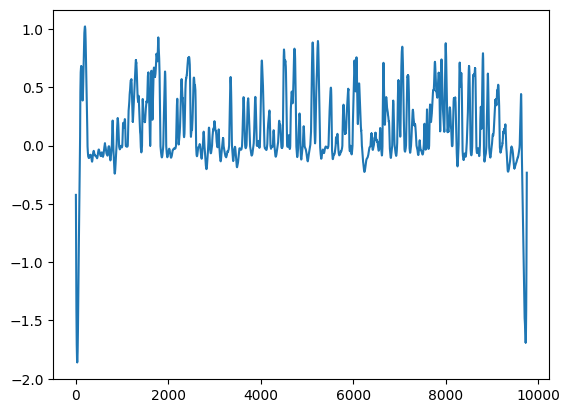

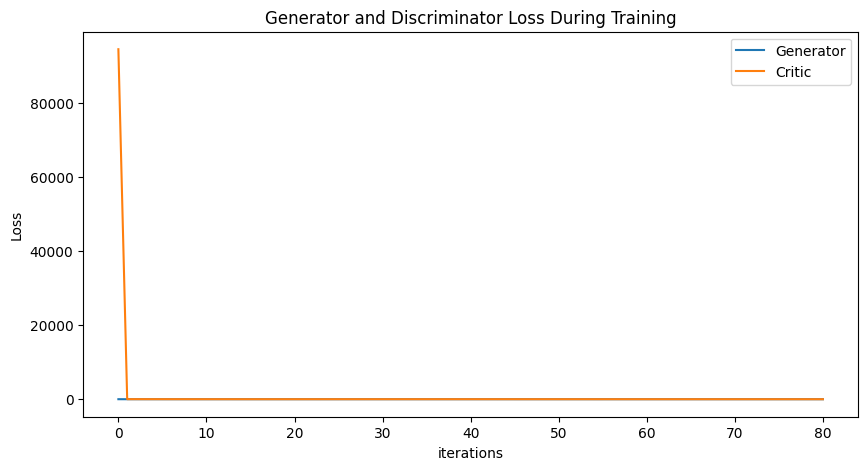

Epoch 90: Critic error ([94425.92207424289, 16.387053859383872, 17.530673875795415, 14.304203592062004, 12.241593023559782, 11.086807174285486, 9.469388265816153, 8.329383827027126, 7.952648448188644, 7.665964103628751, 7.00837108379408, 6.134188083699983, 5.6681058741630785, 5.098220573719189, 4.736815709422022, 3.788624872472332, 4.031652208187896, 4.102871343705157, 3.8992376752740276, 4.159101260909637, 3.8305556116713504, 4.1779735445711745, 4.3601772594661945, 3.268627347316397, 4.584327355721054, 5.291397071076456, 5.658643596754962, 5.505054872226547, 5.836737052937206, 5.768289047759088, 5.7005510832301285, 5.457958872697628, 5.842501014416921, 4.808706008595843, 5.46094287356849, 5.762486100893351, 6.653998410467569, 7.535310965682273, 6.164040591997038, 7.08006884264857, 6.531242846982813, 6.390894916931252, 5.867893568886604, 5.271196845413097, 5.412781050308851, 4.445698348327243, 4.600815295617778, 5.025773454591478, 3.8426661962116353, 4.029320727177475, 3.69123115507999

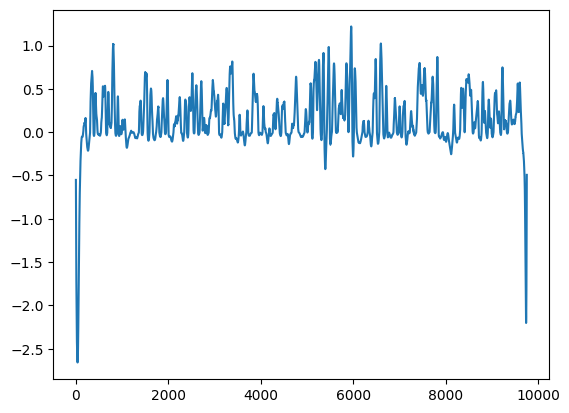

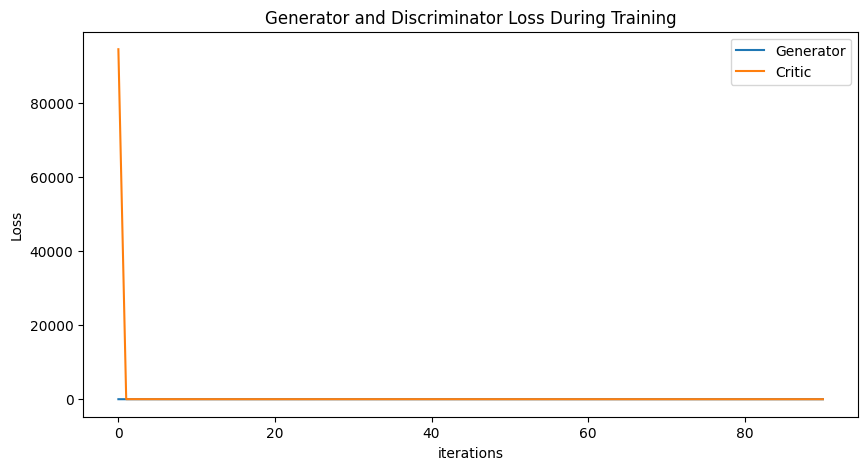

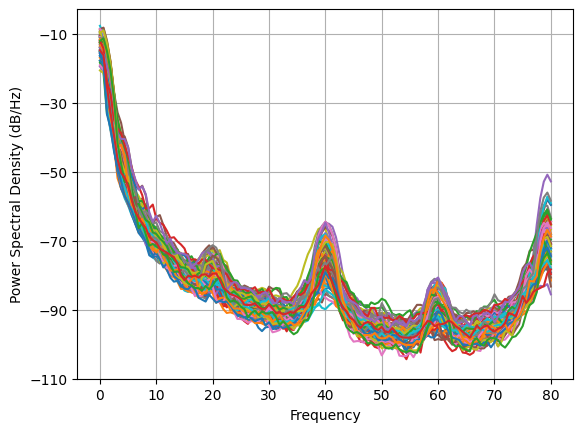

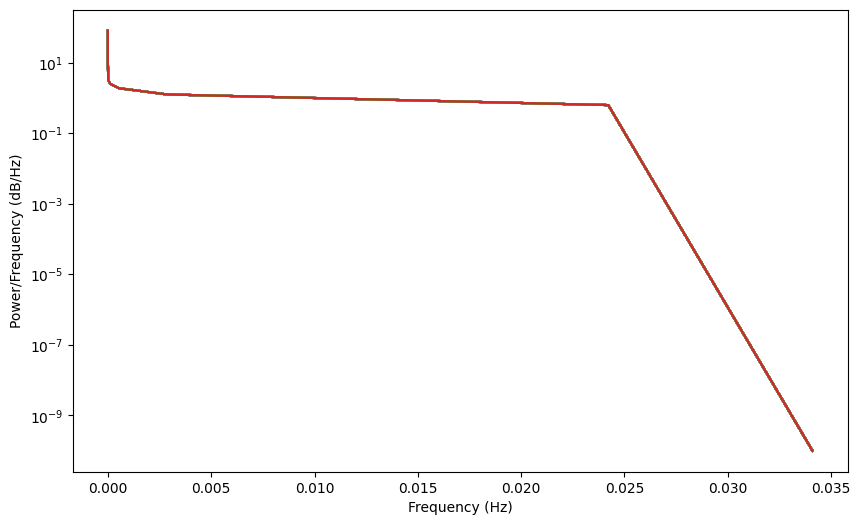

In [139]:
# baseline 

NUM_EPOCHS = 100
PRINT_INTERVAL = 10 # every 10 epoch, print status
BATCH_SIZE = np.shape(normalized_data_open)[0]
NUM_CHANNELS = 64
SEQUENCE_LENGTH = 9760
LAMBDA_GP = 5

training_data = torch.tensor(normalized_data_open)

def weights_init(model):
    for m in model.modules():
      if isinstance(m, (nn.Conv1d, nn.ConvTranspose1d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)

# Gaussian normal distribution
def sample_normal_distribution(i, j, k):
    mu = 0
    sigma = 0.02
    return torch.Tensor(np.random.normal(mu, sigma, (i, j, k)))

def gradient_penalty(D, real, fake):
    alpha = torch.rand((BATCH_SIZE, 1, 1)).repeat(1, NUM_CHANNELS, SEQUENCE_LENGTH)
    interpolated_seq = real * alpha + fake * (1 - alpha)

    # Calculate discriminator scores
    mixed_scores = D(interpolated_seq)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_seq,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-3)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-3)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            real = training_data.clone().detach()
            real.requires_grad=True
            noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
            fake = G(noise)
            critic_real = D(real).reshape(-1) # flatten
            critic_fake = D(fake).reshape(-1) # flatten
            gp = gradient_penalty(D, real, fake)
            critic_loss = -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
            D.zero_grad()
            critic_loss.backward(retain_graph=True)
            critic_optimizer.step()

        generated_data = fake
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()

        critic_err.append(critic_loss.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            values = generated_data[0, 0, :]
            plt.plot(values.tolist())
            plt.show()
            
            # plotting G vs D losses
            plt.figure(figsize=(10,5))
            plt.title("Generator and Discriminator Loss During Training")
            plt.plot(gen_err,label="Generator")
            plt.plot(critic_err,label="Critic")
            plt.xlabel("iterations")
            plt.ylabel("Loss")
            plt.legend()
            plt.show()

    return critic_err, gen_err, generated_data, D, G

critic_err_open, gen_err_open, generated_data_open_filtered, disc, gen = train()

torch.save(gen, 'gen_open_filtered.pt')
torch.save(disc, 'disc_open_filtered.pt')

averaged_data = generated_data_open_filtered.detach().mean(dim=0)
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()

Epoch 0: Critic error ([1868.52258719174]) Generator err ([0.10074997693300247])


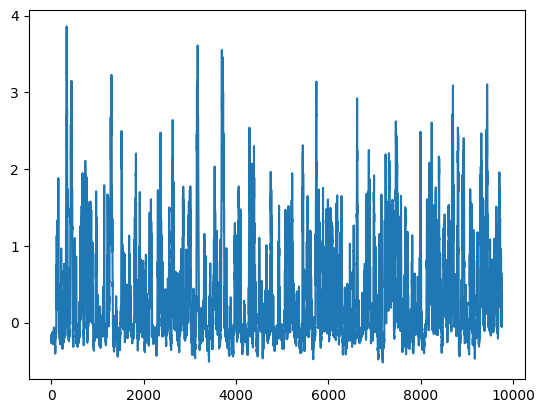

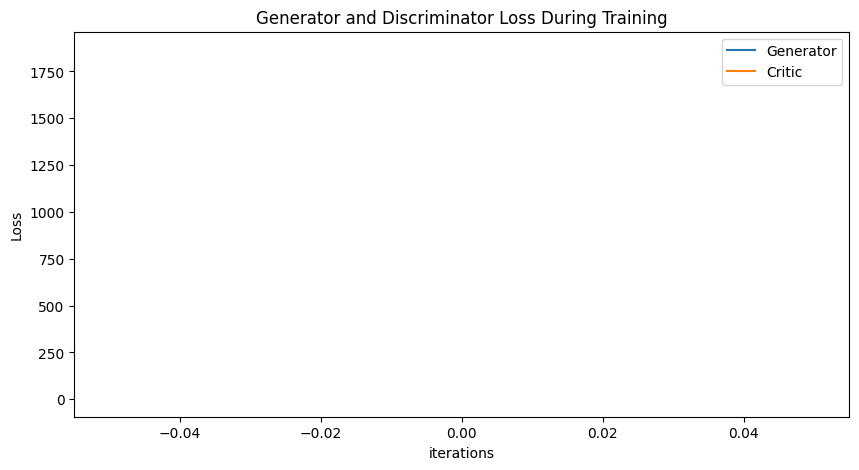

Epoch 10: Critic error ([1868.52258719174, 305.94334493116247, 213.58481425061265, 176.59259243298996, 124.79661441151603, 115.9392379072822, 90.0056526259892, 64.71774295739638, 44.62807518673945, 36.666525104483476, 27.177466700203297]) Generator err ([0.10074997693300247, -0.11045129597187042, -0.3521580994129181, -0.4537944793701172, -0.7786561250686646, -0.815312922000885, -0.7345256805419922, -0.6301448345184326, -0.5957955718040466, -0.4053910970687866, -0.2803550064563751])


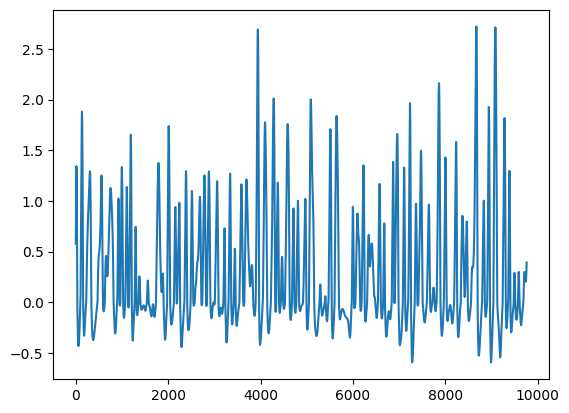

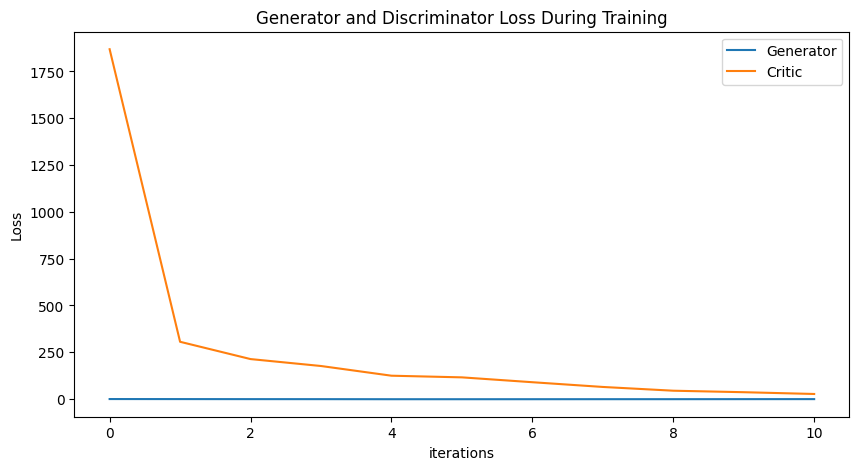

Epoch 20: Critic error ([1868.52258719174, 305.94334493116247, 213.58481425061265, 176.59259243298996, 124.79661441151603, 115.9392379072822, 90.0056526259892, 64.71774295739638, 44.62807518673945, 36.666525104483476, 27.177466700203297, 27.28634538706678, 24.957623861235763, 21.64304927410667, 18.65847489212949, 17.580995880205545, 15.985582023668961, 14.456246242441356, 11.018976978222025, 10.01779636519457, 11.378031136143886]) Generator err ([0.10074997693300247, -0.11045129597187042, -0.3521580994129181, -0.4537944793701172, -0.7786561250686646, -0.815312922000885, -0.7345256805419922, -0.6301448345184326, -0.5957955718040466, -0.4053910970687866, -0.2803550064563751, -0.3252880275249481, -0.2732486426830292, -0.27555450797080994, -0.22229987382888794, -0.1406821757555008, -0.14562033116817474, -0.0786379799246788, -0.15522700548171997, -0.07666710019111633, -0.07388947159051895])


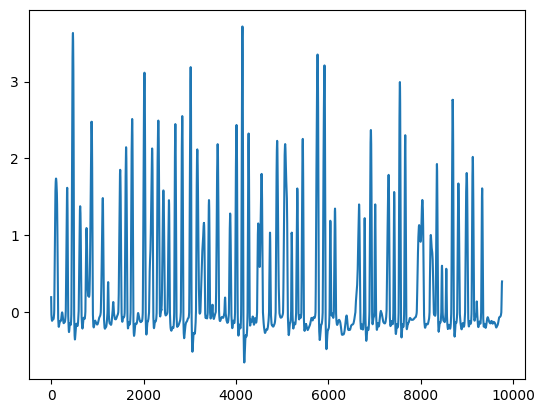

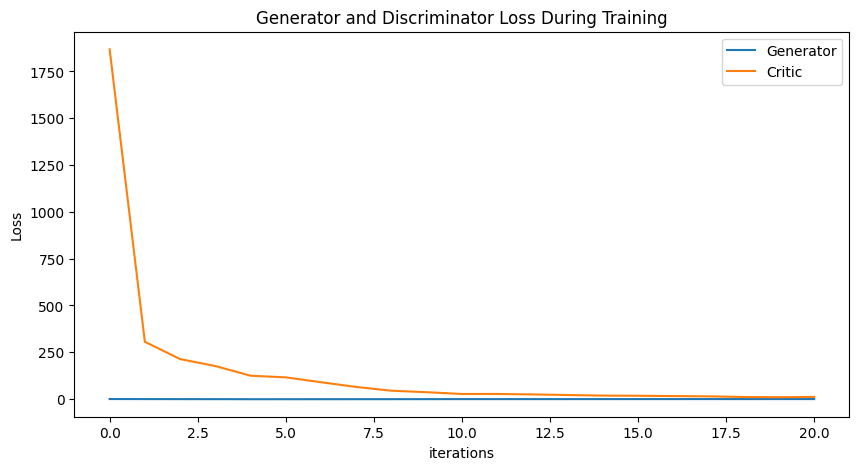

Epoch 30: Critic error ([1868.52258719174, 305.94334493116247, 213.58481425061265, 176.59259243298996, 124.79661441151603, 115.9392379072822, 90.0056526259892, 64.71774295739638, 44.62807518673945, 36.666525104483476, 27.177466700203297, 27.28634538706678, 24.957623861235763, 21.64304927410667, 18.65847489212949, 17.580995880205545, 15.985582023668961, 14.456246242441356, 11.018976978222025, 10.01779636519457, 11.378031136143886, 10.39282073383303, 7.926559883197368, 7.467698841126079, 7.570184206342662, 6.519387766854713, 7.019803442201598, 6.994210828825309, 5.025743375643145, 5.320191713738613, 5.5461718672202664]) Generator err ([0.10074997693300247, -0.11045129597187042, -0.3521580994129181, -0.4537944793701172, -0.7786561250686646, -0.815312922000885, -0.7345256805419922, -0.6301448345184326, -0.5957955718040466, -0.4053910970687866, -0.2803550064563751, -0.3252880275249481, -0.2732486426830292, -0.27555450797080994, -0.22229987382888794, -0.1406821757555008, -0.14562033116817474

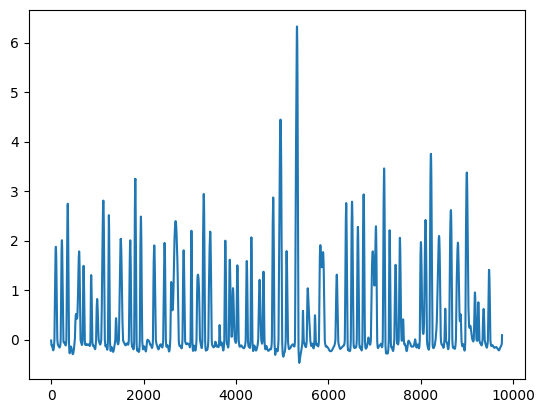

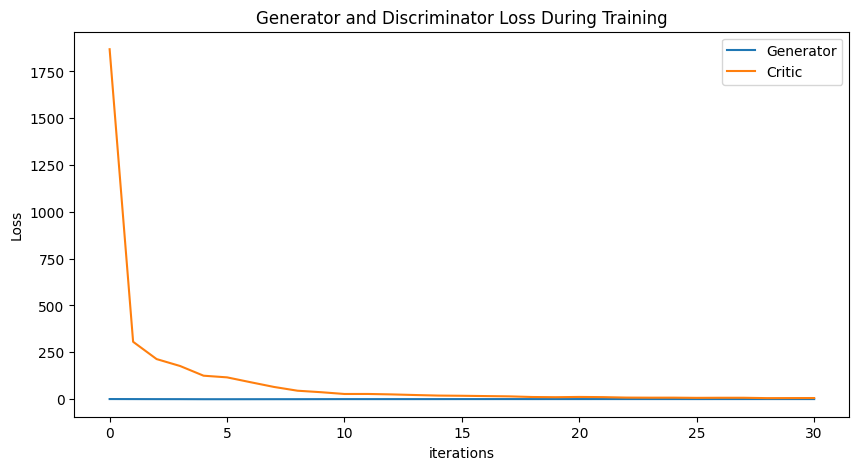

Epoch 40: Critic error ([1868.52258719174, 305.94334493116247, 213.58481425061265, 176.59259243298996, 124.79661441151603, 115.9392379072822, 90.0056526259892, 64.71774295739638, 44.62807518673945, 36.666525104483476, 27.177466700203297, 27.28634538706678, 24.957623861235763, 21.64304927410667, 18.65847489212949, 17.580995880205545, 15.985582023668961, 14.456246242441356, 11.018976978222025, 10.01779636519457, 11.378031136143886, 10.39282073383303, 7.926559883197368, 7.467698841126079, 7.570184206342662, 6.519387766854713, 7.019803442201598, 6.994210828825309, 5.025743375643145, 5.320191713738613, 5.5461718672202664, 4.73089999004921, 4.154446836350694, 3.9733249315062675, 3.96575558037088, 4.308426594977438, 4.003881567786026, 3.697756146812553, 4.5455563825759695, 3.0525000772561084, 3.760348049364686]) Generator err ([0.10074997693300247, -0.11045129597187042, -0.3521580994129181, -0.4537944793701172, -0.7786561250686646, -0.815312922000885, -0.7345256805419922, -0.6301448345184326,

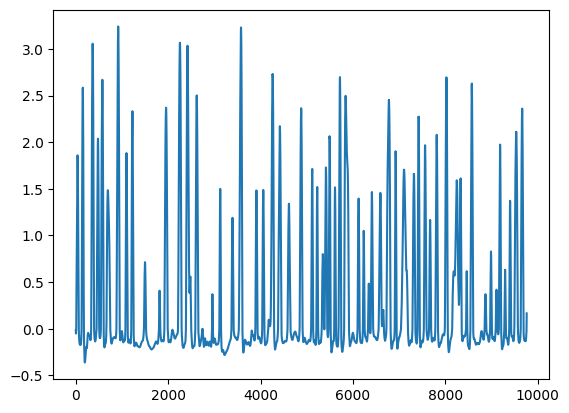

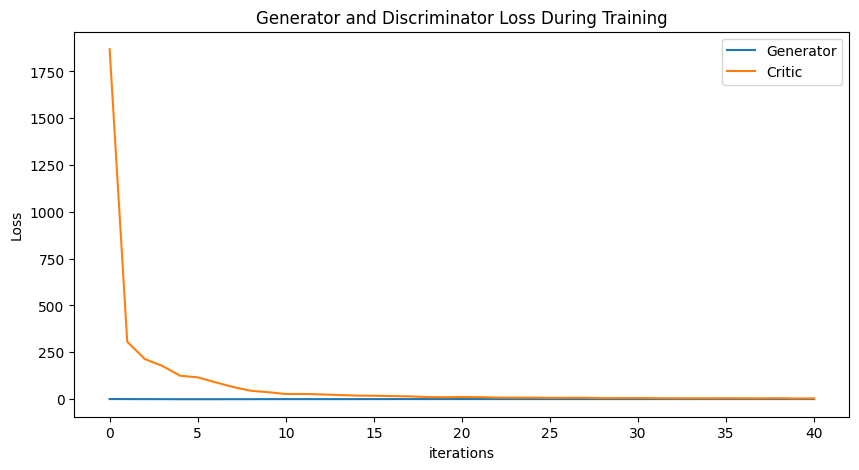

Epoch 50: Critic error ([1868.52258719174, 305.94334493116247, 213.58481425061265, 176.59259243298996, 124.79661441151603, 115.9392379072822, 90.0056526259892, 64.71774295739638, 44.62807518673945, 36.666525104483476, 27.177466700203297, 27.28634538706678, 24.957623861235763, 21.64304927410667, 18.65847489212949, 17.580995880205545, 15.985582023668961, 14.456246242441356, 11.018976978222025, 10.01779636519457, 11.378031136143886, 10.39282073383303, 7.926559883197368, 7.467698841126079, 7.570184206342662, 6.519387766854713, 7.019803442201598, 6.994210828825309, 5.025743375643145, 5.320191713738613, 5.5461718672202664, 4.73089999004921, 4.154446836350694, 3.9733249315062675, 3.96575558037088, 4.308426594977438, 4.003881567786026, 3.697756146812553, 4.5455563825759695, 3.0525000772561084, 3.760348049364686, 3.400673087769648, 3.0681777400695975, 2.933631274557364, 1.9752800603660763, 2.2119008499522663, 1.8372854321051513, 2.1128059690886025, 1.7742249440498927, 1.660233042792961, 1.44641

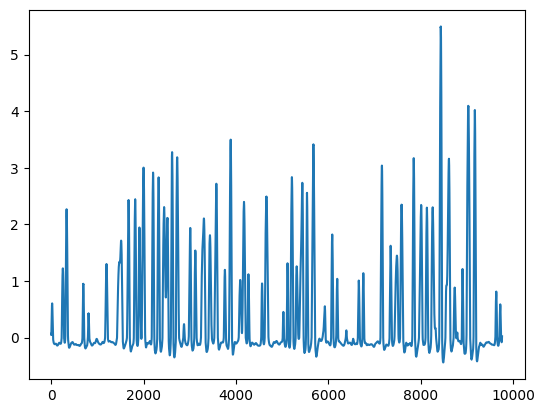

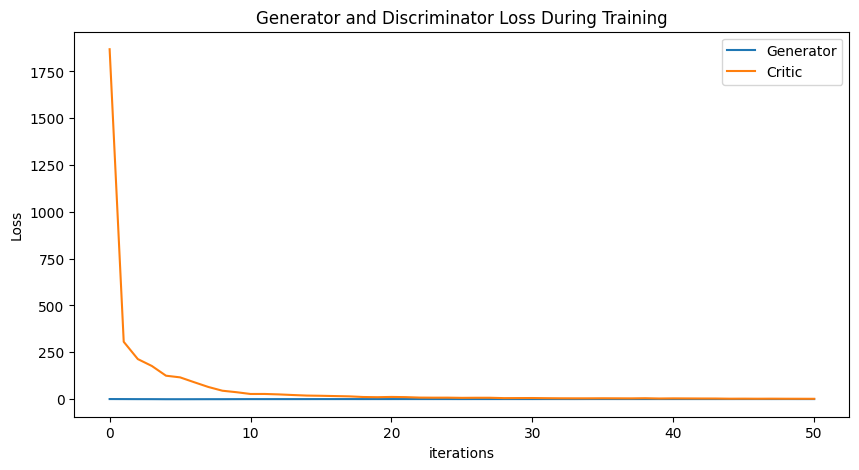

Epoch 60: Critic error ([1868.52258719174, 305.94334493116247, 213.58481425061265, 176.59259243298996, 124.79661441151603, 115.9392379072822, 90.0056526259892, 64.71774295739638, 44.62807518673945, 36.666525104483476, 27.177466700203297, 27.28634538706678, 24.957623861235763, 21.64304927410667, 18.65847489212949, 17.580995880205545, 15.985582023668961, 14.456246242441356, 11.018976978222025, 10.01779636519457, 11.378031136143886, 10.39282073383303, 7.926559883197368, 7.467698841126079, 7.570184206342662, 6.519387766854713, 7.019803442201598, 6.994210828825309, 5.025743375643145, 5.320191713738613, 5.5461718672202664, 4.73089999004921, 4.154446836350694, 3.9733249315062675, 3.96575558037088, 4.308426594977438, 4.003881567786026, 3.697756146812553, 4.5455563825759695, 3.0525000772561084, 3.760348049364686, 3.400673087769648, 3.0681777400695975, 2.933631274557364, 1.9752800603660763, 2.2119008499522663, 1.8372854321051513, 2.1128059690886025, 1.7742249440498927, 1.660233042792961, 1.44641

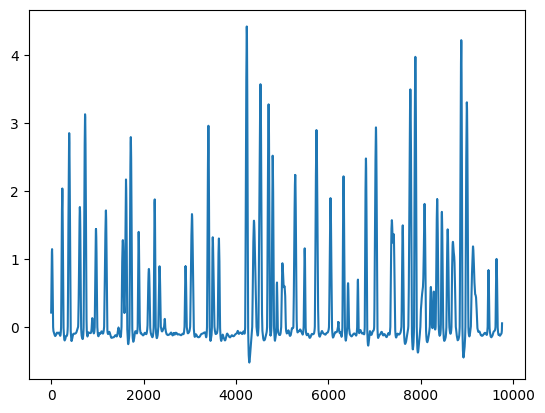

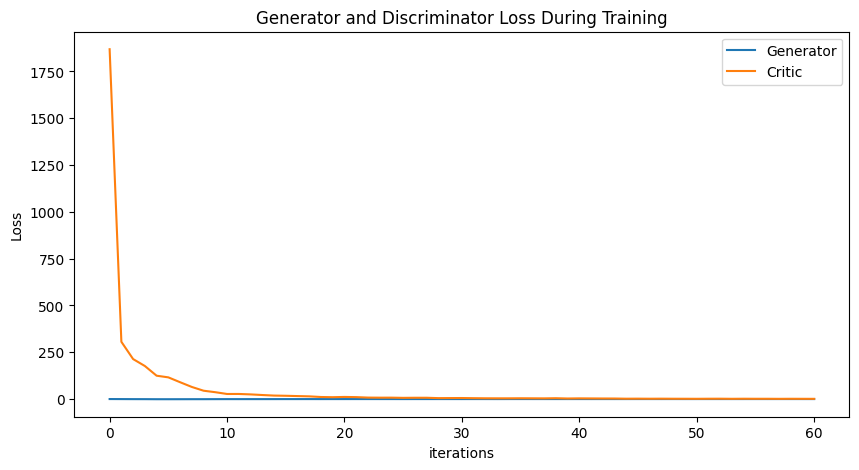

Epoch 70: Critic error ([1868.52258719174, 305.94334493116247, 213.58481425061265, 176.59259243298996, 124.79661441151603, 115.9392379072822, 90.0056526259892, 64.71774295739638, 44.62807518673945, 36.666525104483476, 27.177466700203297, 27.28634538706678, 24.957623861235763, 21.64304927410667, 18.65847489212949, 17.580995880205545, 15.985582023668961, 14.456246242441356, 11.018976978222025, 10.01779636519457, 11.378031136143886, 10.39282073383303, 7.926559883197368, 7.467698841126079, 7.570184206342662, 6.519387766854713, 7.019803442201598, 6.994210828825309, 5.025743375643145, 5.320191713738613, 5.5461718672202664, 4.73089999004921, 4.154446836350694, 3.9733249315062675, 3.96575558037088, 4.308426594977438, 4.003881567786026, 3.697756146812553, 4.5455563825759695, 3.0525000772561084, 3.760348049364686, 3.400673087769648, 3.0681777400695975, 2.933631274557364, 1.9752800603660763, 2.2119008499522663, 1.8372854321051513, 2.1128059690886025, 1.7742249440498927, 1.660233042792961, 1.44641

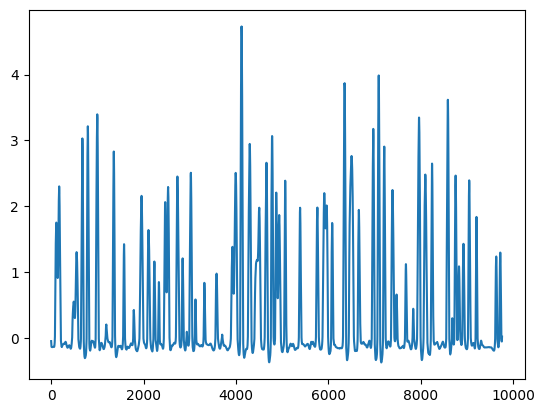

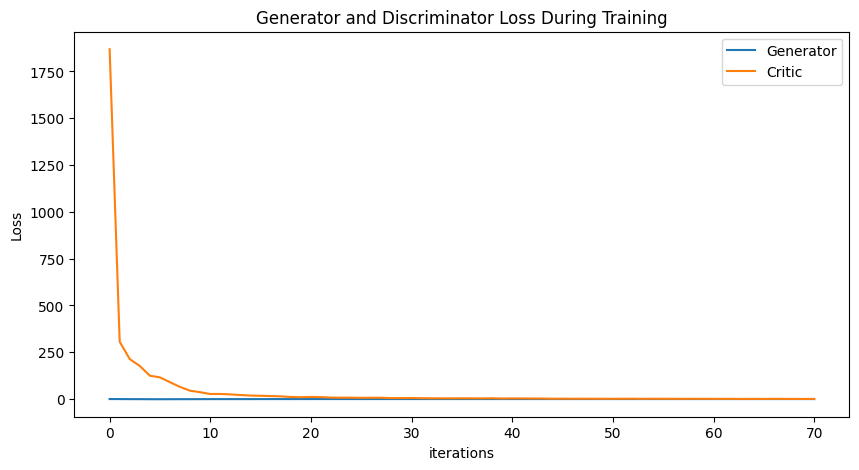

Epoch 80: Critic error ([1868.52258719174, 305.94334493116247, 213.58481425061265, 176.59259243298996, 124.79661441151603, 115.9392379072822, 90.0056526259892, 64.71774295739638, 44.62807518673945, 36.666525104483476, 27.177466700203297, 27.28634538706678, 24.957623861235763, 21.64304927410667, 18.65847489212949, 17.580995880205545, 15.985582023668961, 14.456246242441356, 11.018976978222025, 10.01779636519457, 11.378031136143886, 10.39282073383303, 7.926559883197368, 7.467698841126079, 7.570184206342662, 6.519387766854713, 7.019803442201598, 6.994210828825309, 5.025743375643145, 5.320191713738613, 5.5461718672202664, 4.73089999004921, 4.154446836350694, 3.9733249315062675, 3.96575558037088, 4.308426594977438, 4.003881567786026, 3.697756146812553, 4.5455563825759695, 3.0525000772561084, 3.760348049364686, 3.400673087769648, 3.0681777400695975, 2.933631274557364, 1.9752800603660763, 2.2119008499522663, 1.8372854321051513, 2.1128059690886025, 1.7742249440498927, 1.660233042792961, 1.44641

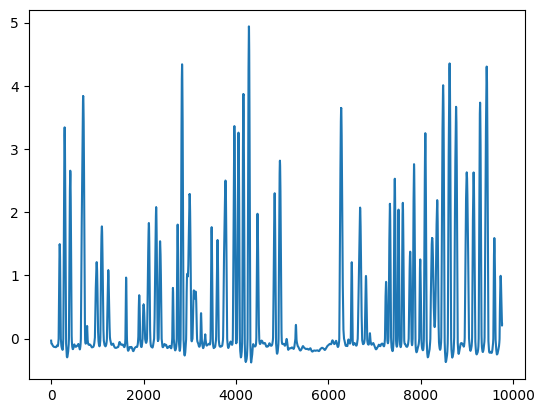

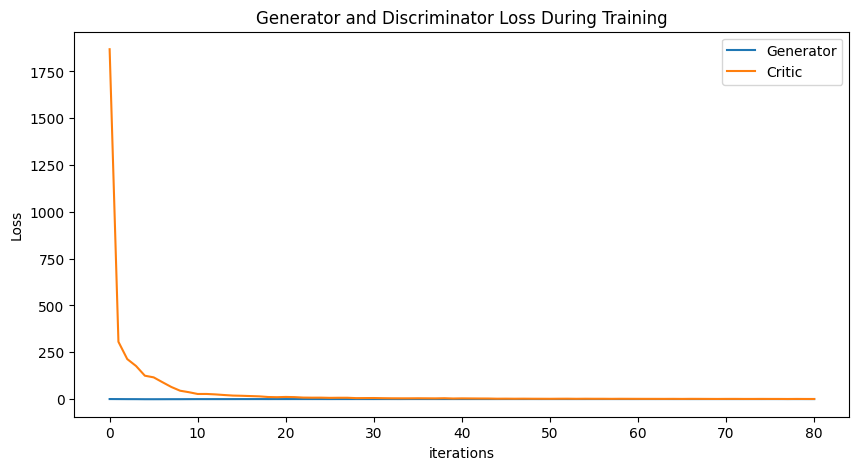

Epoch 90: Critic error ([1868.52258719174, 305.94334493116247, 213.58481425061265, 176.59259243298996, 124.79661441151603, 115.9392379072822, 90.0056526259892, 64.71774295739638, 44.62807518673945, 36.666525104483476, 27.177466700203297, 27.28634538706678, 24.957623861235763, 21.64304927410667, 18.65847489212949, 17.580995880205545, 15.985582023668961, 14.456246242441356, 11.018976978222025, 10.01779636519457, 11.378031136143886, 10.39282073383303, 7.926559883197368, 7.467698841126079, 7.570184206342662, 6.519387766854713, 7.019803442201598, 6.994210828825309, 5.025743375643145, 5.320191713738613, 5.5461718672202664, 4.73089999004921, 4.154446836350694, 3.9733249315062675, 3.96575558037088, 4.308426594977438, 4.003881567786026, 3.697756146812553, 4.5455563825759695, 3.0525000772561084, 3.760348049364686, 3.400673087769648, 3.0681777400695975, 2.933631274557364, 1.9752800603660763, 2.2119008499522663, 1.8372854321051513, 2.1128059690886025, 1.7742249440498927, 1.660233042792961, 1.44641

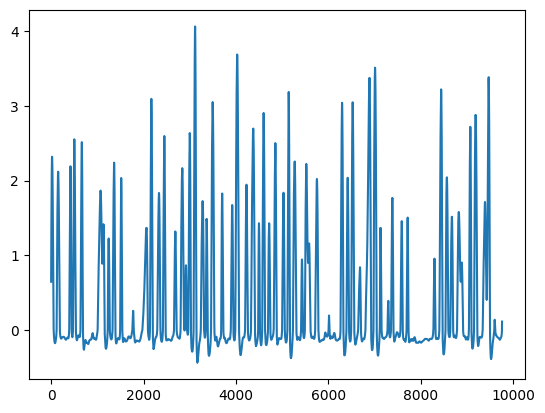

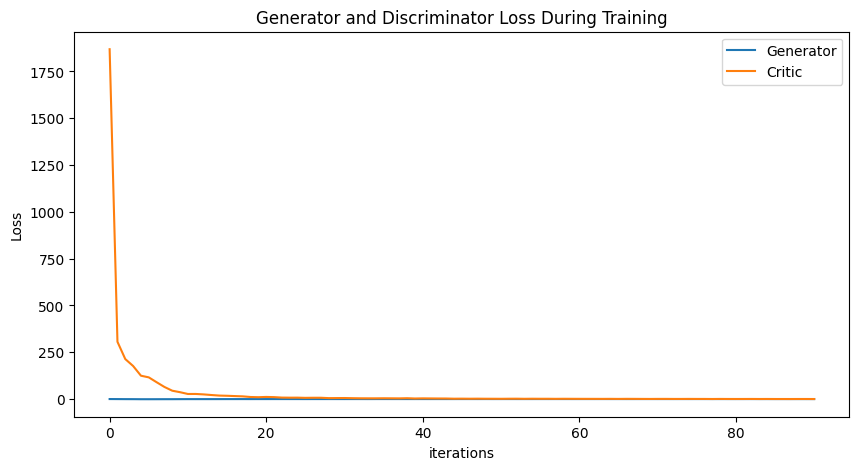

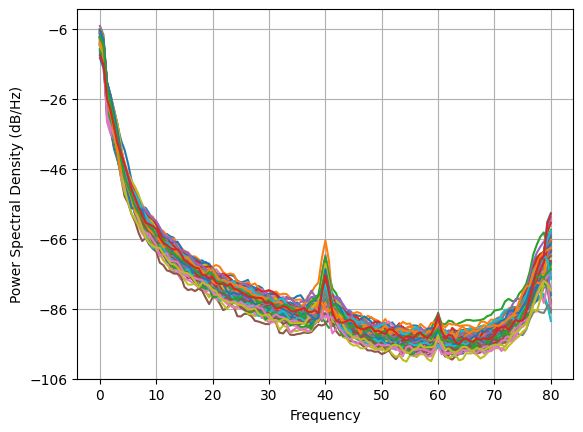

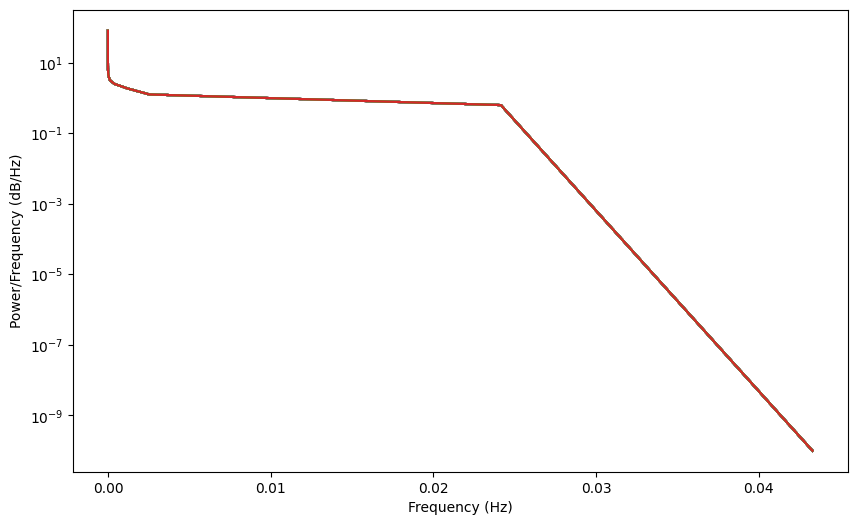

In [140]:
# baseline 

NUM_EPOCHS = 100
PRINT_INTERVAL = 10 # every 10 epoch, print status
BATCH_SIZE = np.shape(normalized_data_closed)[0]
NUM_CHANNELS = 64
SEQUENCE_LENGTH = 9760
LAMBDA_GP = 5

training_data = torch.tensor(normalized_data_closed)

def weights_init(model):
    for m in model.modules():
      if isinstance(m, (nn.Conv1d, nn.ConvTranspose1d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)

# Gaussian normal distribution
def sample_normal_distribution(i, j, k):
    mu = 0
    sigma = 0.02
    return torch.Tensor(np.random.normal(mu, sigma, (i, j, k)))

def gradient_penalty(D, real, fake):
    alpha = torch.rand((BATCH_SIZE, 1, 1)).repeat(1, NUM_CHANNELS, SEQUENCE_LENGTH)
    interpolated_seq = real * alpha + fake * (1 - alpha)

    # Calculate discriminator scores
    mixed_scores = D(interpolated_seq)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_seq,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-3)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-3)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            real = training_data.clone().detach()
            real.requires_grad=True
            noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
            fake = G(noise)
            critic_real = D(real).reshape(-1) # flatten
            critic_fake = D(fake).reshape(-1) # flatten
            gp = gradient_penalty(D, real, fake)
            critic_loss = -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
            D.zero_grad()
            critic_loss.backward(retain_graph=True)
            critic_optimizer.step()

        generated_data = fake
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()

        critic_err.append(critic_loss.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            values = generated_data[0, 0, :]
            plt.plot(values.tolist())
            plt.show()
            
            # plotting G vs D losses
            plt.figure(figsize=(10,5))
            plt.title("Generator and Discriminator Loss During Training")
            plt.plot(gen_err,label="Generator")
            plt.plot(critic_err,label="Critic")
            plt.xlabel("iterations")
            plt.ylabel("Loss")
            plt.legend()
            plt.show()

    return critic_err, gen_err, generated_data, D, G

critic_err_closed, gen_err_closed, generated_data_closed_filtered, disc, gen = train()

torch.save(gen, 'gen_closed_filtered.pt')
torch.save(disc, 'disc_closed_filtered.pt')

averaged_data = generated_data_closed_filtered.detach().mean(dim=0)
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()

# HIGHER EPOCH AND NORMALIZED

Epoch 0: Critic error ([2.7415199283327008]) Generator err ([0.026534052565693855])


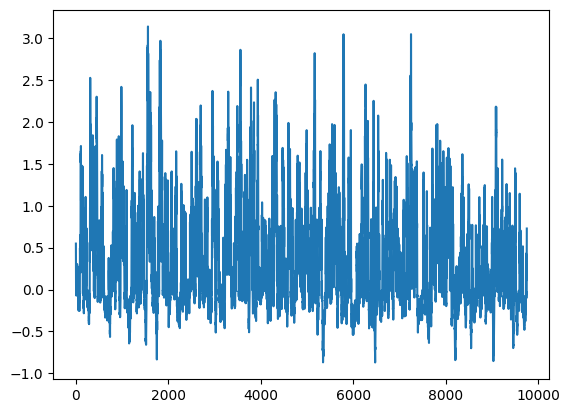

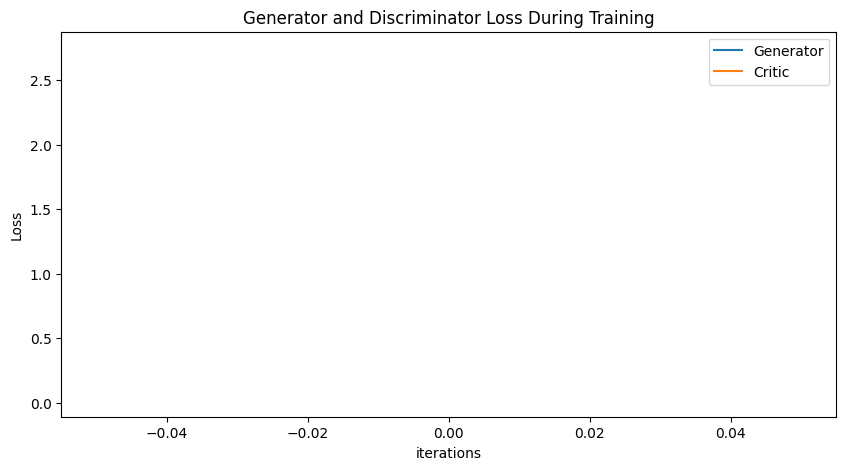

Epoch 50: Critic error ([2.7415199283327008, -0.04460550442568842, -0.3131981619138022, -0.7347254103980099, -0.8294282324694329, -1.949323271148777, -2.9296148123925576, -2.8891273494799545, -2.752909567058238, -3.0483983502864596, -2.264607708344603, -4.101896677402683, -3.428061532370948, -3.285282340602439, -3.917876653500776, -5.540131497686826, -4.398800962449955, -4.376988110580642, -3.932757443037101, -5.3701384331832, -4.474307259635974, -4.792628168125965, -4.971940438889551, -4.700090223923479, -5.009886443513787, -5.320452841771584, -4.554425411083842, -4.199159417834439, -3.749643931632333, -3.9516108044295883, -3.648492794863595, -3.3496782597314776, -3.41263061089549, -3.140220704218719, -2.9226967947200846, -2.9689870394661813, -3.1218431608367565, -3.34418289219682, -3.0877700179723044, -2.874122509855656, -2.7867236955257098, -2.7207731334212704, -2.722386342060914, -2.7485457387776395, -2.77870436054392, -2.804610099524394, -2.628828245211861, -2.8587419566256673, -2

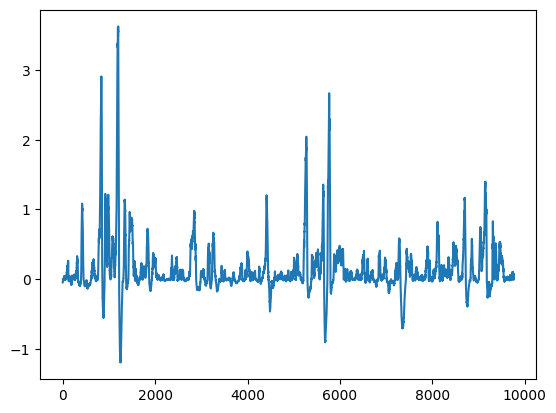

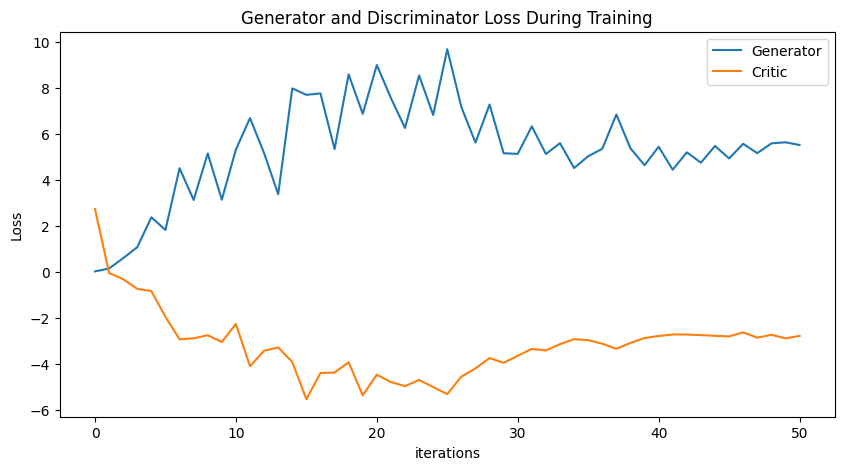

Epoch 100: Critic error ([2.7415199283327008, -0.04460550442568842, -0.3131981619138022, -0.7347254103980099, -0.8294282324694329, -1.949323271148777, -2.9296148123925576, -2.8891273494799545, -2.752909567058238, -3.0483983502864596, -2.264607708344603, -4.101896677402683, -3.428061532370948, -3.285282340602439, -3.917876653500776, -5.540131497686826, -4.398800962449955, -4.376988110580642, -3.932757443037101, -5.3701384331832, -4.474307259635974, -4.792628168125965, -4.971940438889551, -4.700090223923479, -5.009886443513787, -5.320452841771584, -4.554425411083842, -4.199159417834439, -3.749643931632333, -3.9516108044295883, -3.648492794863595, -3.3496782597314776, -3.41263061089549, -3.140220704218719, -2.9226967947200846, -2.9689870394661813, -3.1218431608367565, -3.34418289219682, -3.0877700179723044, -2.874122509855656, -2.7867236955257098, -2.7207731334212704, -2.722386342060914, -2.7485457387776395, -2.77870436054392, -2.804610099524394, -2.628828245211861, -2.8587419566256673, -

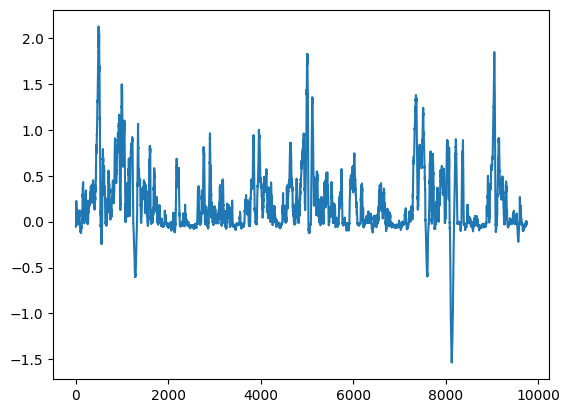

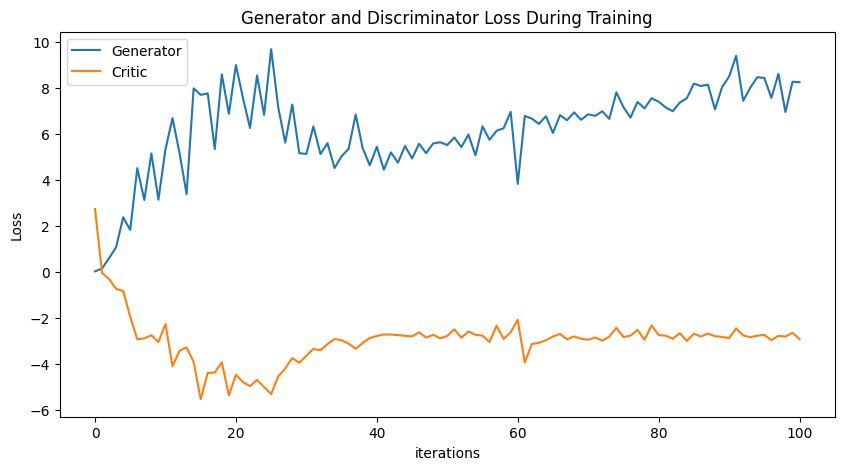

Epoch 150: Critic error ([2.7415199283327008, -0.04460550442568842, -0.3131981619138022, -0.7347254103980099, -0.8294282324694329, -1.949323271148777, -2.9296148123925576, -2.8891273494799545, -2.752909567058238, -3.0483983502864596, -2.264607708344603, -4.101896677402683, -3.428061532370948, -3.285282340602439, -3.917876653500776, -5.540131497686826, -4.398800962449955, -4.376988110580642, -3.932757443037101, -5.3701384331832, -4.474307259635974, -4.792628168125965, -4.971940438889551, -4.700090223923479, -5.009886443513787, -5.320452841771584, -4.554425411083842, -4.199159417834439, -3.749643931632333, -3.9516108044295883, -3.648492794863595, -3.3496782597314776, -3.41263061089549, -3.140220704218719, -2.9226967947200846, -2.9689870394661813, -3.1218431608367565, -3.34418289219682, -3.0877700179723044, -2.874122509855656, -2.7867236955257098, -2.7207731334212704, -2.722386342060914, -2.7485457387776395, -2.77870436054392, -2.804610099524394, -2.628828245211861, -2.8587419566256673, -

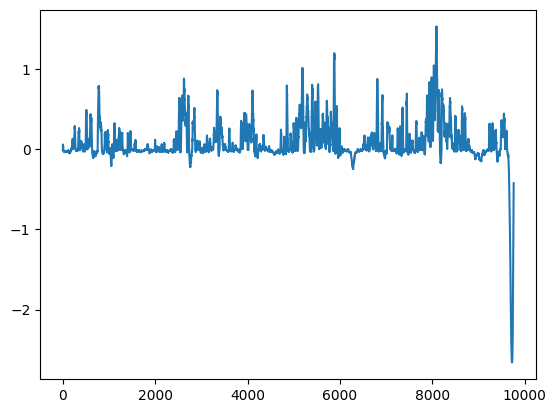

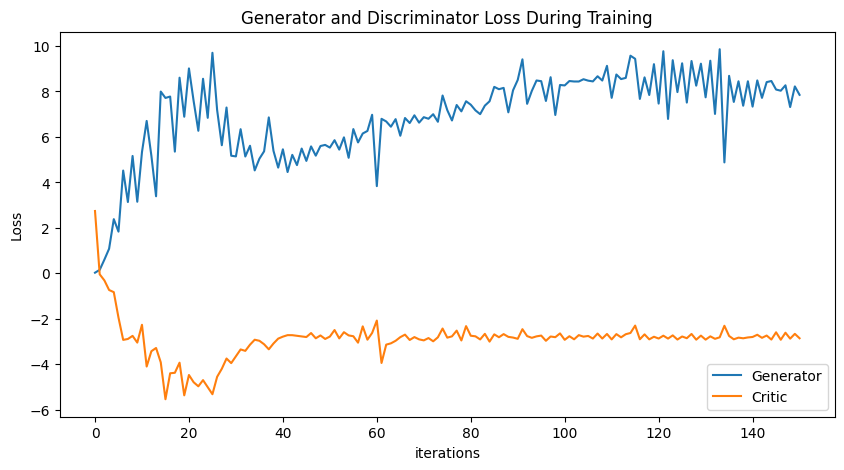

Epoch 200: Critic error ([2.7415199283327008, -0.04460550442568842, -0.3131981619138022, -0.7347254103980099, -0.8294282324694329, -1.949323271148777, -2.9296148123925576, -2.8891273494799545, -2.752909567058238, -3.0483983502864596, -2.264607708344603, -4.101896677402683, -3.428061532370948, -3.285282340602439, -3.917876653500776, -5.540131497686826, -4.398800962449955, -4.376988110580642, -3.932757443037101, -5.3701384331832, -4.474307259635974, -4.792628168125965, -4.971940438889551, -4.700090223923479, -5.009886443513787, -5.320452841771584, -4.554425411083842, -4.199159417834439, -3.749643931632333, -3.9516108044295883, -3.648492794863595, -3.3496782597314776, -3.41263061089549, -3.140220704218719, -2.9226967947200846, -2.9689870394661813, -3.1218431608367565, -3.34418289219682, -3.0877700179723044, -2.874122509855656, -2.7867236955257098, -2.7207731334212704, -2.722386342060914, -2.7485457387776395, -2.77870436054392, -2.804610099524394, -2.628828245211861, -2.8587419566256673, -

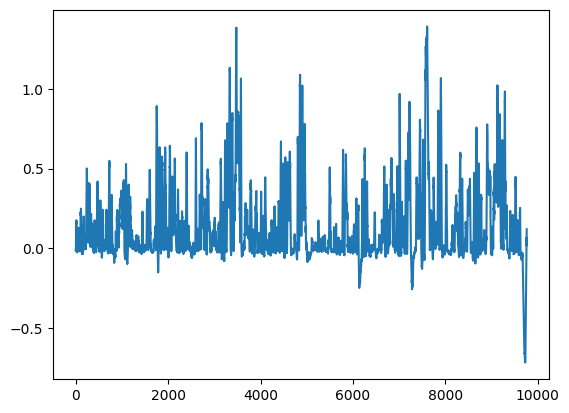

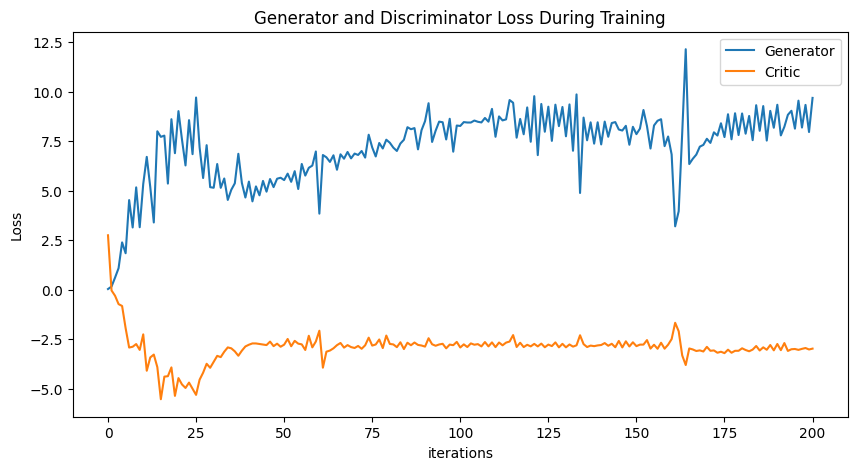

Epoch 250: Critic error ([2.7415199283327008, -0.04460550442568842, -0.3131981619138022, -0.7347254103980099, -0.8294282324694329, -1.949323271148777, -2.9296148123925576, -2.8891273494799545, -2.752909567058238, -3.0483983502864596, -2.264607708344603, -4.101896677402683, -3.428061532370948, -3.285282340602439, -3.917876653500776, -5.540131497686826, -4.398800962449955, -4.376988110580642, -3.932757443037101, -5.3701384331832, -4.474307259635974, -4.792628168125965, -4.971940438889551, -4.700090223923479, -5.009886443513787, -5.320452841771584, -4.554425411083842, -4.199159417834439, -3.749643931632333, -3.9516108044295883, -3.648492794863595, -3.3496782597314776, -3.41263061089549, -3.140220704218719, -2.9226967947200846, -2.9689870394661813, -3.1218431608367565, -3.34418289219682, -3.0877700179723044, -2.874122509855656, -2.7867236955257098, -2.7207731334212704, -2.722386342060914, -2.7485457387776395, -2.77870436054392, -2.804610099524394, -2.628828245211861, -2.8587419566256673, -

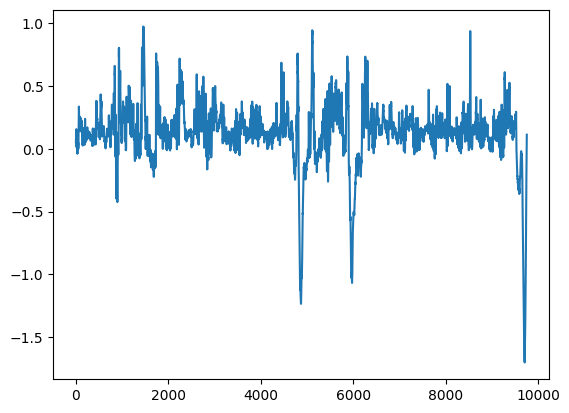

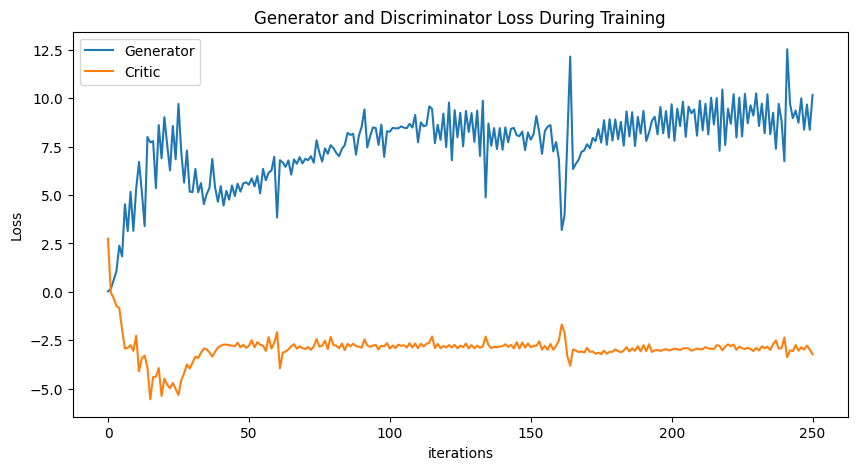

Epoch 300: Critic error ([2.7415199283327008, -0.04460550442568842, -0.3131981619138022, -0.7347254103980099, -0.8294282324694329, -1.949323271148777, -2.9296148123925576, -2.8891273494799545, -2.752909567058238, -3.0483983502864596, -2.264607708344603, -4.101896677402683, -3.428061532370948, -3.285282340602439, -3.917876653500776, -5.540131497686826, -4.398800962449955, -4.376988110580642, -3.932757443037101, -5.3701384331832, -4.474307259635974, -4.792628168125965, -4.971940438889551, -4.700090223923479, -5.009886443513787, -5.320452841771584, -4.554425411083842, -4.199159417834439, -3.749643931632333, -3.9516108044295883, -3.648492794863595, -3.3496782597314776, -3.41263061089549, -3.140220704218719, -2.9226967947200846, -2.9689870394661813, -3.1218431608367565, -3.34418289219682, -3.0877700179723044, -2.874122509855656, -2.7867236955257098, -2.7207731334212704, -2.722386342060914, -2.7485457387776395, -2.77870436054392, -2.804610099524394, -2.628828245211861, -2.8587419566256673, -

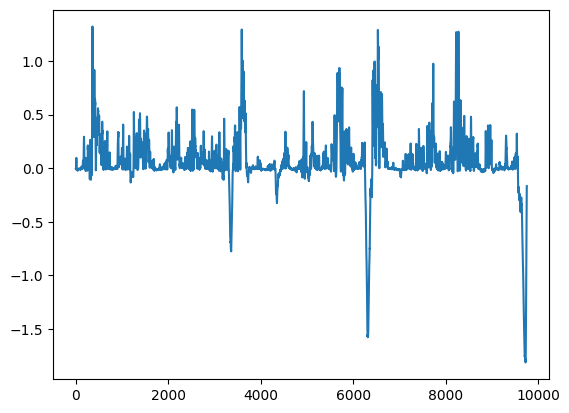

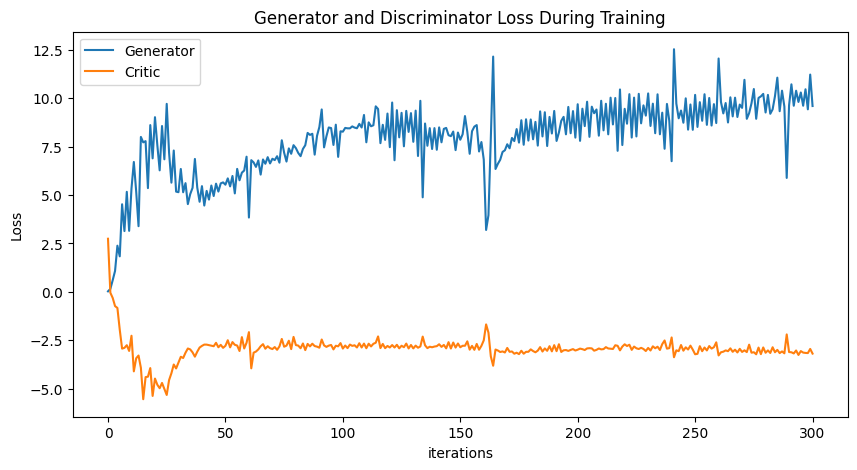

Epoch 350: Critic error ([2.7415199283327008, -0.04460550442568842, -0.3131981619138022, -0.7347254103980099, -0.8294282324694329, -1.949323271148777, -2.9296148123925576, -2.8891273494799545, -2.752909567058238, -3.0483983502864596, -2.264607708344603, -4.101896677402683, -3.428061532370948, -3.285282340602439, -3.917876653500776, -5.540131497686826, -4.398800962449955, -4.376988110580642, -3.932757443037101, -5.3701384331832, -4.474307259635974, -4.792628168125965, -4.971940438889551, -4.700090223923479, -5.009886443513787, -5.320452841771584, -4.554425411083842, -4.199159417834439, -3.749643931632333, -3.9516108044295883, -3.648492794863595, -3.3496782597314776, -3.41263061089549, -3.140220704218719, -2.9226967947200846, -2.9689870394661813, -3.1218431608367565, -3.34418289219682, -3.0877700179723044, -2.874122509855656, -2.7867236955257098, -2.7207731334212704, -2.722386342060914, -2.7485457387776395, -2.77870436054392, -2.804610099524394, -2.628828245211861, -2.8587419566256673, -

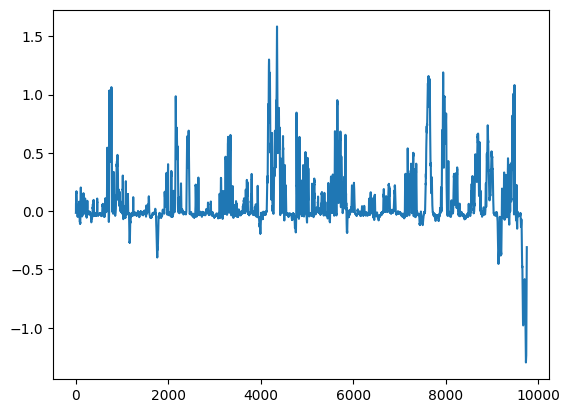

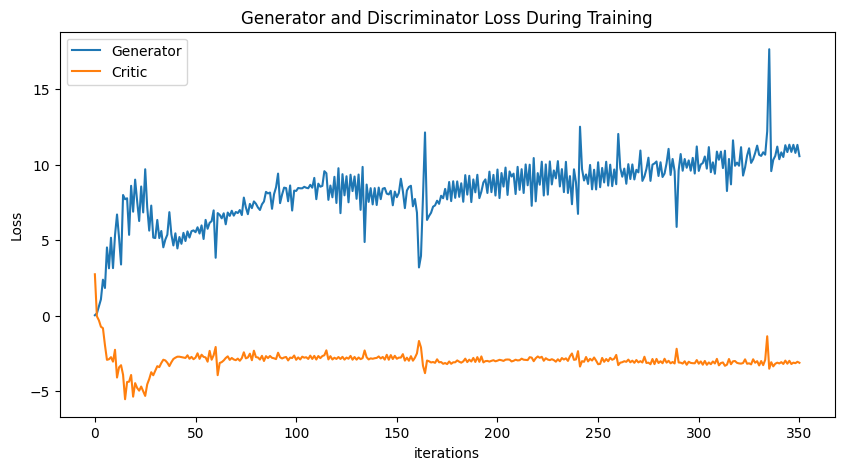

Epoch 400: Critic error ([2.7415199283327008, -0.04460550442568842, -0.3131981619138022, -0.7347254103980099, -0.8294282324694329, -1.949323271148777, -2.9296148123925576, -2.8891273494799545, -2.752909567058238, -3.0483983502864596, -2.264607708344603, -4.101896677402683, -3.428061532370948, -3.285282340602439, -3.917876653500776, -5.540131497686826, -4.398800962449955, -4.376988110580642, -3.932757443037101, -5.3701384331832, -4.474307259635974, -4.792628168125965, -4.971940438889551, -4.700090223923479, -5.009886443513787, -5.320452841771584, -4.554425411083842, -4.199159417834439, -3.749643931632333, -3.9516108044295883, -3.648492794863595, -3.3496782597314776, -3.41263061089549, -3.140220704218719, -2.9226967947200846, -2.9689870394661813, -3.1218431608367565, -3.34418289219682, -3.0877700179723044, -2.874122509855656, -2.7867236955257098, -2.7207731334212704, -2.722386342060914, -2.7485457387776395, -2.77870436054392, -2.804610099524394, -2.628828245211861, -2.8587419566256673, -

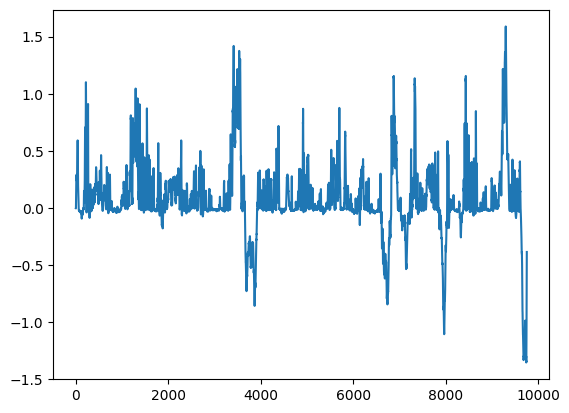

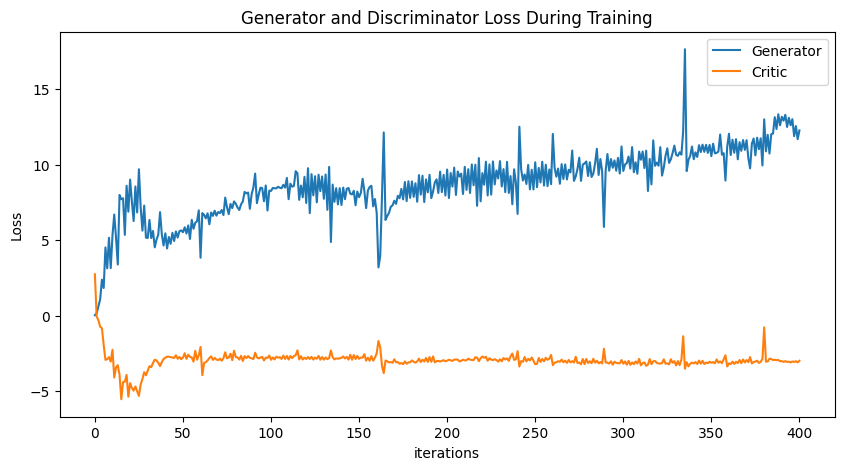

Epoch 450: Critic error ([2.7415199283327008, -0.04460550442568842, -0.3131981619138022, -0.7347254103980099, -0.8294282324694329, -1.949323271148777, -2.9296148123925576, -2.8891273494799545, -2.752909567058238, -3.0483983502864596, -2.264607708344603, -4.101896677402683, -3.428061532370948, -3.285282340602439, -3.917876653500776, -5.540131497686826, -4.398800962449955, -4.376988110580642, -3.932757443037101, -5.3701384331832, -4.474307259635974, -4.792628168125965, -4.971940438889551, -4.700090223923479, -5.009886443513787, -5.320452841771584, -4.554425411083842, -4.199159417834439, -3.749643931632333, -3.9516108044295883, -3.648492794863595, -3.3496782597314776, -3.41263061089549, -3.140220704218719, -2.9226967947200846, -2.9689870394661813, -3.1218431608367565, -3.34418289219682, -3.0877700179723044, -2.874122509855656, -2.7867236955257098, -2.7207731334212704, -2.722386342060914, -2.7485457387776395, -2.77870436054392, -2.804610099524394, -2.628828245211861, -2.8587419566256673, -

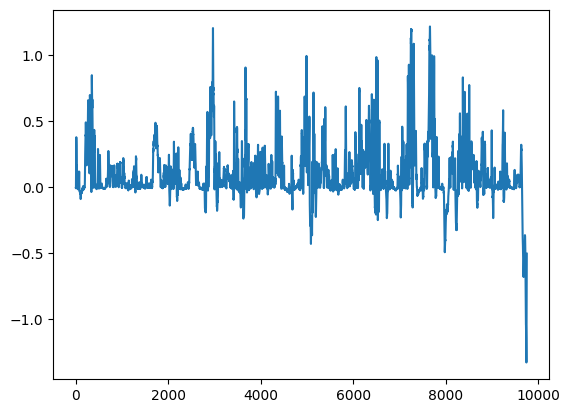

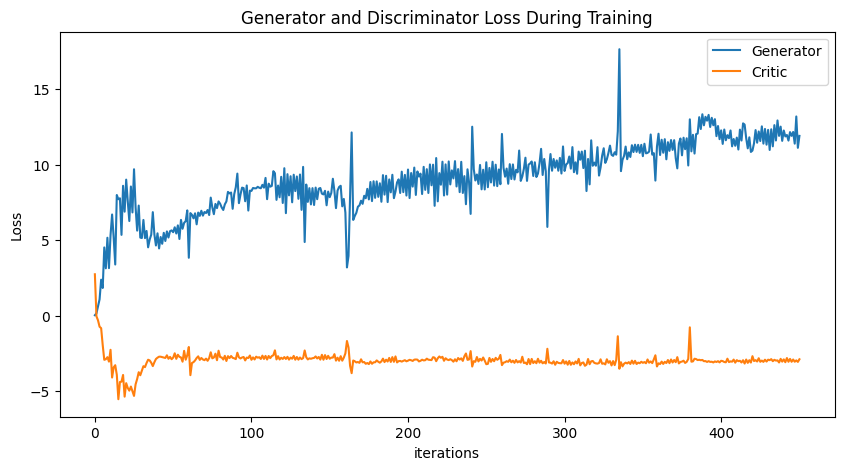

In [141]:
# baseline 

NUM_EPOCHS = 500
PRINT_INTERVAL = 50 # every 10 epoch, print status
BATCH_SIZE = np.shape(normalized_data_open)[0]
NUM_CHANNELS = 64
SEQUENCE_LENGTH = 9760
LAMBDA_GP = 5

training_data = torch.tensor(normalized_data_open)

def weights_init(model):
    for m in model.modules():
      if isinstance(m, (nn.Conv1d, nn.ConvTranspose1d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)

# Gaussian normal distribution
def sample_normal_distribution(i, j, k):
    mu = 0
    sigma = 0.02
    return torch.Tensor(np.random.normal(mu, sigma, (i, j, k)))

def gradient_penalty(D, real, fake):
    alpha = torch.rand((BATCH_SIZE, 1, 1)).repeat(1, NUM_CHANNELS, SEQUENCE_LENGTH)
    interpolated_seq = real * alpha + fake * (1 - alpha)

    # Calculate discriminator scores
    mixed_scores = D(interpolated_seq)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_seq,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            real = training_data.clone().detach()
            real.requires_grad=True
            noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
            fake = G(noise)
            critic_real = D(real).reshape(-1) # flatten
            critic_fake = D(fake).reshape(-1) # flatten
            gp = gradient_penalty(D, real, fake)
            critic_loss = -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
            D.zero_grad()
            critic_loss.backward(retain_graph=True)
            critic_optimizer.step()

        generated_data = fake
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()

        critic_err.append(critic_loss.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            values = generated_data[0, 0, :]
            plt.plot(values.tolist())
            plt.show()
            
            # plotting G vs D losses
            plt.figure(figsize=(10,5))
            plt.title("Generator and Discriminator Loss During Training")
            plt.plot(gen_err,label="Generator")
            plt.plot(critic_err,label="Critic")
            plt.xlabel("iterations")
            plt.ylabel("Loss")
            plt.legend()
            plt.show()

    return critic_err, gen_err, generated_data, D, G

critic_err_open, gen_err_open, generated_data_open_filtered_1, disc, gen = train()

torch.save(gen, 'gen_open_filtered_1.pt')
torch.save(disc, 'disc_open_filtered_1.pt')


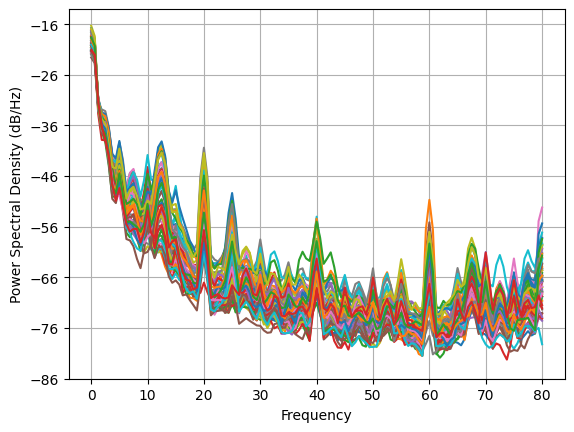

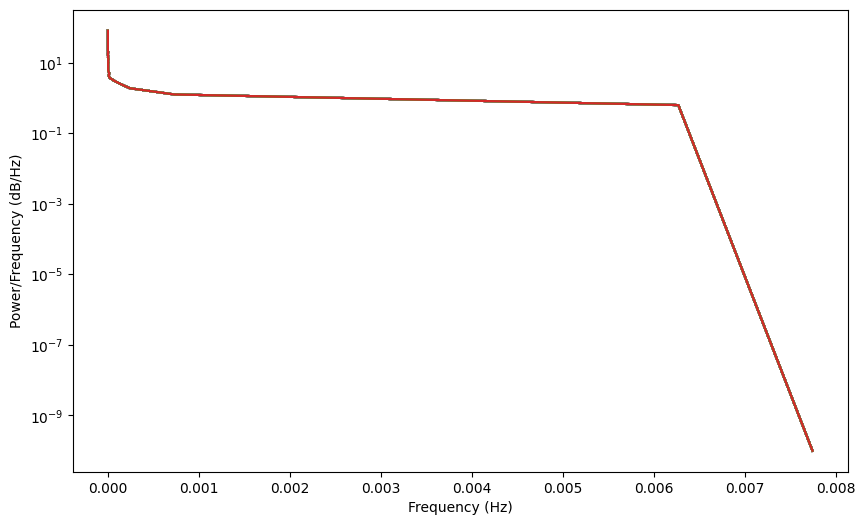

In [142]:
averaged_data = generated_data_open_filtered_1.detach().mean(dim=0)
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')

print("eyes open")
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()